In [11]:
import os
os.environ["JAX_ENABLE_X64"] = "True"
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import sys
import pandas as pd
from matplotlib import cm
import matplotlib as mp
import matplotlib.colors as mcolors
import scipy.special as sc
import scipy.optimize as so
from matplotlib.colors import LinearSegmentedColormap

In [12]:
def exp_Ansatz(x,k,*d):
    # Ensure x is a numpy array
    x = np.array(x, dtype=float)
    d_aux=np.zeros_like(x)
    for i in range(len(d)-1):
        d_aux+=d[i] * x**(i+1) 
    d_aux+=d[len(d)-1]
    #d_aux=d0+d*x
    prob = np.ones_like(x)  # Initialize an array for probabilities
    
    # Handle each element in x independently due to range(1, x_i + 1)
    for i, x_i in enumerate(x):
        for j in range(1, int(x_i) + 1):  # Loop from 1 to x_i (inclusive)
            prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))
    
    return prob*k

In [13]:
def log_Ansatz(x, k, d, d0):
    
    A=np.log(k)+sc.gammaln(d*x+d0 + 1) - sc.gammaln(x*L*W + 1) - sc.gammaln(d*x+d0 - x*L*W + 1)-np.log(2)*(d*x+d0)
    return A
    

In [14]:



def Ansatz(x, k, d, d0):
    
    EE=2**(d*x+d0)
    AA=k*sc.binom(d*x+d0,x*L)/EE     
    return AA
    #A=sc.gammaln(d*x+d0 + 1) - sc.gammaln(x*L + 1) - sc.gammaln(d*x+d0 - x*L + 1)-np.log(2)*(d*x+d0)

    #return np.exp(A,dtype=np.float64)
    
    
def log_Ansatz(x, k, d, d0):
    
    A=np.log(k)+sc.gammaln(d*x+d0 + 1) - sc.gammaln(x*L*W + 1) - sc.gammaln(d*x+d0 - x*L*W + 1)-np.log(2)*(d*x+d0)
    return np.exp(A)
    
    
def logKL(X,Y):
    return sum(map(lambda x: x[0]*np.log(x[0]/x[1]),zip(X,Y)))

def bounds(x,L):
    
    eps=10**(-6)
    #print("x",len(x))
    aux=np.array(x[0:int(L/2)])
    #print(aux.argmax())
    max=aux.argmax()
    if max<int(L/2):
        return max
    else:
        return int(L/2)-1


def initial_guess(x,L,eps):
    maxi=bounds(x,L)
    delta_left=maxi
    while delta_left>0 and x[delta_left]>eps:
        delta_left-=1
    delta_left+=1
    delta_right=maxi
    while delta_right<int(L*0.48) and x[delta_right]>eps:
        delta_right+=1
    delta_right-=1
    return [delta_left,maxi,delta_right]

def fit(F,X,Y,guesses):
    Nd=len(guesses)
    Ntry=200
    KL=10
    RV=[X[0],X[len(X)-1]]
    try:
        A=so.curve_fit(F,X,Y,p0=guesses)
        YY=F(X,*A[0])
        KL_try=logKL(Y/np.sum(Y),YY/np.sum(YY))
        bestA=A
        bestKL=KL_try
        bestRV=[0,len(X)-1]
    except:
        bestA=[np.array([np.nan for x in range(Nd)]),np.full((Nd,Nd),np.nan)]
        KL_try=np.nan
        bestKL=np.nan
        bestRV=RV
        
    
    if KL_try>0.0001:
        print("INSIDE")
        for i in range(Ntry):
            try:
                guesses[Nd-1]-=1
                X_test=X[:len(X)-i]
                Y_test=Y[:len(Y)-i]
                A=so.curve_fit(F,X_test,Y_test,p0=guesses)
                YY=F(X,A[0][0],A[0][1],A[0][2])
                KL_test=logKL(Y_test/np.sum(Y_test),YY/np.sum(YY))
                if KL_test<bestKL or bestKL==np.nan:
                    bestKL=KL_test
                    bestA=A
                    bestRV=[0,len(X)-i-1]
                    
                print(i,KL_test,bestKL,"interval=[",X[bestRV[0]],",",X[bestRV[1]],"]")
            except:
                continue
    print("final parameters:")
    print([bestA,bestKL,bestRV])
    return [bestA,bestKL,bestRV]



def d(r,d0,d1,d2):
    return d0+r*d1+d2*(r**2)

def der_d(r,d0,d1,d2):
    return d1+2*r*d2

def grad_KL(r,d0,d1,d2):
    dr=d(r,d0,d1,d2)
    return -(sc.digamma(dr+1)-sc.digamma(dr-r*L+1)-dr/2)
    
def av_min(P,x,d0,d1,d2,n):
    sum=0
    for p in range(len(P)):
        aux=P[p]*grad_KL(x[p],d0,d1,d2)
        sum+=P[p]*grad_KL(x[p],d0,d1,d2)*(float(x[p])*1.0)**n
    return sum



def opt_step(P,x,k,d0,d1,d2,alp):
    
    
    d0_new=d0-alp*av_min(P,x,d0,d1,d2,0)
    d1_new=d1-alp*av_min(P,x,d0,d1,d2,1)
    d2_new=d2-alp*av_min(P,x,d0,d1,d2,2)
    k_new=k+alp*np.sum(P)
    
    return [k_new,d0_new,d1_new,d2_new]

def optimizer(P,k,d0,d1,d2,alp,N,alp_I,alp_F):
    
    KL=[]
    x=np.arange(alp_I,alp_F,1)/L
    k_aux=k
    d0_aux=d0
    d1_aux=d1
    d2_aux=d2
    print("initial",k,d0,d1,d2)
    for i in range(N):
        #print(d0_aux,d1_aux,d2_aux)
        aux=opt_step(P,x,k_aux,d0_aux,d1_aux,d2_aux,alp)
        k_aux=aux[0]
        d0_aux=aux[1]
        d1_aux=aux[2]
        d2_aux=aux[3]
        Y=Ansatz(x,k,d0_aux,d1_aux)
        KL.append(logKL(P,Y))
    print("d0","d1","d2")
    print(k_aux,d0_aux,d1_aux,d2_aux)
    return [KL,[k_aux,d0_aux,d1_aux,d2_aux]]
    

<>:37: SyntaxWarning: invalid escape sequence '\s'
<>:37: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_2661/1964705627.py:37: SyntaxWarning: invalid escape sequence '\s'
  file=[pd.read_csv(name[j],sep="\s+",dtype="a") for j in range(n_mean)]


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
[35, 49, 48]
final parameters:
[(array([ 1.25164702e+00,  9.76778303e-01, -5.85653737e-03,  1.58628005e+02]), array([[ 7.42951604e-04, -1.09736720e-02,  6.54183069e-05,
         4.64137884e-01],
       [-1.09736720e-02,  1.87817835e-01, -1.10978608e-03,
        -8.00747744e+00],
       [ 6.54183069e-05, -1.10978608e-03,  6.56117848e-06,
         4.72908918e-02],
       [ 4.64137884e-01, -8.00747744e+00,  4.72908918e-02,
         3.41553439e+02]])), 3.6333069297148924e-05, [0, 12]]
[0, 12]
0 12
[70 72 74 76 78 80 82 84 86 88 90 92]
3.6333069297148924e-05
(array([ 1.25164702e+00,  9.76778303e-01, -5.85653737e-03,  1.58628005e+02]), array([[ 7.42951604e-04, -1.09736720e-02,  6.54183069e-05,
         4.64137884e-01],
       [-1.09736720e-02,  1.87817835e-01, -1.10978608e-03,
        -8.00747744e+00],
       [ 6.54183069e-05, -1.10978608e

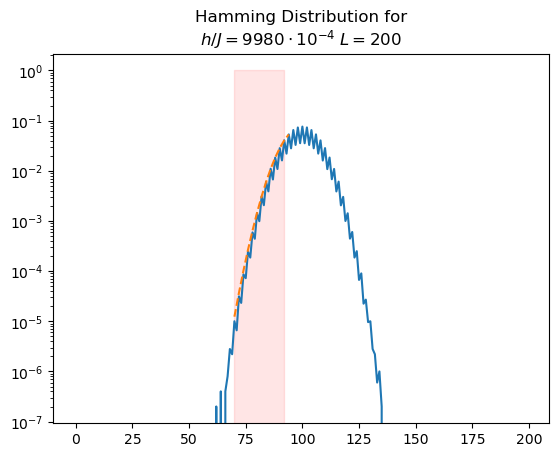

[36, 49, 48]
final parameters:
[(array([ 1.25510845e+00, -5.06568498e-02,  4.13335847e-04,  2.01213521e+02]), array([[ 1.62756647e-03, -1.82972973e-02,  1.09789598e-04,
         7.70863774e-01],
       [-1.82972973e-02,  2.30941753e-01, -1.37488984e-03,
        -9.79751872e+00],
       [ 1.09789598e-04, -1.37488984e-03,  8.18975952e-06,
         5.82997878e-02],
       [ 7.70863774e-01, -9.79751872e+00,  5.82997878e-02,
         4.15838412e+02]])), 6.5632514294678335e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
6.5632514294678335e-06
(array([ 1.25510845e+00, -5.06568498e-02,  4.13335847e-04,  2.01213521e+02]), array([[ 1.62756647e-03, -1.82972973e-02,  1.09789598e-04,
         7.70863774e-01],
       [-1.82972973e-02,  2.30941753e-01, -1.37488984e-03,
        -9.79751872e+00],
       [ 1.09789598e-04, -1.37488984e-03,  8.18975952e-06,
         5.82997878e-02],
       [ 7.70863774e-01, -9.79751872e+00,  5.82997878e-02,
         4.15838412e+02]]))
[4.03431094e-02 4.80563

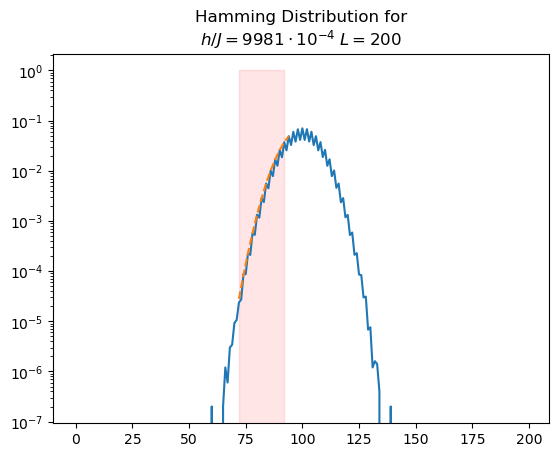

[36, 49, 48]
final parameters:
[(array([ 1.17788616e+00, -1.01500947e-01,  7.37889721e-04,  2.03279356e+02]), array([[ 4.82189359e-04, -5.63664739e-03,  3.38392209e-05,
         2.37408558e-01],
       [-5.63664739e-03,  7.39504796e-02, -4.40467373e-04,
        -3.13652992e+00],
       [ 3.38392209e-05, -4.40467373e-04,  2.62498657e-06,
         1.86726338e-02],
       [ 2.37408558e-01, -3.13652992e+00,  1.86726338e-02,
         1.33092669e+02]])), 4.261506033067292e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
4.261506033067292e-06
(array([ 1.17788616e+00, -1.01500947e-01,  7.37889721e-04,  2.03279356e+02]), array([[ 4.82189359e-04, -5.63664739e-03,  3.38392209e-05,
         2.37408558e-01],
       [-5.63664739e-03,  7.39504796e-02, -4.40467373e-04,
        -3.13652992e+00],
       [ 3.38392209e-05, -4.40467373e-04,  2.62498657e-06,
         1.86726338e-02],
       [ 2.37408558e-01, -3.13652992e+00,  1.86726338e-02,
         1.33092669e+02]]))
[2.19588105e-02 2.7193837

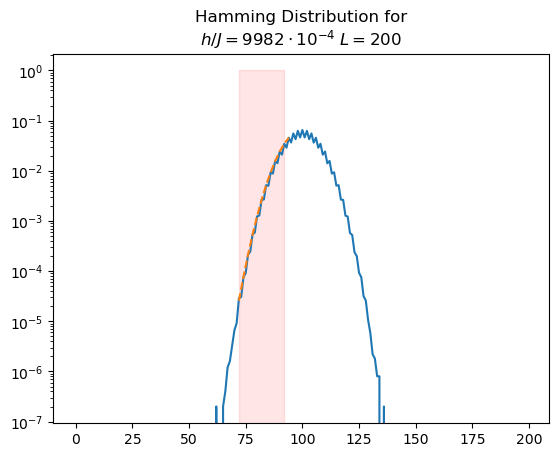

[35, 49, 48]
final parameters:
[(array([ 1.24689267e+00,  3.23005871e-01, -1.88851861e-03,  1.85859268e+02]), array([[ 7.67891322e-05, -9.70245850e-04,  5.80520864e-06,
         4.09469997e-02],
       [-9.70245850e-04,  1.39379640e-02, -8.27063905e-05,
        -5.92583904e-01],
       [ 5.80520864e-06, -8.27063905e-05,  4.91041627e-07,
         3.51456719e-03],
       [ 4.09469997e-02, -5.92583904e-01,  3.51456719e-03,
         2.52057457e+01]])), 9.181004162308321e-06, [0, 12]]
[0, 12]
0 12
[70 72 74 76 78 80 82 84 86 88 90 92]
9.181004162308321e-06
(array([ 1.24689267e+00,  3.23005871e-01, -1.88851861e-03,  1.85859268e+02]), array([[ 7.67891322e-05, -9.70245850e-04,  5.80520864e-06,
         4.09469997e-02],
       [-9.70245850e-04,  1.39379640e-02, -8.27063905e-05,
        -5.92583904e-01],
       [ 5.80520864e-06, -8.27063905e-05,  4.91041627e-07,
         3.51456719e-03],
       [ 4.09469997e-02, -5.92583904e-01,  3.51456719e-03,
         2.52057457e+01]]))
[8.76294084e-03 1.1805

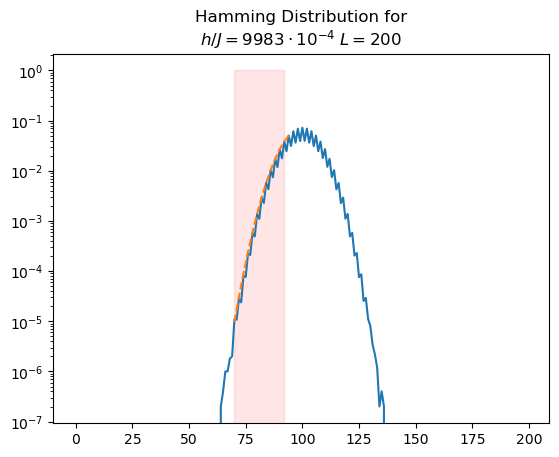

[36, 49, 48]
final parameters:
[(array([ 1.27627916e+00, -1.59954875e-01,  1.00884897e-03,  2.06232703e+02]), array([[ 3.63009069e-04, -4.01938899e-03,  2.41137104e-05,
         1.69361687e-01],
       [-4.01938899e-03,  4.99697593e-02, -2.97440994e-04,
        -2.12025173e+00],
       [ 2.41137104e-05, -2.97440994e-04,  1.77146298e-06,
         1.26143978e-02],
       [ 1.69361687e-01, -2.12025173e+00,  1.26143978e-02,
         9.00041103e+01]])), 2.8745803771212314e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
2.8745803771212314e-06
(array([ 1.27627916e+00, -1.59954875e-01,  1.00884897e-03,  2.06232703e+02]), array([[ 3.63009069e-04, -4.01938899e-03,  2.41137104e-05,
         1.69361687e-01],
       [-4.01938899e-03,  4.99697593e-02, -2.97440994e-04,
        -2.12025173e+00],
       [ 2.41137104e-05, -2.97440994e-04,  1.77146298e-06,
         1.26143978e-02],
       [ 1.69361687e-01, -2.12025173e+00,  1.26143978e-02,
         9.00041103e+01]]))
[1.90527969e-02 2.23539

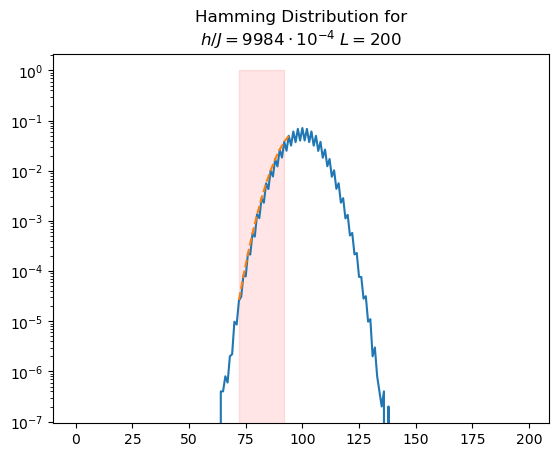

[36, 49, 48]
final parameters:
[(array([ 1.26040666e+00, -2.08675547e-01,  1.15530886e-03,  2.09112239e+02]), array([[ 1.21599670e-03, -1.46611700e-02,  8.78024737e-05,
         6.18410049e-01],
       [-1.46611700e-02,  1.99395571e-01, -1.18469732e-03,
        -8.47022318e+00],
       [ 8.78024737e-05, -1.18469732e-03,  7.04260402e-06,
         5.03007615e-02],
       [ 6.18410049e-01, -8.47022318e+00,  5.03007615e-02,
         3.59971275e+02]])), 2.919458512707954e-05, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
2.919458512707954e-05
(array([ 1.26040666e+00, -2.08675547e-01,  1.15530886e-03,  2.09112239e+02]), array([[ 1.21599670e-03, -1.46611700e-02,  8.78024737e-05,
         6.18410049e-01],
       [-1.46611700e-02,  1.99395571e-01, -1.18469732e-03,
        -8.47022318e+00],
       [ 8.78024737e-05, -1.18469732e-03,  7.04260402e-06,
         5.03007615e-02],
       [ 6.18410049e-01, -8.47022318e+00,  5.03007615e-02,
         3.59971275e+02]]))
[3.48711442e-02 4.4653731

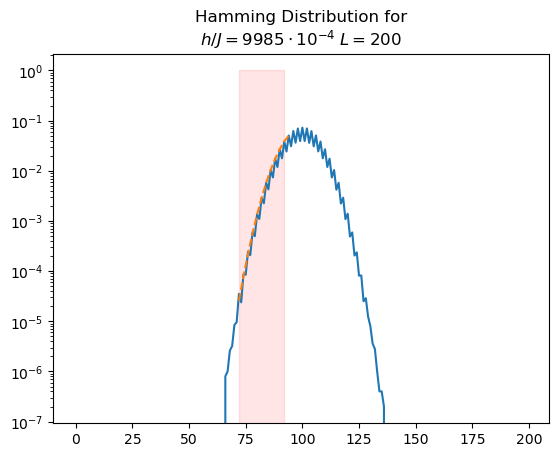

[35, 49, 48]
final parameters:
[(array([ 1.28223864e+00,  4.36512574e-01, -2.57844104e-03,  1.81171437e+02]), array([[ 4.22750197e-04, -5.32134307e-03,  3.18177082e-05,
         2.24671162e-01],
       [-5.32134307e-03,  7.63505272e-02, -4.52721690e-04,
        -3.24774282e+00],
       [ 3.18177082e-05, -4.52721690e-04,  2.68589983e-06,
         1.92478862e-02],
       [ 2.24671162e-01, -3.24774282e+00,  1.92478862e-02,
         1.38213622e+02]])), 1.0464656953261715e-05, [0, 12]]
[0, 12]
0 12
[70 72 74 76 78 80 82 84 86 88 90 92]
1.0464656953261715e-05
(array([ 1.28223864e+00,  4.36512574e-01, -2.57844104e-03,  1.81171437e+02]), array([[ 4.22750197e-04, -5.32134307e-03,  3.18177082e-05,
         2.24671162e-01],
       [-5.32134307e-03,  7.63505272e-02, -4.52721690e-04,
        -3.24774282e+00],
       [ 3.18177082e-05, -4.52721690e-04,  2.68589983e-06,
         1.92478862e-02],
       [ 2.24671162e-01, -3.24774282e+00,  1.92478862e-02,
         1.38213622e+02]]))
[2.05608900e-02 2.76

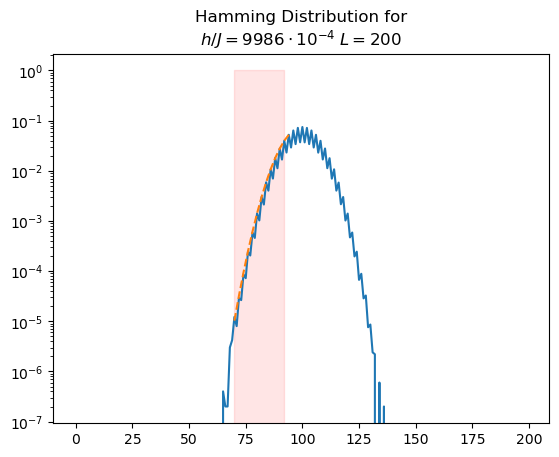

[36, 49, 48]
final parameters:
[(array([ 1.31906793e+00, -8.55472909e-01,  5.37084119e-03,  2.34512607e+02]), array([[ 3.92307479e-03, -3.21942228e-02,  1.94598754e-04,
         1.35064997e+00],
       [-3.21942228e-02,  2.90109939e-01, -1.74114030e-03,
        -1.22467500e+01],
       [ 1.94598754e-04, -1.74114030e-03,  1.04554987e-05,
         7.34648952e-02],
       [ 1.35064997e+00, -1.22467500e+01,  7.34648952e-02,
         5.17211261e+02]])), 1.3357698180072825e-05, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
1.3357698180072825e-05
(array([ 1.31906793e+00, -8.55472909e-01,  5.37084119e-03,  2.34512607e+02]), array([[ 3.92307479e-03, -3.21942228e-02,  1.94598754e-04,
         1.35064997e+00],
       [-3.21942228e-02,  2.90109939e-01, -1.74114030e-03,
        -1.22467500e+01],
       [ 1.94598754e-04, -1.74114030e-03,  1.04554987e-05,
         7.34648952e-02],
       [ 1.35064997e+00, -1.22467500e+01,  7.34648952e-02,
         5.17211261e+02]]))
[6.26344537e-02 5.38618

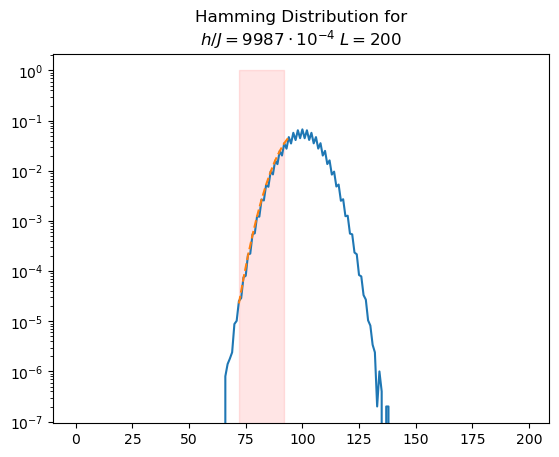

[36, 49, 48]
final parameters:
[(array([ 1.22159491e+00,  8.40824988e-01, -5.06625908e-03,  1.64480739e+02]), array([[ 1.51893242e-03, -2.27153033e-02,  1.35451883e-04,
         9.60600257e-01],
       [-2.27153033e-02,  3.92646387e-01, -2.32094763e-03,
        -1.67359126e+01],
       [ 1.35451883e-04, -2.32094763e-03,  1.37267561e-05,
         9.88766742e-02],
       [ 9.60600257e-01, -1.67359126e+01,  9.88766742e-02,
         7.13673849e+02]])), 2.2025703455084385e-05, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
2.2025703455084385e-05
(array([ 1.22159491e+00,  8.40824988e-01, -5.06625908e-03,  1.64480739e+02]), array([[ 1.51893242e-03, -2.27153033e-02,  1.35451883e-04,
         9.60600257e-01],
       [-2.27153033e-02,  3.92646387e-01, -2.32094763e-03,
        -1.67359126e+01],
       [ 1.35451883e-04, -2.32094763e-03,  1.37267561e-05,
         9.88766742e-02],
       [ 9.60600257e-01, -1.67359126e+01,  9.88766742e-02,
         7.13673849e+02]]))
[3.89734835e-02 6.26615

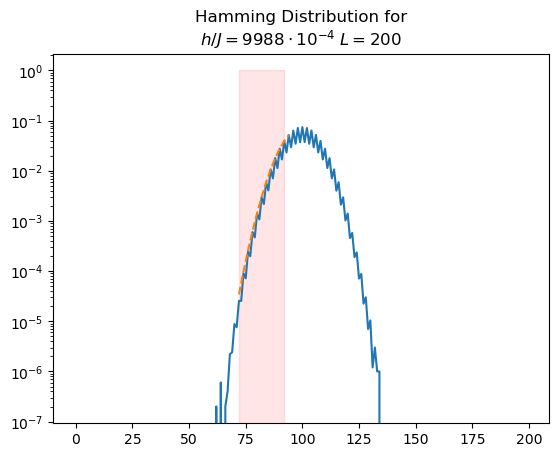

[36, 49, 48]
final parameters:
[(array([ 1.17463329e+00,  6.65301678e-01, -3.86494498e-03,  1.71125382e+02]), array([[ 1.01670814e-03, -1.38418062e-02,  8.27634767e-05,
         5.84448486e-01],
       [-1.38418062e-02,  2.14973208e-01, -1.27460951e-03,
        -9.14536206e+00],
       [ 8.27634767e-05, -1.27460951e-03,  7.56155309e-06,
         5.41968927e-02],
       [ 5.84448486e-01, -9.14536206e+00,  5.41968927e-02,
         3.89240781e+02]])), 1.9919061023342717e-05, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
1.9919061023342717e-05
(array([ 1.17463329e+00,  6.65301678e-01, -3.86494498e-03,  1.71125382e+02]), array([[ 1.01670814e-03, -1.38418062e-02,  8.27634767e-05,
         5.84448486e-01],
       [-1.38418062e-02,  2.14973208e-01, -1.27460951e-03,
        -9.14536206e+00],
       [ 8.27634767e-05, -1.27460951e-03,  7.56155309e-06,
         5.41968927e-02],
       [ 5.84448486e-01, -9.14536206e+00,  5.41968927e-02,
         3.89240781e+02]]))
[3.18858611e-02 4.63652

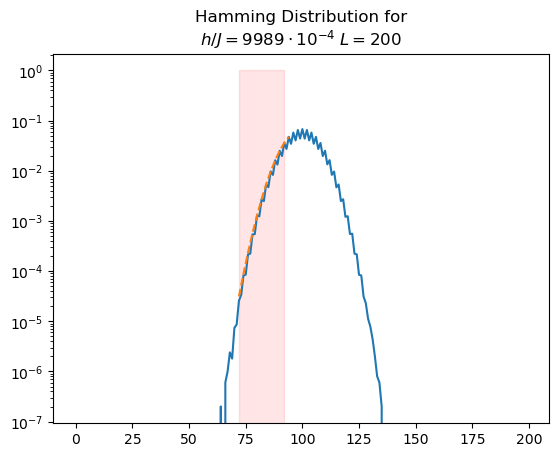

[35, 49, 48]
final parameters:
[(array([ 1.20432767e+00, -1.83029482e-01,  1.22557595e-03,  2.06825833e+02]), array([[ 4.84586591e-04, -5.37174334e-03,  3.22690038e-05,
         2.26185040e-01],
       [-5.37174334e-03,  6.65975428e-02, -3.96971386e-04,
        -2.82347393e+00],
       [ 3.22690038e-05, -3.96971386e-04,  2.36755376e-06,
         1.68216838e-02],
       [ 2.26185040e-01, -2.82347393e+00,  1.68216838e-02,
         1.19757867e+02]])), 6.246949183700643e-06, [0, 12]]
[0, 12]
0 12
[70 72 74 76 78 80 82 84 86 88 90 92]
6.246949183700643e-06
(array([ 1.20432767e+00, -1.83029482e-01,  1.22557595e-03,  2.06825833e+02]), array([[ 4.84586591e-04, -5.37174334e-03,  3.22690038e-05,
         2.26185040e-01],
       [-5.37174334e-03,  6.65975428e-02, -3.96971386e-04,
        -2.82347393e+00],
       [ 3.22690038e-05, -3.96971386e-04,  2.36755376e-06,
         1.68216838e-02],
       [ 2.26185040e-01, -2.82347393e+00,  1.68216838e-02,
         1.19757867e+02]]))
[2.20133276e-02 2.5806

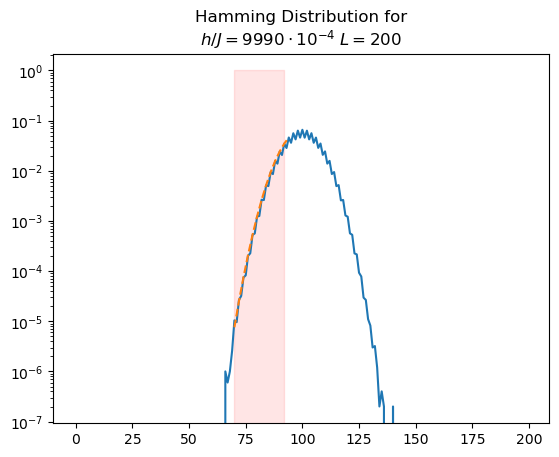

[35, 49, 48]
final parameters:
[(array([ 1.24769223e+00,  4.79930837e-01, -2.85262151e-03,  1.79572646e+02]), array([[ 4.22201545e-04, -5.45407092e-03,  3.26018396e-05,
         2.30342067e-01],
       [-5.45407092e-03,  8.02712069e-02, -4.75848468e-04,
        -3.41539852e+00],
       [ 3.26018396e-05, -4.75848468e-04,  2.82238044e-06,
         2.02364155e-02],
       [ 2.30342067e-01, -3.41539852e+00,  2.02364155e-02,
         1.45385635e+02]])), 6.308247291707397e-06, [0, 12]]
[0, 12]
0 12
[70 72 74 76 78 80 82 84 86 88 90 92]
6.308247291707397e-06
(array([ 1.24769223e+00,  4.79930837e-01, -2.85262151e-03,  1.79572646e+02]), array([[ 4.22201545e-04, -5.45407092e-03,  3.26018396e-05,
         2.30342067e-01],
       [-5.45407092e-03,  8.02712069e-02, -4.75848468e-04,
        -3.41539852e+00],
       [ 3.26018396e-05, -4.75848468e-04,  2.82238044e-06,
         2.02364155e-02],
       [ 2.30342067e-01, -3.41539852e+00,  2.02364155e-02,
         1.45385635e+02]]))
[2.05475435e-02 2.8332

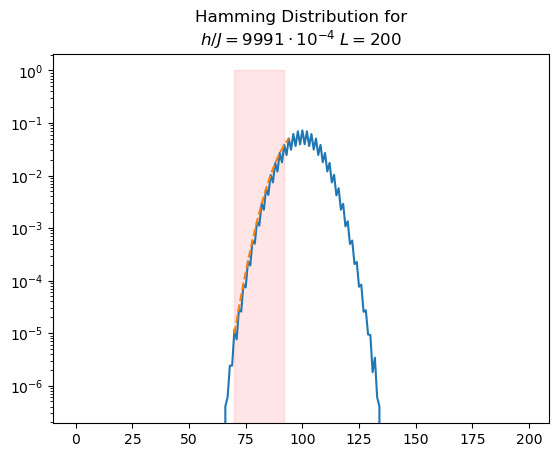

[36, 49, 48]
final parameters:
[(array([ 1.27693247e+00, -3.33278335e-01,  2.11425513e-03,  2.13245662e+02]), array([[ 2.86397139e-04, -2.91227436e-03,  1.75076910e-05,
         1.22572162e-01],
       [-2.91227436e-03,  3.30096114e-02, -1.96936520e-04,
        -1.39868634e+00],
       [ 1.75076910e-05, -1.96936520e-04,  1.17557524e-06,
         8.34050740e-03],
       [ 1.22572162e-01, -1.39868634e+00,  8.34050740e-03,
         5.92915921e+01]])), 4.746255829152647e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
4.746255829152647e-06
(array([ 1.27693247e+00, -3.33278335e-01,  2.11425513e-03,  2.13245662e+02]), array([[ 2.86397139e-04, -2.91227436e-03,  1.75076910e-05,
         1.22572162e-01],
       [-2.91227436e-03,  3.30096114e-02, -1.96936520e-04,
        -1.39868634e+00],
       [ 1.75076910e-05, -1.96936520e-04,  1.17557524e-06,
         8.34050740e-03],
       [ 1.22572162e-01, -1.39868634e+00,  8.34050740e-03,
         5.92915921e+01]]))
[1.69232721e-02 1.8168547

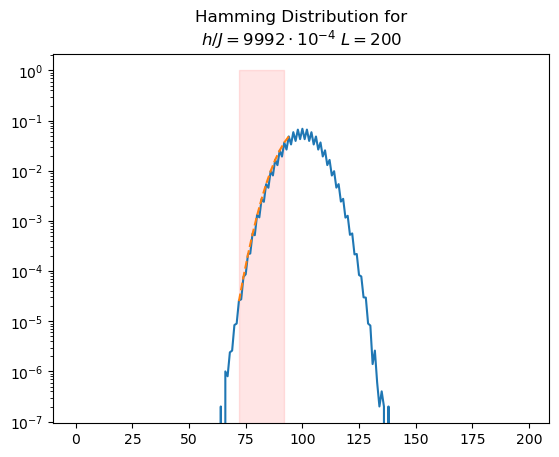

[36, 49, 48]
final parameters:
[(array([ 1.28967224e+00, -2.48530285e-01,  1.53866666e-03,  2.10097674e+02]), array([[ 1.67625659e-04, -1.77681316e-03,  1.06661560e-05,
         7.48488090e-02],
       [-1.77681316e-03,  2.10782224e-02, -1.25556957e-04,
        -8.94026933e-01],
       [ 1.06661560e-05, -1.25556957e-04,  7.48315169e-07,
         5.32284856e-03],
       [ 7.48488090e-02, -8.94026933e-01,  5.32284856e-03,
         3.79367758e+01]])), 3.7958347538197342e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
3.7958347538197342e-06
(array([ 1.28967224e+00, -2.48530285e-01,  1.53866666e-03,  2.10097674e+02]), array([[ 1.67625659e-04, -1.77681316e-03,  1.06661560e-05,
         7.48488090e-02],
       [-1.77681316e-03,  2.10782224e-02, -1.25556957e-04,
        -8.94026933e-01],
       [ 1.06661560e-05, -1.25556957e-04,  7.48315169e-07,
         5.32284856e-03],
       [ 7.48488090e-02, -8.94026933e-01,  5.32284856e-03,
         3.79367758e+01]]))
[1.29470328e-02 1.45183

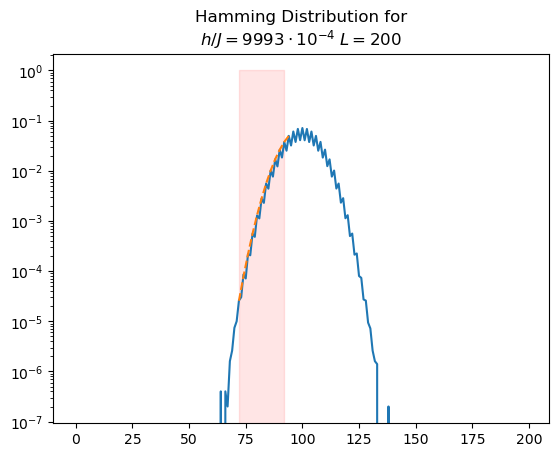

[36, 49, 48]
final parameters:
[(array([ 1.25630810e+00,  1.81795416e-02, -3.82930837e-05,  1.98725296e+02]), array([[ 9.87069707e-04, -1.13629917e-02,  6.80920009e-05,
         4.79214125e-01],
       [-1.13629917e-02,  1.49376744e-01, -8.87307486e-04,
        -6.34888548e+00],
       [ 6.80920009e-05, -8.87307486e-04,  5.27379055e-06,
         3.76926460e-02],
       [ 4.79214125e-01, -6.34888548e+00,  3.76926460e-02,
         2.69974237e+02]])), 7.658665501351692e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
7.658665501351692e-06
(array([ 1.25630810e+00,  1.81795416e-02, -3.82930837e-05,  1.98725296e+02]), array([[ 9.87069707e-04, -1.13629917e-02,  6.80920009e-05,
         4.79214125e-01],
       [-1.13629917e-02,  1.49376744e-01, -8.87307486e-04,
        -6.34888548e+00],
       [ 6.80920009e-05, -8.87307486e-04,  5.27379055e-06,
         3.76926460e-02],
       [ 4.79214125e-01, -6.34888548e+00,  3.76926460e-02,
         2.69974237e+02]]))
[3.14176655e-02 3.8649287

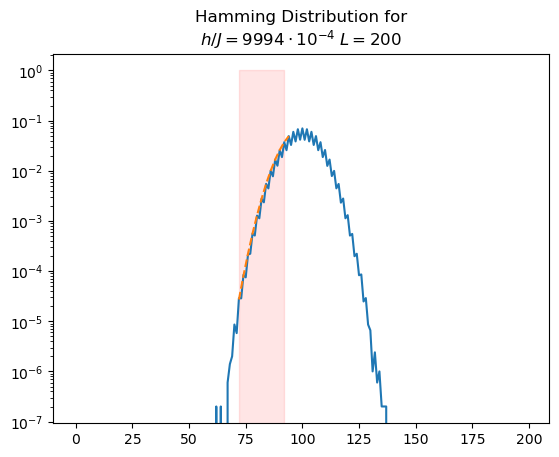

[36, 49, 48]
final parameters:
[(array([ 1.18752140e+00, -5.91367927e-01,  3.64239018e-03,  2.24010282e+02]), array([[ 1.42068815e-03, -1.52466365e-02,  9.17569313e-05,
         6.41170957e-01],
       [-1.52466365e-02,  1.81982447e-01, -1.08695841e-03,
        -7.70408565e+00],
       [ 9.17569313e-05, -1.08695841e-03,  6.49583864e-06,
         4.59928772e-02],
       [ 6.41170957e-01, -7.70408565e+00,  4.59928772e-02,
         3.26291349e+02]])), 7.789929285718014e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
7.789929285718014e-06
(array([ 1.18752140e+00, -5.91367927e-01,  3.64239018e-03,  2.24010282e+02]), array([[ 1.42068815e-03, -1.52466365e-02,  9.17569313e-05,
         6.41170957e-01],
       [-1.52466365e-02,  1.81982447e-01, -1.08695841e-03,
        -7.70408565e+00],
       [ 9.17569313e-05, -1.08695841e-03,  6.49583864e-06,
         4.59928772e-02],
       [ 6.41170957e-01, -7.70408565e+00,  4.59928772e-02,
         3.26291349e+02]]))
[3.76920171e-02 4.2659400

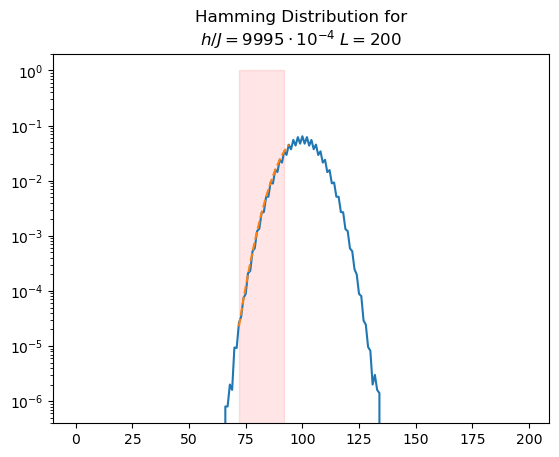

[36, 49, 48]
final parameters:
[(array([ 1.14066233e+00, -7.84426592e-01,  4.80568353e-03,  2.32349774e+02]), array([[ 2.03860416e-04, -2.11524950e-03,  1.27509574e-05,
         8.88828526e-02],
       [-2.11524950e-03,  2.42368608e-02, -1.45043868e-04,
        -1.02495020e+00],
       [ 1.27509574e-05, -1.45043868e-04,  8.68478362e-07,
         6.13076942e-03],
       [ 8.88828526e-02, -1.02495020e+00,  6.13076942e-03,
         4.33628803e+01]])), 9.558318644925759e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
9.558318644925759e-06
(array([ 1.14066233e+00, -7.84426592e-01,  4.80568353e-03,  2.32349774e+02]), array([[ 2.03860416e-04, -2.11524950e-03,  1.27509574e-05,
         8.88828526e-02],
       [-2.11524950e-03,  2.42368608e-02, -1.45043868e-04,
        -1.02495020e+00],
       [ 1.27509574e-05, -1.45043868e-04,  8.68478362e-07,
         6.13076942e-03],
       [ 8.88828526e-02, -1.02495020e+00,  6.13076942e-03,
         4.33628803e+01]]))
[1.42779696e-02 1.5568192

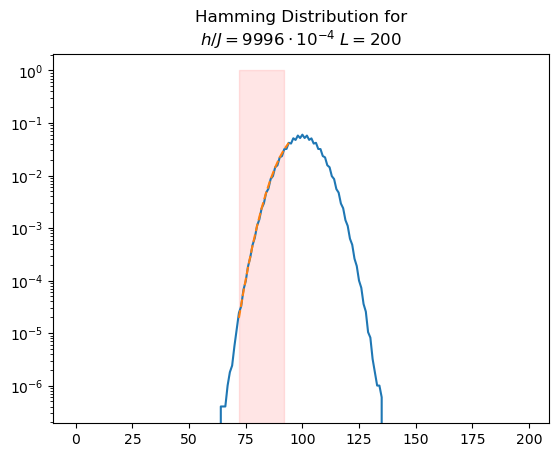

[36, 49, 48]
final parameters:
[(array([ 1.14519006e+00, -2.46303196e-01,  1.52458886e-03,  2.09954467e+02]), array([[ 9.52505147e-05, -1.14540080e-03,  6.87525729e-06,
         4.82506818e-02],
       [-1.14540080e-03,  1.54234611e-02, -9.18641530e-05,
        -6.54198704e-01],
       [ 6.87525729e-06, -9.18641530e-05,  5.47453574e-07,
         3.89457870e-03],
       [ 4.82506818e-02, -6.54198704e-01,  3.89457870e-03,
         2.77607341e+01]])), 7.07890307925221e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
7.07890307925221e-06
(array([ 1.14519006e+00, -2.46303196e-01,  1.52458886e-03,  2.09954467e+02]), array([[ 9.52505147e-05, -1.14540080e-03,  6.87525729e-06,
         4.82506818e-02],
       [-1.14540080e-03,  1.54234611e-02, -9.18641530e-05,
        -6.54198704e-01],
       [ 6.87525729e-06, -9.18641530e-05,  5.47453574e-07,
         3.89457870e-03],
       [ 4.82506818e-02, -6.54198704e-01,  3.89457870e-03,
         2.77607341e+01]]))
[9.75963702e-03 1.24191228e

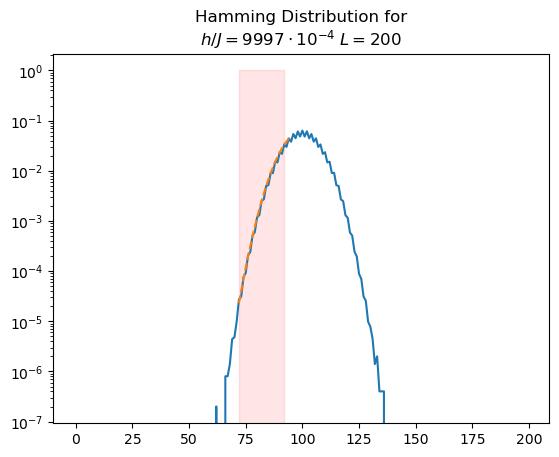

[35, 49, 48]
final parameters:
[(array([ 1.15390783e+00, -1.73860931e-01,  1.48093237e-03,  2.03303297e+02]), array([[ 6.91734989e-04, -7.92463417e-03,  4.77580921e-05,
         3.32677248e-01],
       [-7.92463417e-03,  1.02052122e-01, -6.09997354e-04,
        -4.31528074e+00],
       [ 4.77580921e-05, -6.09997354e-04,  3.64829897e-06,
         2.57800952e-02],
       [ 3.32677248e-01, -4.31528074e+00,  2.57800952e-02,
         1.82559520e+02]])), 2.72025303399738e-05, [0, 12]]
[0, 12]
0 12
[70 72 74 76 78 80 82 84 86 88 90 92]
2.72025303399738e-05
(array([ 1.15390783e+00, -1.73860931e-01,  1.48093237e-03,  2.03303297e+02]), array([[ 6.91734989e-04, -7.92463417e-03,  4.77580921e-05,
         3.32677248e-01],
       [-7.92463417e-03,  1.02052122e-01, -6.09997354e-04,
        -4.31528074e+00],
       [ 4.77580921e-05, -6.09997354e-04,  3.64829897e-06,
         2.57800952e-02],
       [ 3.32677248e-01, -4.31528074e+00,  2.57800952e-02,
         1.82559520e+02]]))
[2.63008553e-02 3.194559

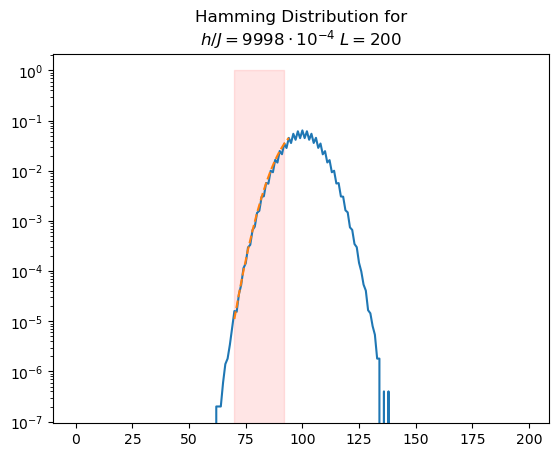

[36, 49, 48]
final parameters:
[(array([ 1.03264314e+00,  4.72917735e-01, -2.59633878e-03,  1.77707677e+02]), array([[ 1.14853419e-04, -1.77781155e-03,  1.06500011e-05,
         7.49293168e-02],
       [-1.77781155e-03,  3.14944387e-02, -1.87039246e-04,
        -1.33770961e+00],
       [ 1.06500011e-05, -1.87039246e-04,  1.11142894e-06,
         7.94023031e-03],
       [ 7.49293168e-02, -1.33770961e+00,  7.94023031e-03,
         5.68457960e+01]])), 6.0552575896400635e-06, [0, 11]]
[0, 11]
0 11
[72 74 76 78 80 82 84 86 88 90 92]
6.0552575896400635e-06
(array([ 1.03264314e+00,  4.72917735e-01, -2.59633878e-03,  1.77707677e+02]), array([[ 1.14853419e-04, -1.77781155e-03,  1.06500011e-05,
         7.49293168e-02],
       [-1.77781155e-03,  3.14944387e-02, -1.87039246e-04,
        -1.33770961e+00],
       [ 1.06500011e-05, -1.87039246e-04,  1.11142894e-06,
         7.94023031e-03],
       [ 7.49293168e-02, -1.33770961e+00,  7.94023031e-03,
         5.68457960e+01]]))
[1.07169687e-02 1.77466

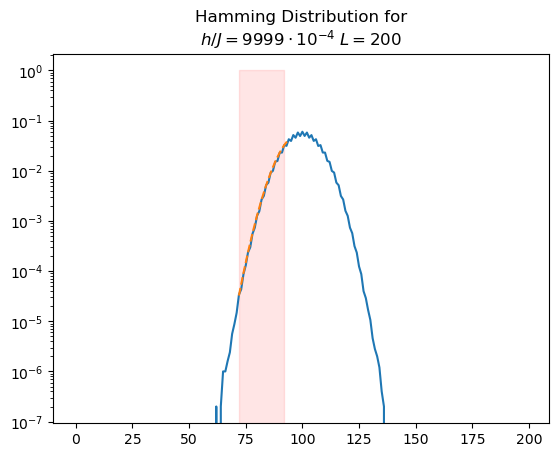

[34, 49, 48]
final parameters:
[(array([ 9.83225256e-01,  1.11715495e+00, -5.31827118e-03,  1.40558878e+02]), array([[ 2.63173277e-04, -3.87546130e-03,  2.34674825e-05,
         1.61765869e-01],
       [-3.87546130e-03,  6.67029929e-02, -3.99689078e-04,
        -2.81027956e+00],
       [ 2.34674825e-05, -3.99689078e-04,  2.39672586e-06,
         1.68281955e-02],
       [ 1.61765869e-01, -2.81027956e+00,  1.68281955e-02,
         1.18472498e+02]])), 1.875434131760168e-05, [0, 13]]
[0, 13]
0 13
[68 70 72 74 76 78 80 82 84 86 88 90 92]
1.875434131760168e-05
(array([ 9.83225256e-01,  1.11715495e+00, -5.31827118e-03,  1.40558878e+02]), array([[ 2.63173277e-04, -3.87546130e-03,  2.34674825e-05,
         1.61765869e-01],
       [-3.87546130e-03,  6.67029929e-02, -3.99689078e-04,
        -2.81027956e+00],
       [ 2.34674825e-05, -3.99689078e-04,  2.39672586e-06,
         1.68281955e-02],
       [ 1.61765869e-01, -2.81027956e+00,  1.68281955e-02,
         1.18472498e+02]]))
[1.62226162e-02 2.5

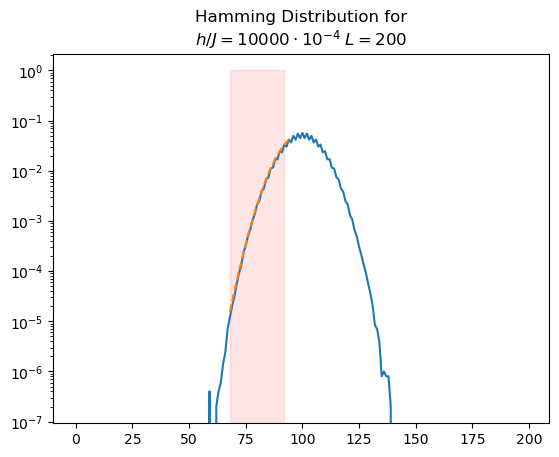

[26, 49, 48]
INSIDE
0 nan 0.00032712852310590857 interval=[ 52 , 94 ]
1 8.885733983319284 0.00032712852310590857 interval=[ 52 , 94 ]
2 5.14575447158164 0.00032712852310590857 interval=[ 52 , 94 ]
3 6.2425040497724 0.00032712852310590857 interval=[ 52 , 94 ]
4 nan 0.00032712852310590857 interval=[ 52 , 94 ]
5 nan 0.00032712852310590857 interval=[ 52 , 94 ]
6 nan 0.00032712852310590857 interval=[ 52 , 94 ]
7 nan 0.00032712852310590857 interval=[ 52 , 94 ]
8 6.525416849058113 0.00032712852310590857 interval=[ 52 , 94 ]
9 23.806764933637915 0.00032712852310590857 interval=[ 52 , 94 ]
10 40.280873266664024 0.00032712852310590857 interval=[ 52 , 94 ]


/tmp/ipykernel_2661/3375479267.py:18: RuntimeWarning: invalid value encountered in log
  return sum(map(lambda x: x[0]*np.log(x[0]/x[1]),zip(X,Y)))


11 64.50473408224778 0.00032712852310590857 interval=[ 52 , 94 ]
12 70.44228373014172 0.00032712852310590857 interval=[ 52 , 94 ]
13 2.672139175688231 0.00032712852310590857 interval=[ 52 , 94 ]
14 1.484832507685144 0.00032712852310590857 interval=[ 52 , 94 ]
16 1.3585878012322334 0.00032712852310590857 interval=[ 52 , 94 ]


/tmp/ipykernel_2661/3375479267.py:71: OptimizeWarning: Covariance of the parameters could not be estimated
  A=so.curve_fit(F,X_test,Y_test,p0=guesses)


18 1.7640347755615096 0.00032712852310590857 interval=[ 52 , 94 ]
23 8.885225436423081 0.00032712852310590857 interval=[ 52 , 94 ]
24 5.1455449785712775 0.00032712852310590857 interval=[ 52 , 94 ]
25 6.244088900749018 0.00032712852310590857 interval=[ 52 , 94 ]
26 nan 0.00032712852310590857 interval=[ 52 , 94 ]
27 nan 0.00032712852310590857 interval=[ 52 , 94 ]
28 nan 0.00032712852310590857 interval=[ 52 , 94 ]
29 nan 0.00032712852310590857 interval=[ 52 , 94 ]
30 6.525254147245022 0.00032712852310590857 interval=[ 52 , 94 ]
31 23.80793719875246 0.00032712852310590857 interval=[ 52 , 94 ]
32 40.28106558721149 0.00032712852310590857 interval=[ 52 , 94 ]
33 64.5064126488584 0.00032712852310590857 interval=[ 52 , 94 ]
34 70.43844414511653 0.00032712852310590857 interval=[ 52 , 94 ]
35 2.6722933775480677 0.00032712852310590857 interval=[ 52 , 94 ]
36 1.4845928180366301 0.00032712852310590857 interval=[ 52 , 94 ]
38 1.3587715132185412 0.00032712852310590857 interval=[ 52 , 94 ]
40 1.7640347

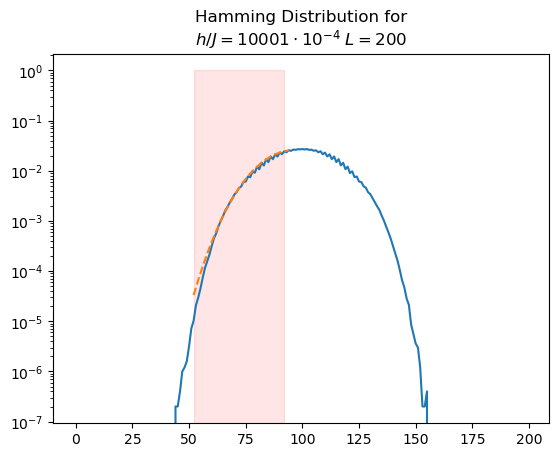

[27, 42, 47]
INSIDE
0 30.475493239678492 0.0007314259571197779 interval=[ 54 , 92 ]
1 26.83579412211851 0.0007314259571197779 interval=[ 54 , 92 ]
2 19.204299148649554 0.0007314259571197779 interval=[ 54 , 92 ]
3 13.227957256641421 0.0007314259571197779 interval=[ 54 , 92 ]
4 11.773447396219915 0.0007314259571197779 interval=[ 54 , 92 ]
5 10.593612550731532 0.0007314259571197779 interval=[ 54 , 92 ]
6 5.153309506738485 0.0007314259571197779 interval=[ 54 , 92 ]
7 nan 0.0007314259571197779 interval=[ 54 , 92 ]
8 nan 0.0007314259571197779 interval=[ 54 , 92 ]
9 nan 0.0007314259571197779 interval=[ 54 , 92 ]
10 31.367944876993 0.0007314259571197779 interval=[ 54 , 92 ]
11 42.38893458131373 0.0007314259571197779 interval=[ 54 , 92 ]
12 nan 0.0007314259571197779 interval=[ 54 , 92 ]
14 37.849205910535886 0.0007314259571197779 interval=[ 54 , 92 ]
15 1.1531860652915573 0.0007314259571197779 interval=[ 54 , 92 ]
21 58.15855161595786 0.0007314259571197779 interval=[ 54 , 92 ]
22 51.50791087155

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar multiply
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


32 nan 0.0007314259571197779 interval=[ 54 , 92 ]
33 1.4413340202825022 0.0007314259571197779 interval=[ 54 , 92 ]
34 37.84912844013243 0.0007314259571197779 interval=[ 54 , 92 ]
final parameters:
[(array([ 3.49262284e-01, -2.02972167e+00,  1.74120976e-02,  2.17204119e+02]), array([[ 2.69957917e-06,  2.69937458e-04, -1.76331173e-06,
        -1.01857686e-02],
       [ 2.69937458e-04,  7.74001376e-02, -4.93130472e-04,
        -3.00840084e+00],
       [-1.76331173e-06, -4.93130472e-04,  3.14885857e-06,
         1.91244469e-02],
       [-1.01857686e-02, -3.00840084e+00,  1.91244469e-02,
         1.17196330e+02]])), 0.0007314259571197779, [0, 19]]
[0, 19]
0 19
[54 56 58 60 62 64 66 68 70 72 74 76 78 80 82 84 86 88 90]
0.0007314259571197779
(array([ 3.49262284e-01, -2.02972167e+00,  1.74120976e-02,  2.17204119e+02]), array([[ 2.69957917e-06,  2.69937458e-04, -1.76331173e-06,
        -1.01857686e-02],
       [ 2.69937458e-04,  7.74001376e-02, -4.93130472e-04,
        -3.00840084e+00],
       

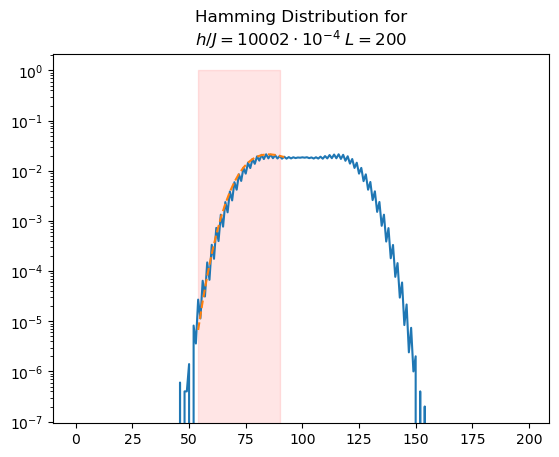

[18, 41, 47]
INSIDE
0 4.247922486152408 0.014847158865499846 interval=[ 36 , 92 ]
1 3.2629802439016196 0.014847158865499846 interval=[ 36 , 92 ]
2 1.8918684804057413 0.014847158865499846 interval=[ 36 , 92 ]
3 0.7903488992856716 0.014847158865499846 interval=[ 36 , 92 ]
4 0.7015206099005296 0.014847158865499846 interval=[ 36 , 92 ]
5 0.8233042726542101 0.014847158865499846 interval=[ 36 , 92 ]
6 0.7226035780702091 0.014847158865499846 interval=[ 36 , 92 ]
7 0.7649170455817142 0.014847158865499846 interval=[ 36 , 92 ]
8 0.9375096120008259 0.014847158865499846 interval=[ 36 , 92 ]
9 1.7075874330398442 0.014847158865499846 interval=[ 36 , 92 ]
10 3.818696961388113 0.014847158865499846 interval=[ 36 , 92 ]
11 10.820084119015547 0.014847158865499846 interval=[ 36 , 92 ]
12 nan 0.014847158865499846 interval=[ 36 , 92 ]
13 nan 0.014847158865499846 interval=[ 36 , 92 ]
14 31.32146562880684 0.014847158865499846 interval=[ 36 , 92 ]
15 75.20278960955517 0.014847158865499846 interval=[ 36 , 92 ]


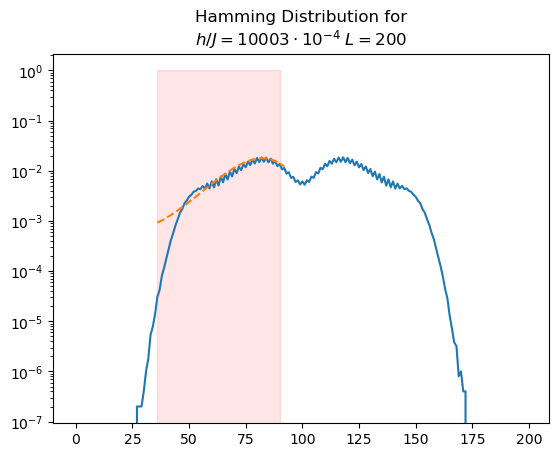

[15, 28, 47]
INSIDE
0 138.1936779029256 0.02796318854910431 interval=[ 30 , 92 ]
1 140.55997537276514 0.02796318854910431 interval=[ 30 , 92 ]
2 142.02133028105362 0.02796318854910431 interval=[ 30 , 92 ]
3 142.40756417274255 0.02796318854910431 interval=[ 30 , 92 ]
4 141.77236110428439 0.02796318854910431 interval=[ 30 , 92 ]
5 144.18385246760465 0.02796318854910431 interval=[ 30 , 92 ]
6 149.59672411156745 0.02796318854910431 interval=[ 30 , 92 ]
7 151.6426969196991 0.02796318854910431 interval=[ 30 , 92 ]
8 146.81996218717993 0.02796318854910431 interval=[ 30 , 92 ]
9 133.49080910674098 0.02796318854910431 interval=[ 30 , 92 ]
10 111.9913940681208 0.02796318854910431 interval=[ 30 , 92 ]
11 78.94273098701497 0.02796318854910431 interval=[ 30 , 92 ]
12 30.084227081110882 0.02796318854910431 interval=[ 30 , 92 ]
13 nan 0.02796318854910431 interval=[ 30 , 92 ]
14 nan 0.02796318854910431 interval=[ 30 , 92 ]
17 nan 0.02796318854910431 interval=[ 30 , 92 ]
18 nan 0.02796318854910431 inte

/tmp/ipykernel_2661/3375479267.py:73: RuntimeWarning: invalid value encountered in divide
  KL_test=logKL(Y_test/np.sum(Y_test),YY/np.sum(YY))
/tmp/ipykernel_2661/3375479267.py:18: RuntimeWarning: divide by zero encountered in scalar divide
  return sum(map(lambda x: x[0]*np.log(x[0]/x[1]),zip(X,Y)))


54 23.89249302501876 0.02796318854910431 interval=[ 30 , 92 ]
55 3.3803438136727806 0.02796318854910431 interval=[ 30 , 92 ]
56 6.192716805983702 0.02796318854910431 interval=[ 30 , 92 ]
57 5.699284153048319 0.02796318854910431 interval=[ 30 , 92 ]
58 4.677632743804699 0.02796318854910431 interval=[ 30 , 92 ]
59 3.6617816300029857 0.02796318854910431 interval=[ 30 , 92 ]
60 2.6478981124209864 0.02796318854910431 interval=[ 30 , 92 ]
final parameters:
[(array([ 1.76297614e-01, -4.17214010e+00,  4.64065000e-02,  1.97500646e+02]), array([[ 2.26017324e-05, -1.16324583e-03,  8.74305442e-06,
         3.64041734e-02],
       [-1.16324583e-03,  1.36848933e-01, -1.03431434e-03,
        -4.27612346e+00],
       [ 8.74305442e-06, -1.03431434e-03,  7.86953937e-06,
         3.21132098e-02],
       [ 3.64041734e-02, -4.27612346e+00,  3.21132098e-02,
         1.34616169e+02]])), 0.02796318854910431, [0, 31]]
[0, 31]
0 31
[30 32 34 36 38 40 42 44 46 48 50 52 54 56 58 60 62 64 66 68 70 72 74 76
 78 80 

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: divide by zero encountered in scalar divide
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))
/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar power
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


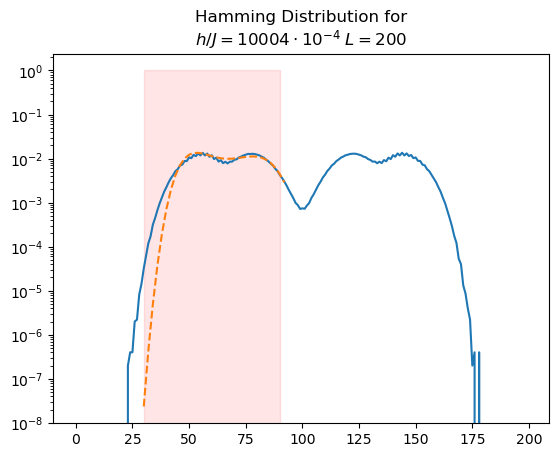

[12, 38, 47]
INSIDE
0 12.188717207260893 0.07071089408166972 interval=[ 24 , 92 ]
1 12.427384243797734 0.07071089408166972 interval=[ 24 , 92 ]
2 12.551611273487305 0.07071089408166972 interval=[ 24 , 92 ]
3 12.35280945769407 0.07071089408166972 interval=[ 24 , 92 ]
4 11.49941999804627 0.07071089408166972 interval=[ 24 , 92 ]
5 9.725979619583152 0.07071089408166972 interval=[ 24 , 92 ]
6 6.884236736419076 0.07071089408166972 interval=[ 24 , 92 ]
7 2.6576465568801098 0.07071089408166972 interval=[ 24 , 92 ]
15 220.97657611499292 0.07071089408166972 interval=[ 24 , 92 ]
16 198.31830010134956 0.07071089408166972 interval=[ 24 , 92 ]
17 173.13741076636336 0.07071089408166972 interval=[ 24 , 92 ]
18 13.107078502158238 0.07071089408166972 interval=[ 24 , 92 ]
19 152.05443297244915 0.07071089408166972 interval=[ 24 , 92 ]
20 166.8321712213865 0.07071089408166972 interval=[ 24 , 92 ]
21 307.56097336450154 0.07071089408166972 interval=[ 24 , 92 ]
22 202.50392953332894 0.07071089408166972 interv

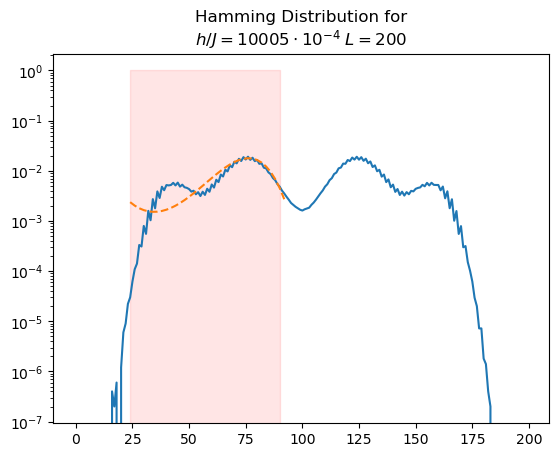

[10, 35, 47]
INSIDE
0 6.430188962316473 0.03985707734364458 interval=[ 21 , 93 ]
1 6.618773222931717 0.03985707734364458 interval=[ 21 , 93 ]
2 6.892541855927855 0.03985707734364458 interval=[ 21 , 93 ]
3 7.230324798477113 0.03985707734364458 interval=[ 21 , 93 ]
4 7.5733982310266095 0.03985707734364458 interval=[ 21 , 93 ]
5 7.803562353517773 0.03985707734364458 interval=[ 21 , 93 ]
6 7.815557147096589 0.03985707734364458 interval=[ 21 , 93 ]
7 7.488640235282057 0.03985707734364458 interval=[ 21 , 93 ]
8 6.727531173626964 0.03985707734364458 interval=[ 21 , 93 ]
9 5.410231862717813 0.03985707734364458 interval=[ 21 , 93 ]
10 3.4416669330464327 0.03985707734364458 interval=[ 21 , 93 ]
11 1.310530663001204 0.03985707734364458 interval=[ 21 , 93 ]
18 nan 0.03985707734364458 interval=[ 21 , 93 ]
20 160.73769809536054 0.03985707734364458 interval=[ 21 , 93 ]
21 184.2060435573683 0.03985707734364458 interval=[ 21 , 93 ]
22 155.8133757678308 0.03985707734364458 interval=[ 21 , 93 ]
23 121.85

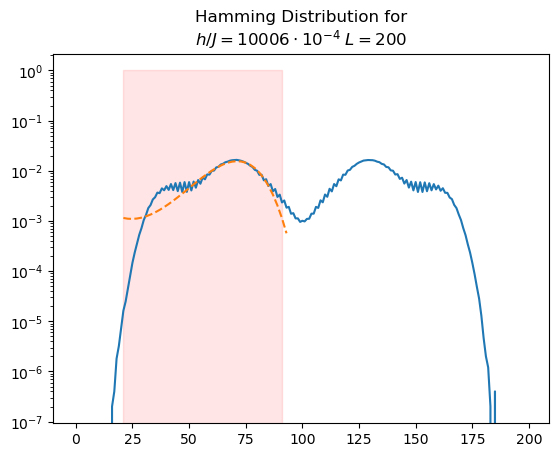

[15, 32, 47]
INSIDE
0 0.47694006101857384 0.0074422676892376225 interval=[ 30 , 92 ]
1 0.48311662086550006 0.0074422676892376225 interval=[ 30 , 92 ]
2 0.4936084715212608 0.0074422676892376225 interval=[ 30 , 92 ]
3 0.5109119114697622 0.0074422676892376225 interval=[ 30 , 92 ]
4 0.5391825690030239 0.0074422676892376225 interval=[ 30 , 92 ]
5 0.5832566057842059 0.0074422676892376225 interval=[ 30 , 92 ]
6 0.6545375407048308 0.0074422676892376225 interval=[ 30 , 92 ]
7 0.7650442193293311 0.0074422676892376225 interval=[ 30 , 92 ]
8 0.9353798904139544 0.0074422676892376225 interval=[ 30 , 92 ]
9 1.1426104580410852 0.0074422676892376225 interval=[ 30 , 92 ]
10 1.2331835252007597 0.0074422676892376225 interval=[ 30 , 92 ]
12 0.8850615394282676 0.0074422676892376225 interval=[ 30 , 92 ]
14 nan 0.0074422676892376225 interval=[ 30 , 92 ]
15 9.267136067135112 0.0074422676892376225 interval=[ 30 , 92 ]
16 12.391274775188489 0.0074422676892376225 interval=[ 30 , 92 ]
17 nan 0.0074422676892376225 

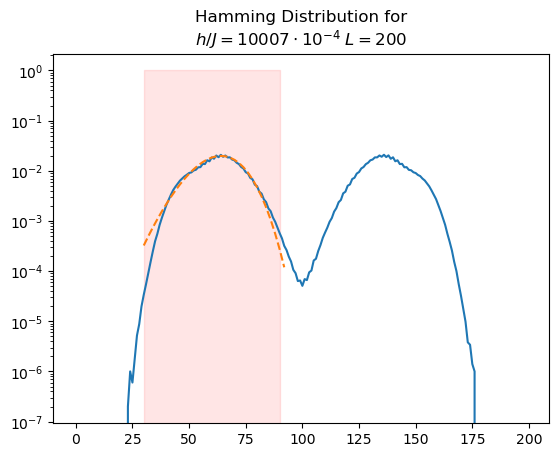

[11, 25, 47]
INSIDE
0 nan 0.013896909343182894 interval=[ 22 , 92 ]
1 nan 0.013896909343182894 interval=[ 22 , 92 ]
2 nan 0.013896909343182894 interval=[ 22 , 92 ]
3 nan 0.013896909343182894 interval=[ 22 , 92 ]
4 nan 0.013896909343182894 interval=[ 22 , 92 ]
5 nan 0.013896909343182894 interval=[ 22 , 92 ]
6 nan 0.013896909343182894 interval=[ 22 , 92 ]
7 nan 0.013896909343182894 interval=[ 22 , 92 ]
8 nan 0.013896909343182894 interval=[ 22 , 92 ]
9 15.972330156262359 0.013896909343182894 interval=[ 22 , 92 ]
10 10.842334448644825 0.013896909343182894 interval=[ 22 , 92 ]
11 8.20705009427853 0.013896909343182894 interval=[ 22 , 92 ]
12 6.812677195074834 0.013896909343182894 interval=[ 22 , 92 ]
17 3.0471875557866137 0.013896909343182894 interval=[ 22 , 92 ]
21 nan 0.013896909343182894 interval=[ 22 , 92 ]
22 nan 0.013896909343182894 interval=[ 22 , 92 ]
23 nan 0.013896909343182894 interval=[ 22 , 92 ]
24 27.00190323147811 0.013896909343182894 interval=[ 22 , 92 ]
25 95.78776791739746 0

/tmp/ipykernel_2661/841889229.py:16: RuntimeWarning: overflow encountered in multiply
  return prob*k


63 7.905669938797086 0.013896909343182894 interval=[ 22 , 92 ]
64 4.422549415747291 0.013896909343182894 interval=[ 22 , 92 ]
65 6.052883467812839 0.013896909343182894 interval=[ 22 , 92 ]
66 3.670988424961456 0.013896909343182894 interval=[ 22 , 92 ]
67 nan 0.013896909343182894 interval=[ 22 , 92 ]
68 1.3515369526674579 0.013896909343182894 interval=[ 22 , 92 ]
final parameters:
[(array([2.51328951e-01, 4.87324316e-01, 5.00366300e-03, 6.23729412e+01]), array([[ 1.46214971e-05, -1.38355644e-04,  9.57935946e-07,
         4.42377991e-03],
       [-1.38355644e-04,  1.65487685e-02, -1.50577909e-04,
        -4.28358975e-01],
       [ 9.57935946e-07, -1.50577909e-04,  1.39274906e-06,
         3.83419974e-03],
       [ 4.42377991e-03, -4.28358975e-01,  3.83419974e-03,
         1.12953770e+01]])), 0.013896909343182894, [0, 35]]
[0, 35]
0 35
[22 24 26 28 30 32 34 36 38 40 42 44 46 48 50 52 54 56 58 60 62 64 66 68
 70 72 74 76 78 80 82 84 86 88 90]
0.013896909343182894
(array([2.51328951e-01, 4.

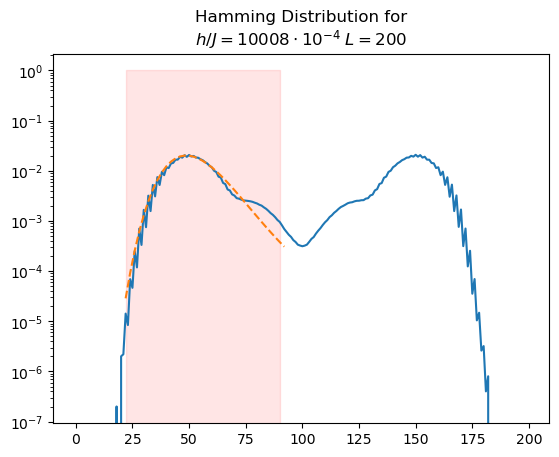

[11, 25, 47]
INSIDE
0 nan 0.007566797517351214 interval=[ 22 , 92 ]
1 nan 0.007566797517351214 interval=[ 22 , 92 ]
2 nan 0.007566797517351214 interval=[ 22 , 92 ]
3 nan 0.007566797517351214 interval=[ 22 , 92 ]
4 nan 0.007566797517351214 interval=[ 22 , 92 ]
5 nan 0.007566797517351214 interval=[ 22 , 92 ]
6 nan 0.007566797517351214 interval=[ 22 , 92 ]
7 nan 0.007566797517351214 interval=[ 22 , 92 ]
8 nan 0.007566797517351214 interval=[ 22 , 92 ]
9 nan 0.007566797517351214 interval=[ 22 , 92 ]
10 nan 0.007566797517351214 interval=[ 22 , 92 ]
11 nan 0.007566797517351214 interval=[ 22 , 92 ]
13 7.280585331310155 0.007566797517351214 interval=[ 22 , 92 ]
16 1.3433361601590823 0.007566797517351214 interval=[ 22 , 92 ]
19 1.7054174697983404 0.007566797517351214 interval=[ 22 , 92 ]
21 nan 0.007566797517351214 interval=[ 22 , 92 ]
22 nan 0.007566797517351214 interval=[ 22 , 92 ]
23 nan 0.007566797517351214 interval=[ 22 , 92 ]
24 3.41783967598 0.007566797517351214 interval=[ 22 , 92 ]
25 33

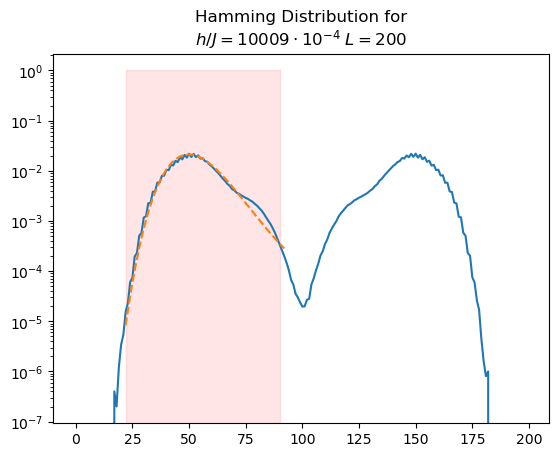

[4, 21, 47]
INSIDE
0 10.483976674026227 0.06106379036456599 interval=[ 8 , 92 ]
1 10.486414798921032 0.06106379036456599 interval=[ 8 , 92 ]
2 10.580665662856246 0.06106379036456599 interval=[ 8 , 92 ]
3 10.80474575217108 0.06106379036456599 interval=[ 8 , 92 ]
4 11.21496268980901 0.06106379036456599 interval=[ 8 , 92 ]
5 11.915275006265052 0.06106379036456599 interval=[ 8 , 92 ]
6 12.94516548869036 0.06106379036456599 interval=[ 8 , 92 ]
7 14.411289840949445 0.06106379036456599 interval=[ 8 , 92 ]
8 16.068244899982368 0.06106379036456599 interval=[ 8 , 92 ]
15 0.7067164115993301 0.06106379036456599 interval=[ 8 , 92 ]
23 1.0512392880488077 0.06106379036456599 interval=[ 8 , 92 ]
24 1.3257323091491418 0.06106379036456599 interval=[ 8 , 92 ]
25 1.1073169579083442 0.06106379036456599 interval=[ 8 , 92 ]
31 9.486302023668763 0.06106379036456599 interval=[ 8 , 92 ]
32 105.78068742242425 0.06106379036456599 interval=[ 8 , 92 ]
33 196.39457531186815 0.06106379036456599 interval=[ 8 , 92 ]
34

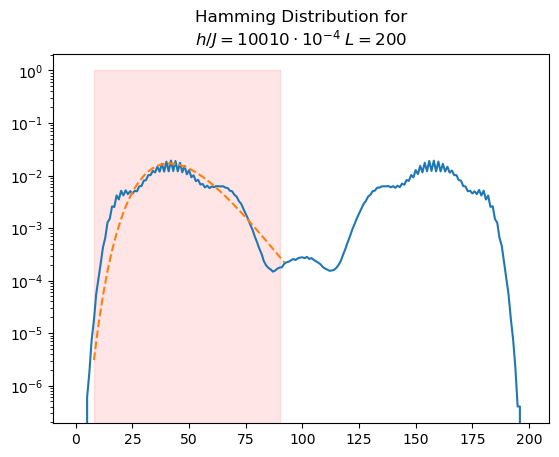

[2, 14, 47]
INSIDE
0 11.89171018325701 0.032518295110012044 interval=[ 4 , 92 ]
1 11.868487270442092 0.032518295110012044 interval=[ 4 , 92 ]
2 11.823078229252715 0.032518295110012044 interval=[ 4 , 92 ]
3 11.812736592993529 0.032518295110012044 interval=[ 4 , 92 ]
4 1.6763074007539671 0.032518295110012044 interval=[ 4 , 92 ]
5 12.26802117060071 0.032518295110012044 interval=[ 4 , 92 ]
6 1.9336333171166449 0.032518295110012044 interval=[ 4 , 92 ]
7 14.835158243935888 0.032518295110012044 interval=[ 4 , 92 ]
8 18.610031213964124 0.032518295110012044 interval=[ 4 , 92 ]
9 nan 0.032518295110012044 interval=[ 4 , 92 ]
10 2.0359516537147733 0.032518295110012044 interval=[ 4 , 92 ]
11 1.9946178572005957 0.032518295110012044 interval=[ 4 , 92 ]
12 nan 0.032518295110012044 interval=[ 4 , 92 ]
13 nan 0.032518295110012044 interval=[ 4 , 92 ]
14 nan 0.032518295110012044 interval=[ 4 , 92 ]
15 nan 0.032518295110012044 interval=[ 4 , 92 ]
16 nan 0.032518295110012044 interval=[ 4 , 92 ]
17 nan 0.032

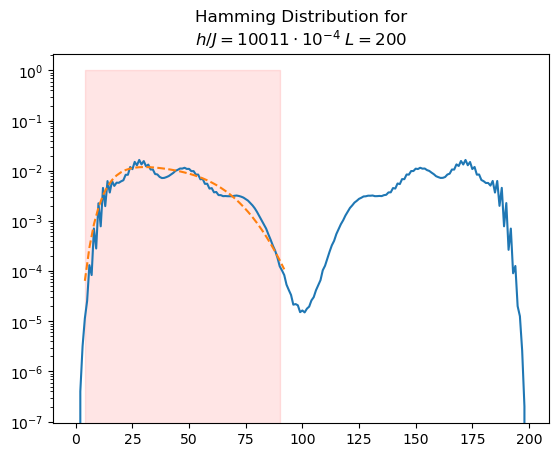

[3, 24, 47]
INSIDE
0 3.410598019105623 1.554323428419156 interval=[ 7 , 93 ]
1 3.396522208282209 1.554323428419156 interval=[ 7 , 93 ]
2 3.3834647494323966 1.554323428419156 interval=[ 7 , 93 ]
3 3.3727469282235027 1.554323428419156 interval=[ 7 , 93 ]
4 3.364101221721911 1.554323428419156 interval=[ 7 , 93 ]
5 3.3579206981015033 1.554323428419156 interval=[ 7 , 93 ]
6 3.354327862829809 1.554323428419156 interval=[ 7 , 93 ]
7 3.354411408805779 1.554323428419156 interval=[ 7 , 93 ]
8 3.359592478543193 1.554323428419156 interval=[ 7 , 93 ]
9 3.3716934080827436 1.554323428419156 interval=[ 7 , 93 ]
13 98.33262248226804 1.554323428419156 interval=[ 7 , 93 ]
24 315.80898551671197 1.554323428419156 interval=[ 7 , 93 ]
25 321.8457955441686 1.554323428419156 interval=[ 7 , 93 ]
26 304.2724331192423 1.554323428419156 interval=[ 7 , 93 ]
27 270.7397507904136 1.554323428419156 interval=[ 7 , 93 ]
28 220.05288626504785 1.554323428419156 interval=[ 7 , 93 ]
29 128.1909914353079 1.554323428419156 in

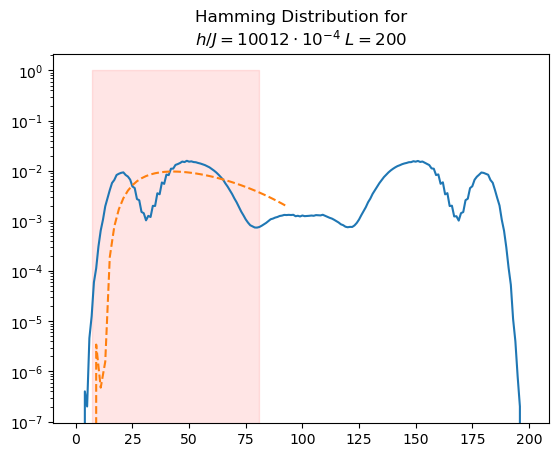

[5, 14, 43]
INSIDE
0 2.7965790832009096 0.044009680259286664 interval=[ 10 , 84 ]
1 2.9374723260454862 0.044009680259286664 interval=[ 10 , 84 ]
2 3.1391446979460227 0.044009680259286664 interval=[ 10 , 84 ]
3 42.99603295422164 0.044009680259286664 interval=[ 10 , 84 ]
4 43.07999684505678 0.044009680259286664 interval=[ 10 , 84 ]
5 43.186345122787564 0.044009680259286664 interval=[ 10 , 84 ]
6 43.30715492822303 0.044009680259286664 interval=[ 10 , 84 ]
7 43.20945843311061 0.044009680259286664 interval=[ 10 , 84 ]
8 42.64258684408134 0.044009680259286664 interval=[ 10 , 84 ]
9 19.696175045642995 0.044009680259286664 interval=[ 10 , 84 ]
10 39.936637730667336 0.044009680259286664 interval=[ 10 , 84 ]
11 38.04009314703448 0.044009680259286664 interval=[ 10 , 84 ]
12 nan 0.044009680259286664 interval=[ 10 , 84 ]
13 nan 0.044009680259286664 interval=[ 10 , 84 ]
14 nan 0.044009680259286664 interval=[ 10 , 84 ]
15 48.93483641335286 0.044009680259286664 interval=[ 10 , 84 ]
16 57.8328740070024

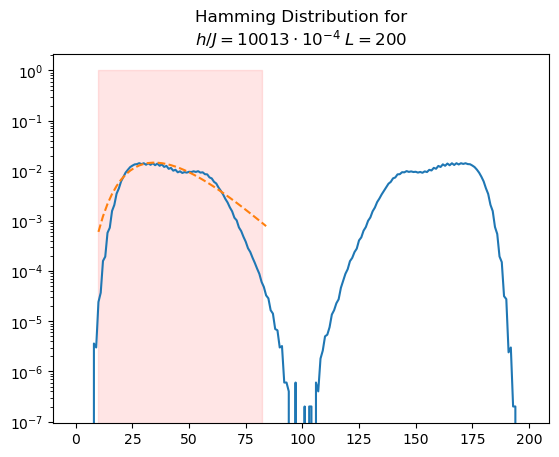

[1, 2, 32]
INSIDE
0 nan 0.18755684423288824 interval=[ 2 , 62 ]
1 nan 0.18755684423288824 interval=[ 2 , 62 ]
2 nan 0.18755684423288824 interval=[ 2 , 62 ]
3 1.0348795818076537 0.18755684423288824 interval=[ 2 , 62 ]
4 7.716102009869738 0.18755684423288824 interval=[ 2 , 62 ]
5 14.155591438885565 0.18755684423288824 interval=[ 2 , 62 ]
6 4.36746622539905 0.18755684423288824 interval=[ 2 , 62 ]
7 3.9386667881047326 0.18755684423288824 interval=[ 2 , 62 ]
8 3.3984423525990968 0.18755684423288824 interval=[ 2 , 62 ]
9 7.516143496804197 0.18755684423288824 interval=[ 2 , 62 ]
11 nan 0.18755684423288824 interval=[ 2 , 62 ]
12 5.754774470904934 0.18755684423288824 interval=[ 2 , 62 ]
13 52.50735368275092 0.18755684423288824 interval=[ 2 , 62 ]
14 nan 0.18755684423288824 interval=[ 2 , 62 ]
15 nan 0.18755684423288824 interval=[ 2 , 62 ]
16 nan 0.18755684423288824 interval=[ 2 , 62 ]
17 nan 0.18755684423288824 interval=[ 2 , 62 ]
18 nan 0.18755684423288824 interval=[ 2 , 62 ]
19 nan 0.18755684

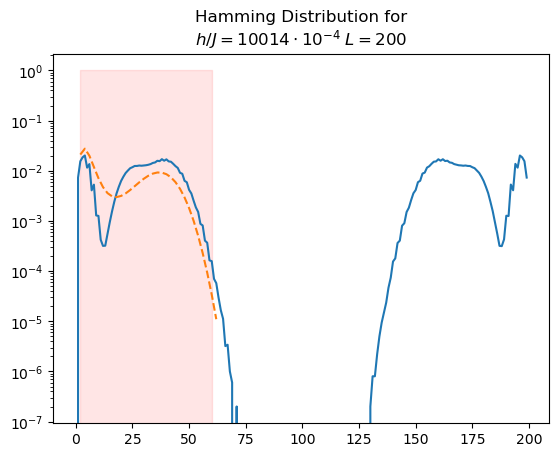

[1, 14, 30]
final parameters:
[(array([ 0.26849322,  2.71254651, -0.0351722 ,  7.60097785]), array([[ 1.08983378e-04,  5.31134070e-04, -1.59087216e-05,
        -1.66572046e-03],
       [ 5.31134070e-04,  1.42408871e-02, -3.45556746e-04,
        -1.10350331e-01],
       [-1.59087216e-05, -3.45556746e-04,  8.91140106e-06,
         2.38991401e-03],
       [-1.66572046e-03, -1.10350331e-01,  2.38991401e-03,
         1.08698150e+00]])), nan, [0, 28]]
[0, 28]
0 28
[ 2  4  6  8 10 12 14 16 18 20 22 24 26 28 30 32 34 36 38 40 42 44 46 48
 50 52 54 56]
nan
(array([ 0.26849322,  2.71254651, -0.0351722 ,  7.60097785]), array([[ 1.08983378e-04,  5.31134070e-04, -1.59087216e-05,
        -1.66572046e-03],
       [ 5.31134070e-04,  1.42408871e-02, -3.45556746e-04,
        -1.10350331e-01],
       [-1.59087216e-05, -3.45556746e-04,  8.91140106e-06,
         2.38991401e-03],
       [-1.66572046e-03, -1.10350331e-01,  2.38991401e-03,
         1.08698150e+00]]))
[0.01043951 0.11933519 0.0029852  1.042584

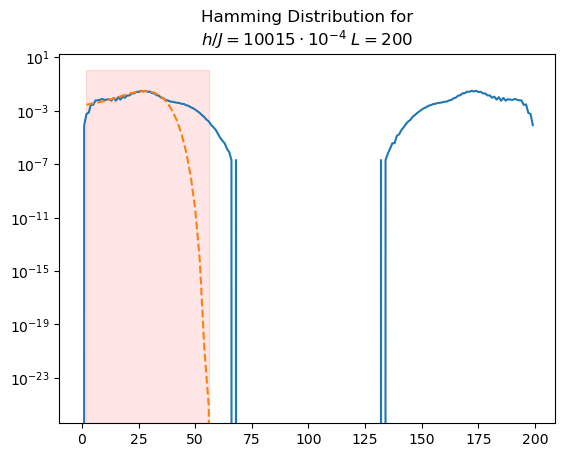

[1, 14, 47]
INSIDE
0 0.6264545729101616 0.6264545729101616 interval=[ 2 , 92 ]
1 0.6287349276274733 0.6264545729101616 interval=[ 2 , 92 ]
12 0.5710104310645737 0.5710104310645737 interval=[ 2 , 68 ]
13 0.5874346068009416 0.5710104310645737 interval=[ 2 , 68 ]
14 0.6094885324938519 0.5710104310645737 interval=[ 2 , 68 ]
15 0.6325965015737437 0.5710104310645737 interval=[ 2 , 68 ]
16 0.6539414069819852 0.5710104310645737 interval=[ 2 , 68 ]
17 0.6733155440588259 0.5710104310645737 interval=[ 2 , 68 ]
18 0.692861124710356 0.5710104310645737 interval=[ 2 , 68 ]
19 0.7147542681144933 0.5710104310645737 interval=[ 2 , 68 ]
20 0.7398156630160467 0.5710104310645737 interval=[ 2 , 68 ]
21 0.7669167569255679 0.5710104310645737 interval=[ 2 , 68 ]
22 0.9331209700734524 0.5710104310645737 interval=[ 2 , 68 ]
23 0.9554427647382413 0.5710104310645737 interval=[ 2 , 68 ]
24 0.9839502890940921 0.5710104310645737 interval=[ 2 , 68 ]
27 8.709333756838854 0.5710104310645737 interval=[ 2 , 68 ]
28 9.0171

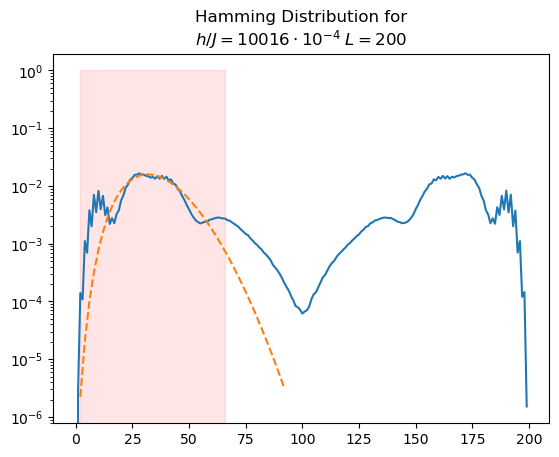

[1, 10, 31]
INSIDE
0 114.49005509097461 0.07887590672834037 interval=[ 2 , 60 ]
1 114.51517997327346 0.07887590672834037 interval=[ 2 , 60 ]
2 114.57590992359744 0.07887590672834037 interval=[ 2 , 60 ]
3 0.4126955466199562 0.07887590672834037 interval=[ 2 , 60 ]
4 115.01700117576075 0.07887590672834037 interval=[ 2 , 60 ]
5 115.89339854531927 0.07887590672834037 interval=[ 2 , 60 ]
6 118.01433717728251 0.07887590672834037 interval=[ 2 , 60 ]
7 122.11724104285776 0.07887590672834037 interval=[ 2 , 60 ]
8 127.5603520180537 0.07887590672834037 interval=[ 2 , 60 ]
9 133.3340722438885 0.07887590672834037 interval=[ 2 , 60 ]
10 135.40207001475224 0.07887590672834037 interval=[ 2 , 60 ]
11 126.35129557878298 0.07887590672834037 interval=[ 2 , 60 ]
12 134.2900142958195 0.07887590672834037 interval=[ 2 , 60 ]
13 136.80592959424757 0.07887590672834037 interval=[ 2 , 60 ]
14 0.812731156798465 0.07887590672834037 interval=[ 2 , 60 ]
15 1.3874900953049383 0.07887590672834037 interval=[ 2 , 60 ]
16 

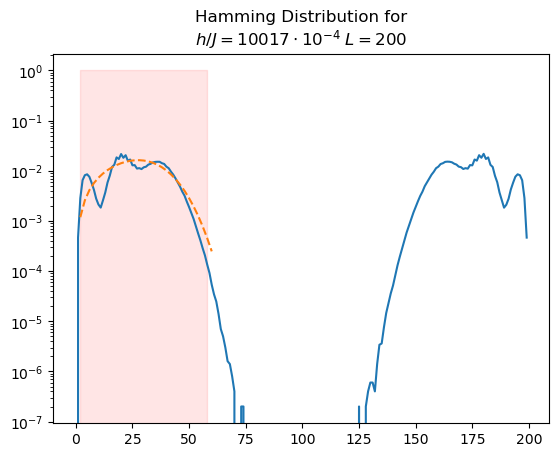

[1, 9, 23]
INSIDE
0 0.38632467964710554 0.015748667981061677 interval=[ 2 , 44 ]
1 0.3874634092009524 0.015748667981061677 interval=[ 2 , 44 ]
2 0.3901479655267478 0.015748667981061677 interval=[ 2 , 44 ]
3 0.39665173897426215 0.015748667981061677 interval=[ 2 , 44 ]
4 0.40947580253424043 0.015748667981061677 interval=[ 2 , 44 ]
5 0.4328628177751346 0.015748667981061677 interval=[ 2 , 44 ]
6 0.46534967906246366 0.015748667981061677 interval=[ 2 , 44 ]
7 0.5116189714197414 0.015748667981061677 interval=[ 2 , 44 ]
8 0.5659241694053553 0.015748667981061677 interval=[ 2 , 44 ]
9 0.6259464177315447 0.015748667981061677 interval=[ 2 , 44 ]
10 0.6894214813752014 0.015748667981061677 interval=[ 2 , 44 ]
11 0.7618005495896174 0.015748667981061677 interval=[ 2 , 44 ]
16 55.232590208732574 0.015748667981061677 interval=[ 2 , 44 ]
17 nan 0.015748667981061677 interval=[ 2 , 44 ]
18 nan 0.015748667981061677 interval=[ 2 , 44 ]
23 0.4027453134192834 0.015748667981061677 interval=[ 2 , 44 ]
28 3.25583

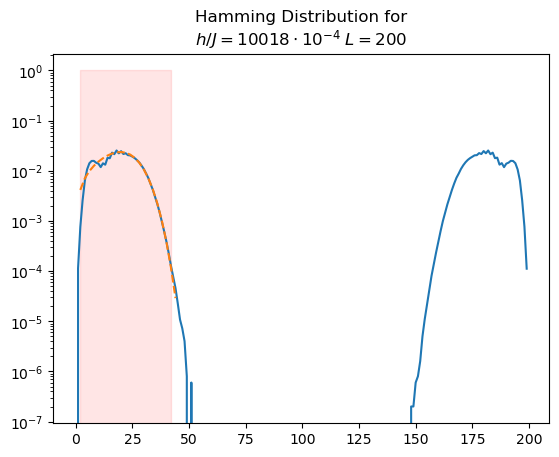

[3, 11, 30]
INSIDE
0 8.959755564385333 0.02099981136961228 interval=[ 6 , 58 ]
1 12.240918015763198 0.02099981136961228 interval=[ 6 , 58 ]
2 15.71962317112262 0.02099981136961228 interval=[ 6 , 58 ]
3 19.44997881880766 0.02099981136961228 interval=[ 6 , 58 ]
4 23.35198769280264 0.02099981136961228 interval=[ 6 , 58 ]
5 27.318761177924234 0.02099981136961228 interval=[ 6 , 58 ]
6 31.102580464167552 0.02099981136961228 interval=[ 6 , 58 ]
10 24.85698894814105 0.02099981136961228 interval=[ 6 , 58 ]
11 nan 0.02099981136961228 interval=[ 6 , 58 ]
12 0.9825400351907427 0.02099981136961228 interval=[ 6 , 58 ]
13 42.75772066649005 0.02099981136961228 interval=[ 6 , 58 ]
14 66.13096843304896 0.02099981136961228 interval=[ 6 , 58 ]
15 69.65189763217519 0.02099981136961228 interval=[ 6 , 58 ]
16 55.68833092871553 0.02099981136961228 interval=[ 6 , 58 ]
17 8.35981783774336 0.02099981136961228 interval=[ 6 , 58 ]
18 nan 0.02099981136961228 interval=[ 6 , 58 ]
19 nan 0.02099981136961228 interval=[

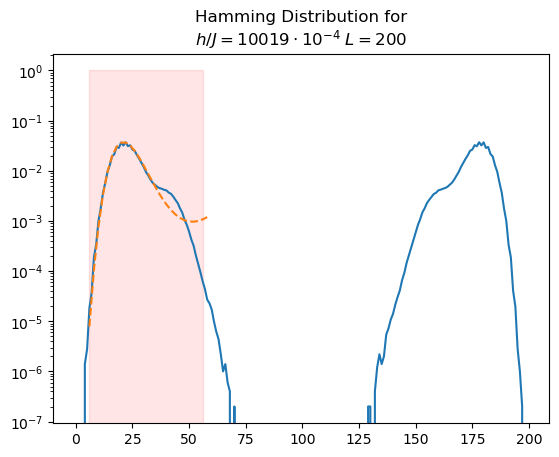

[1, 11, 28]
INSIDE
0 nan 2.1356485979395328 interval=[ 2 , 54 ]
1 4.603856277626078 2.1356485979395328 interval=[ 2 , 54 ]
2 2.261857263239824 2.1356485979395328 interval=[ 2 , 54 ]
3 2.257687324633707 2.1356485979395328 interval=[ 2 , 54 ]
4 2.2484920460868127 2.1356485979395328 interval=[ 2 , 54 ]
5 2.230975161114358 2.1356485979395328 interval=[ 2 , 54 ]
6 2.2042324817165424 2.1356485979395328 interval=[ 2 , 54 ]
7 2.1708409733667193 2.1356485979395328 interval=[ 2 , 54 ]
8 2.134459446459423 2.134459446459423 interval=[ 2 , 38 ]
9 2.10370457778569 2.10370457778569 interval=[ 2 , 36 ]
10 2.1180396136104807 2.10370457778569 interval=[ 2 , 36 ]
11 27.61762193284414 2.10370457778569 interval=[ 2 , 36 ]
12 32.28645049737123 2.10370457778569 interval=[ 2 , 36 ]
14 49.13657206018448 2.10370457778569 interval=[ 2 , 36 ]
15 60.26667204672288 2.10370457778569 interval=[ 2 , 36 ]
16 72.30414448648337 2.10370457778569 interval=[ 2 , 36 ]
17 83.0763509716619 2.10370457778569 interval=[ 2 , 36 ]


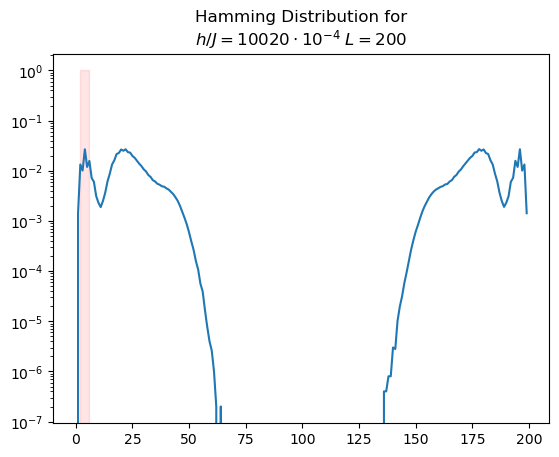

[46, 61, 60]
final parameters:
[(array([ 1.17915668e+00,  1.19771468e+00, -5.70056629e-03,  1.86350243e+02]), array([[ 7.53463805e-04, -1.31092841e-02,  6.14120313e-05,
         7.04272216e-01],
       [-1.31092841e-02,  2.63778278e-01, -1.22618902e-03,
        -1.42713721e+01],
       [ 6.14120313e-05, -1.22618902e-03,  5.70244357e-06,
         6.63150561e-02],
       [ 7.04272216e-01, -1.42713721e+01,  6.63150561e-02,
         7.72418914e+02]])), 2.761747057529538e-05, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
2.761747057529538e-05
(array([ 1.17915668e+00,  1.19771468e+00, -5.70056629e-03,  1.86350243e+02]), array([[ 7.53463805e-04, -1.31092841e-02,  6.14120313e-05,
         7.04272216e-01],
       [-1.31092841e-02,  2.63778278e-01, -1.22618902e-03,
        -1.42713721e+01],
       [ 6.14120313e-05, -1.22618902e-03,  5.70244357e-06,
         6.63150561e-02],
       [ 7.04272216e-01, -1.42713721e+01,  6.63150561e-02,
         7.72418914e+02]]))
[2.744

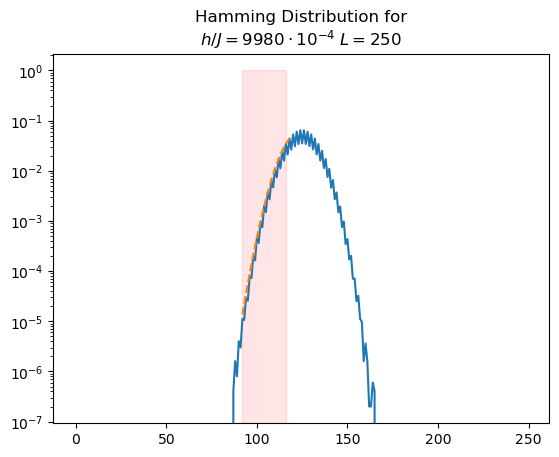

[47, 61, 60]
final parameters:
[(array([ 1.22624280e+00, -3.69138835e-01,  1.76363351e-03,  2.69232427e+02]), array([[ 1.13510758e-03, -1.36397415e-02,  6.43689197e-05,
         7.29238163e-01],
       [-1.36397415e-02,  1.82677049e-01, -8.56339730e-04,
        -9.82562542e+00],
       [ 6.43689197e-05, -8.56339730e-04,  4.01598662e-06,
         4.60420425e-02],
       [ 7.29238163e-01, -9.82562542e+00,  4.60420425e-02,
         5.28676478e+02]])), 1.0605307395172097e-05, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
1.0605307395172097e-05
(array([ 1.22624280e+00, -3.69138835e-01,  1.76363351e-03,  2.69232427e+02]), array([[ 1.13510758e-03, -1.36397415e-02,  6.43689197e-05,
         7.29238163e-01],
       [-1.36397415e-02,  1.82677049e-01, -8.56339730e-04,
        -9.82562542e+00],
       [ 6.43689197e-05, -8.56339730e-04,  4.01598662e-06,
         4.60420425e-02],
       [ 7.29238163e-01, -9.82562542e+00,  4.60420425e-02,
         5.28676478e+02]]))
[3.36913

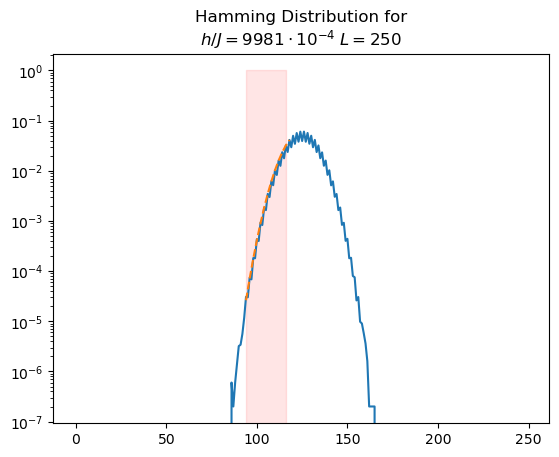

[46, 61, 60]
final parameters:
[(array([ 1.24028098e+00, -7.31025109e-02,  4.04401450e-04,  2.53001034e+02]), array([[ 6.13110994e-04, -7.55595573e-03,  3.56287747e-05,
         4.04177465e-01],
       [-7.55595573e-03,  1.04245753e-01, -4.88198426e-04,
        -5.61070612e+00],
       [ 3.56287747e-05, -4.88198426e-04,  2.28728141e-06,
         2.62655418e-02],
       [ 4.04177465e-01, -5.61070612e+00,  2.62655418e-02,
         3.02086902e+02]])), 6.3257844086728676e-06, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
6.3257844086728676e-06
(array([ 1.24028098e+00, -7.31025109e-02,  4.04401450e-04,  2.53001034e+02]), array([[ 6.13110994e-04, -7.55595573e-03,  3.56287747e-05,
         4.04177465e-01],
       [-7.55595573e-03,  1.04245753e-01, -4.88198426e-04,
        -5.61070612e+00],
       [ 3.56287747e-05, -4.88198426e-04,  2.28728141e-06,
         2.62655418e-02],
       [ 4.04177465e-01, -5.61070612e+00,  2.62655418e-02,
         3.02086902e+02]]))
[2.4

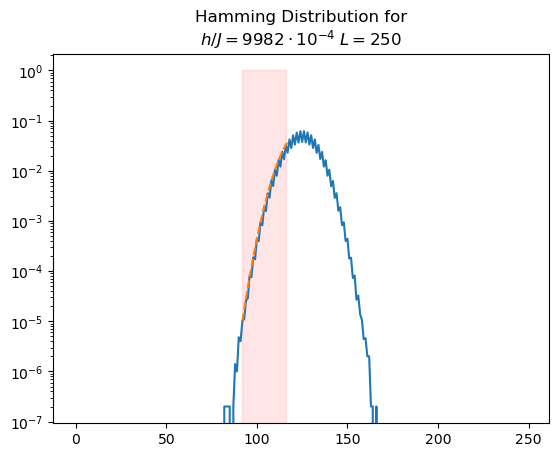

[47, 61, 60]
final parameters:
[(array([ 1.06150000e+00,  3.18872511e-01, -1.48400908e-03,  2.32546967e+02]), array([[ 2.97645279e-04, -4.69376207e-03,  2.20816699e-05,
         2.51467479e-01],
       [-4.69376207e-03,  8.36864869e-02, -3.90900504e-04,
        -4.51251674e+00],
       [ 2.20816699e-05, -3.90900504e-04,  1.82668086e-06,
         2.10697508e-02],
       [ 2.51467479e-01, -4.51251674e+00,  2.10697508e-02,
         2.43410547e+02]])), 6.158326037645452e-06, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
6.158326037645452e-06
(array([ 1.06150000e+00,  3.18872511e-01, -1.48400908e-03,  2.32546967e+02]), array([[ 2.97645279e-04, -4.69376207e-03,  2.20816699e-05,
         2.51467479e-01],
       [-4.69376207e-03,  8.36864869e-02, -3.90900504e-04,
        -4.51251674e+00],
       [ 2.20816699e-05, -3.90900504e-04,  1.82668086e-06,
         2.10697508e-02],
       [ 2.51467479e-01, -4.51251674e+00,  2.10697508e-02,
         2.43410547e+02]]))
[1.7252399

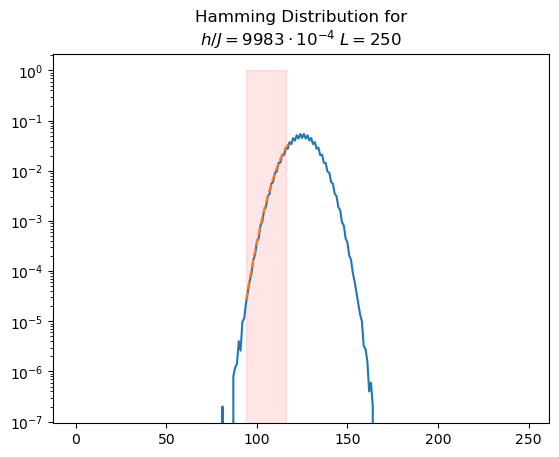

[46, 61, 60]
final parameters:
[(array([ 1.31492839e+00, -1.22487336e+00,  5.95109878e-03,  3.13590022e+02]), array([[ 3.25633704e-03, -2.76029563e-02,  1.31232685e-04,
         1.46885690e+00],
       [-2.76029563e-02,  2.55099499e-01, -1.20552847e-03,
        -1.36474036e+01],
       [ 1.31232685e-04, -1.20552847e-03,  5.69942859e-06,
         6.44690619e-02],
       [ 1.46885690e+00, -1.36474036e+01,  6.44690619e-02,
         7.30365615e+02]])), 2.505165238108568e-05, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
2.505165238108568e-05
(array([ 1.31492839e+00, -1.22487336e+00,  5.95109878e-03,  3.13590022e+02]), array([[ 3.25633704e-03, -2.76029563e-02,  1.31232685e-04,
         1.46885690e+00],
       [-2.76029563e-02,  2.55099499e-01, -1.20552847e-03,
        -1.36474036e+01],
       [ 1.31232685e-04, -1.20552847e-03,  5.69942859e-06,
         6.44690619e-02],
       [ 1.46885690e+00, -1.36474036e+01,  6.44690619e-02,
         7.30365615e+02]]))
[5.706

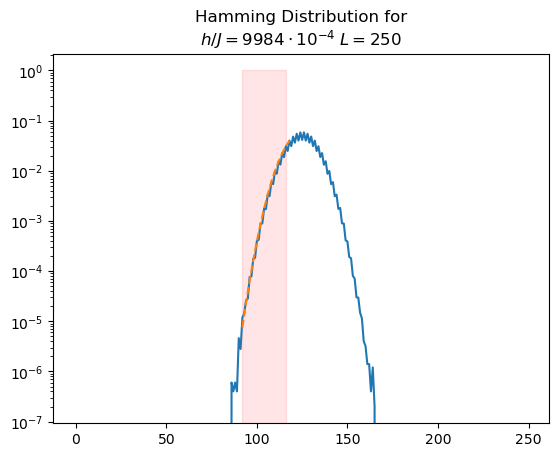

[47, 61, 60]
final parameters:
[(array([ 1.09894322e+00, -3.25835885e-01,  1.61983751e-03,  2.66405985e+02]), array([[ 1.00240542e-03, -1.29147607e-02,  6.09960880e-05,
         6.90160368e-01],
       [-1.29147607e-02,  1.85027350e-01, -8.68086588e-04,
        -9.94691919e+00],
       [ 6.09960880e-05, -8.68086588e-04,  4.07451090e-06,
         4.66495309e-02],
       [ 6.90160368e-01, -9.94691919e+00,  4.66495309e-02,
         5.34927659e+02]])), 1.0512002466136565e-05, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
1.0512002466136565e-05
(array([ 1.09894322e+00, -3.25835885e-01,  1.61983751e-03,  2.66405985e+02]), array([[ 1.00240542e-03, -1.29147607e-02,  6.09960880e-05,
         6.90160368e-01],
       [-1.29147607e-02,  1.85027350e-01, -8.68086588e-04,
        -9.94691919e+00],
       [ 6.09960880e-05, -8.68086588e-04,  4.07451090e-06,
         4.66495309e-02],
       [ 6.90160368e-01, -9.94691919e+00,  4.66495309e-02,
         5.34927659e+02]]))
[3.16607

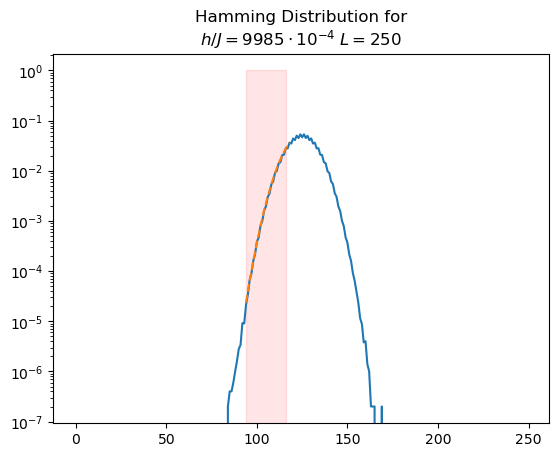

[47, 61, 60]
final parameters:
[(array([ 1.24261693e+00, -8.20621120e-01,  3.95578173e-03,  2.92891684e+02]), array([[ 1.53409655e-03, -1.57507359e-02,  7.45891955e-05,
         8.40289960e-01],
       [-1.57507359e-02,  1.78075754e-01, -8.37973274e-04,
        -9.55398251e+00],
       [ 7.45891955e-05, -8.37973274e-04,  3.94493615e-06,
         4.49410526e-02],
       [ 8.40289960e-01, -9.55398251e+00,  4.49410526e-02,
         5.12761312e+02]])), 2.4278134355921808e-05, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
2.4278134355921808e-05
(array([ 1.24261693e+00, -8.20621120e-01,  3.95578173e-03,  2.92891684e+02]), array([[ 1.53409655e-03, -1.57507359e-02,  7.45891955e-05,
         8.40289960e-01],
       [-1.57507359e-02,  1.78075754e-01, -8.37973274e-04,
        -9.55398251e+00],
       [ 7.45891955e-05, -8.37973274e-04,  3.94493615e-06,
         4.49410526e-02],
       [ 8.40289960e-01, -9.55398251e+00,  4.49410526e-02,
         5.12761312e+02]]))
[3.91675

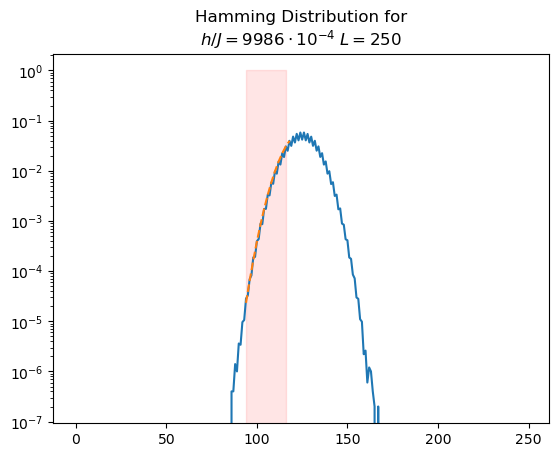

[46, 61, 60]
final parameters:
[(array([ 1.23431545e+00, -3.69254260e-01,  1.75346573e-03,  2.69397175e+02]), array([[ 6.40103226e-04, -7.65489765e-03,  3.61201649e-05,
         4.09311714e-01],
       [-7.65489765e-03,  1.02083805e-01, -4.78464598e-04,
        -5.49152792e+00],
       [ 3.61201649e-05, -4.78464598e-04,  2.24350534e-06,
         2.57287195e-02],
       [ 4.09311714e-01, -5.49152792e+00,  2.57287195e-02,
         2.95517595e+02]])), 1.076072437762132e-05, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
1.076072437762132e-05
(array([ 1.23431545e+00, -3.69254260e-01,  1.75346573e-03,  2.69397175e+02]), array([[ 6.40103226e-04, -7.65489765e-03,  3.61201649e-05,
         4.09311714e-01],
       [-7.65489765e-03,  1.02083805e-01, -4.78464598e-04,
        -5.49152792e+00],
       [ 3.61201649e-05, -4.78464598e-04,  2.24350534e-06,
         2.57287195e-02],
       [ 4.09311714e-01, -5.49152792e+00,  2.57287195e-02,
         2.95517595e+02]]))
[2.530

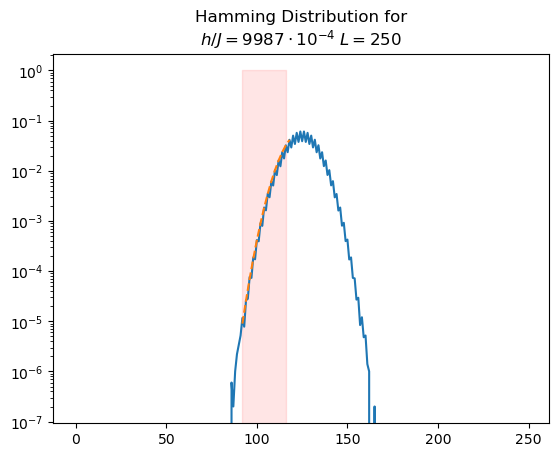

[46, 61, 60]
final parameters:
[(array([ 1.07380800e+00,  9.24460678e-01, -4.33276182e-03,  2.00203498e+02]), array([[ 7.07487593e-05, -1.21551576e-03,  5.70576388e-06,
         6.52162165e-02],
       [-1.21551576e-03,  2.38839989e-02, -1.11280191e-04,
        -1.29017279e+00],
       [ 5.70576388e-06, -1.11280191e-04,  5.18698556e-07,
         6.00878480e-03],
       [ 6.52162165e-02, -1.29017279e+00,  6.00878480e-03,
         6.97185427e+01]])), 6.11255338911085e-06, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
6.11255338911085e-06
(array([ 1.07380800e+00,  9.24460678e-01, -4.33276182e-03,  2.00203498e+02]), array([[ 7.07487593e-05, -1.21551576e-03,  5.70576388e-06,
         6.52162165e-02],
       [-1.21551576e-03,  2.38839989e-02, -1.11280191e-04,
        -1.29017279e+00],
       [ 5.70576388e-06, -1.11280191e-04,  5.18698556e-07,
         6.00878480e-03],
       [ 6.52162165e-02, -1.29017279e+00,  6.00878480e-03,
         6.97185427e+01]]))
[8.41122

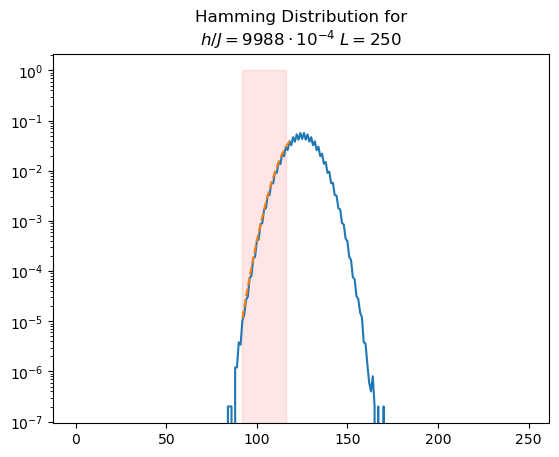

[47, 61, 60]
final parameters:
[(array([ 9.46535737e-01,  1.30618377e+00, -6.17881553e-03,  1.80226864e+02]), array([[ 4.60586021e-04, -9.96381778e-03,  4.66780402e-05,
         5.35275952e-01],
       [-9.96381778e-03,  2.49437826e-01, -1.15952323e-03,
        -1.34955683e+01],
       [ 4.66780402e-05, -1.15952323e-03,  5.39240458e-06,
         6.27098416e-02],
       [ 5.35275952e-01, -1.34955683e+01,  6.27098416e-02,
         7.30434176e+02]])), 2.7441402607728477e-05, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
2.7441402607728477e-05
(array([ 9.46535737e-01,  1.30618377e+00, -6.17881553e-03,  1.80226864e+02]), array([[ 4.60586021e-04, -9.96381778e-03,  4.66780402e-05,
         5.35275952e-01],
       [-9.96381778e-03,  2.49437826e-01, -1.15952323e-03,
        -1.34955683e+01],
       [ 4.66780402e-05, -1.15952323e-03,  5.39240458e-06,
         6.27098416e-02],
       [ 5.35275952e-01, -1.34955683e+01,  6.27098416e-02,
         7.30434176e+02]]))
[2.14612

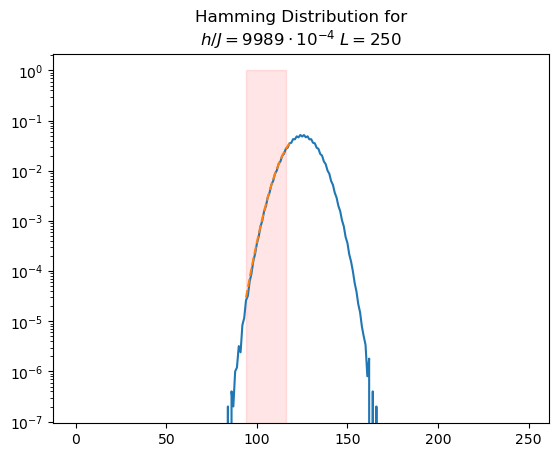

[47, 61, 60]
final parameters:
[(array([ 1.12099355e+00,  5.10377011e-01, -2.41305655e-03,  2.22597383e+02]), array([[ 6.14191442e-04, -9.63578876e-03,  4.52808829e-05,
         5.16615059e-01],
       [-9.63578876e-03,  1.71723337e-01, -8.01136235e-04,
        -9.26755086e+00],
       [ 4.52808829e-05, -8.01136235e-04,  3.73911106e-06,
         4.32187079e-02],
       [ 5.16615059e-01, -9.26755086e+00,  4.32187079e-02,
         5.00331809e+02]])), 1.408274150427073e-05, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
1.408274150427073e-05
(array([ 1.12099355e+00,  5.10377011e-01, -2.41305655e-03,  2.22597383e+02]), array([[ 6.14191442e-04, -9.63578876e-03,  4.52808829e-05,
         5.16615059e-01],
       [-9.63578876e-03,  1.71723337e-01, -8.01136235e-04,
        -9.26755086e+00],
       [ 4.52808829e-05, -8.01136235e-04,  3.73911106e-06,
         4.32187079e-02],
       [ 5.16615059e-01, -9.26755086e+00,  4.32187079e-02,
         5.00331809e+02]]))
[2.4782886

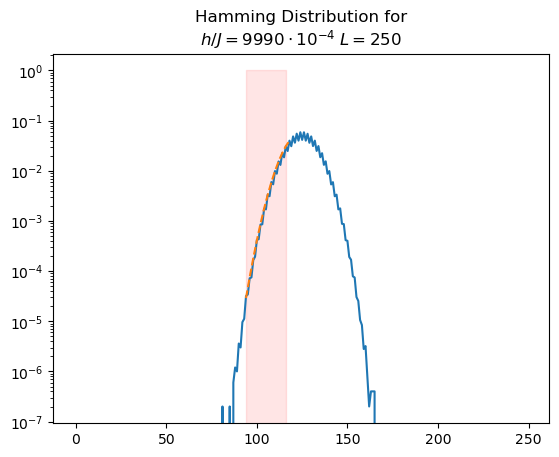

[47, 61, 60]
final parameters:
[(array([ 1.31705988e+00, -1.81152713e+00,  8.65302118e-03,  3.45747561e+02]), array([[ 7.06044055e-03, -5.45345356e-02,  2.59988555e-04,
         2.89700545e+00],
       [-5.45345356e-02,  4.55206746e-01, -2.15790856e-03,
        -2.43025506e+01],
       [ 2.59988555e-04, -2.15790856e-03,  1.02338621e-05,
         1.15163247e-01],
       [ 2.89700545e+00, -2.43025506e+01,  1.15163247e-01,
         1.29789718e+03]])), 7.705203416693218e-05, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
7.705203416693218e-05
(array([ 1.31705988e+00, -1.81152713e+00,  8.65302118e-03,  3.45747561e+02]), array([[ 7.06044055e-03, -5.45345356e-02,  2.59988555e-04,
         2.89700545e+00],
       [-5.45345356e-02,  4.55206746e-01, -2.15790856e-03,
        -2.43025506e+01],
       [ 2.59988555e-04, -2.15790856e-03,  1.02338621e-05,
         1.15163247e-01],
       [ 2.89700545e+00, -2.43025506e+01,  1.15163247e-01,
         1.29789718e+03]]))
[8.4026427

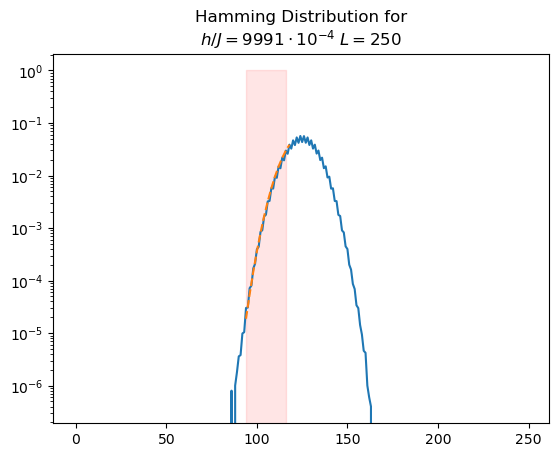

[47, 61, 60]
final parameters:
[(array([ 1.08424907e+00, -6.43316472e-01,  3.09088537e-03,  2.83641927e+02]), array([[ 1.57115099e-03, -1.96133837e-02,  9.27435876e-05,
         1.04732720e+00],
       [-1.96133837e-02,  2.70900056e-01, -1.27270547e-03,
        -1.45497174e+01],
       [ 9.27435876e-05, -1.27270547e-03,  5.98178657e-06,
         6.83292110e-02],
       [ 1.04732720e+00, -1.45497174e+01,  6.83292110e-02,
         7.81721569e+02]])), 8.894719656582676e-06, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
8.894719656582676e-06
(array([ 1.08424907e+00, -6.43316472e-01,  3.09088537e-03,  2.83641927e+02]), array([[ 1.57115099e-03, -1.96133837e-02,  9.27435876e-05,
         1.04732720e+00],
       [-1.96133837e-02,  2.70900056e-01, -1.27270547e-03,
        -1.45497174e+01],
       [ 9.27435876e-05, -1.27270547e-03,  5.98178657e-06,
         6.83292110e-02],
       [ 1.04732720e+00, -1.45497174e+01,  6.83292110e-02,
         7.81721569e+02]]))
[3.9637747

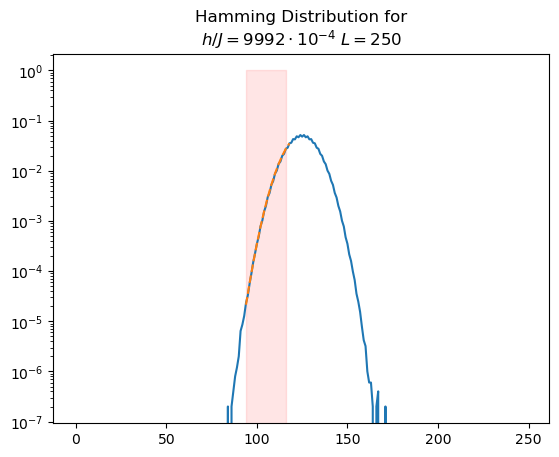

[47, 61, 60]
final parameters:
[(array([ 1.08484806e+00,  4.93880582e-01, -2.36176376e-03,  2.23725269e+02]), array([[ 1.90503750e-04, -3.13836488e-03,  1.47432671e-05,
         1.68294994e-01],
       [-3.13836488e-03,  5.88095469e-02, -2.74267501e-04,
        -3.17457716e+00],
       [ 1.47432671e-05, -2.74267501e-04,  1.27963316e-06,
         1.47993377e-02],
       [ 1.68294994e-01, -3.17457716e+00,  1.47993377e-02,
         1.71427871e+02]])), 9.997159926220913e-06, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
9.997159926220913e-06
(array([ 1.08484806e+00,  4.93880582e-01, -2.36176376e-03,  2.23725269e+02]), array([[ 1.90503750e-04, -3.13836488e-03,  1.47432671e-05,
         1.68294994e-01],
       [-3.13836488e-03,  5.88095469e-02, -2.74267501e-04,
        -3.17457716e+00],
       [ 1.47432671e-05, -2.74267501e-04,  1.27963316e-06,
         1.47993377e-02],
       [ 1.68294994e-01, -3.17457716e+00,  1.47993377e-02,
         1.71427871e+02]]))
[1.3802309

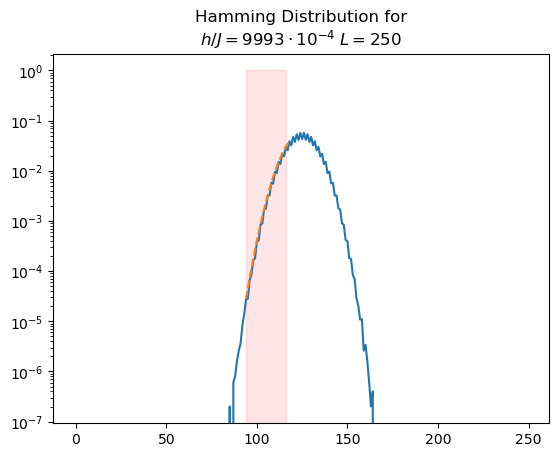

[46, 61, 60]
final parameters:
[(array([ 1.13773752e+00, -5.76342448e-01,  2.73883376e-03,  2.80558298e+02]), array([[ 1.05187954e-03, -1.27952006e-02,  6.04542376e-05,
         6.83653076e-01],
       [-1.27952006e-02,  1.72446795e-01, -8.09493154e-04,
        -9.26767425e+00],
       [ 6.04542376e-05, -8.09493154e-04,  3.80149278e-06,
         4.34873304e-02],
       [ 6.83653076e-01, -9.26767425e+00,  4.34873304e-02,
         4.98239141e+02]])), 1.3598108807569211e-05, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
1.3598108807569211e-05
(array([ 1.13773752e+00, -5.76342448e-01,  2.73883376e-03,  2.80558298e+02]), array([[ 1.05187954e-03, -1.27952006e-02,  6.04542376e-05,
         6.83653076e-01],
       [-1.27952006e-02,  1.72446795e-01, -8.09493154e-04,
        -9.26767425e+00],
       [ 6.04542376e-05, -8.09493154e-04,  3.80149278e-06,
         4.34873304e-02],
       [ 6.83653076e-01, -9.26767425e+00,  4.34873304e-02,
         4.98239141e+02]]))
[3.2

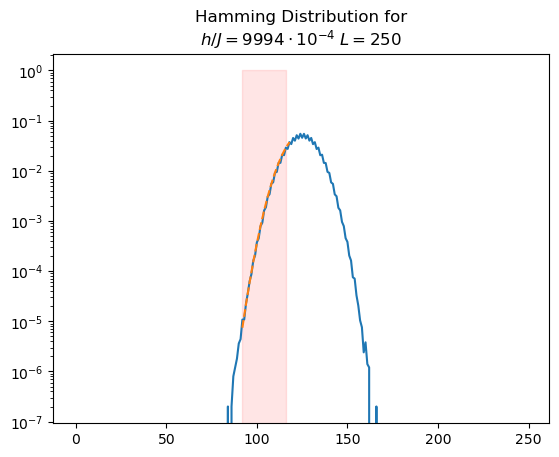

[46, 61, 60]
final parameters:
[(array([ 1.01627490e+00,  4.59358737e-01, -1.84969536e-03,  2.21006027e+02]), array([[ 7.93850277e-04, -1.23717561e-02,  5.83908461e-05,
         6.60991430e-01],
       [-1.23717561e-02,  2.18456891e-01, -1.02338732e-03,
        -1.17502852e+01],
       [ 5.83908461e-05, -1.02338732e-03,  4.79637810e-06,
         5.50225197e-02],
       [ 6.60991430e-01, -1.17502852e+01,  5.50225197e-02,
         6.32264326e+02]])), 2.2817142691313245e-05, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
2.2817142691313245e-05
(array([ 1.01627490e+00,  4.59358737e-01, -1.84969536e-03,  2.21006027e+02]), array([[ 7.93850277e-04, -1.23717561e-02,  5.83908461e-05,
         6.60991430e-01],
       [-1.23717561e-02,  2.18456891e-01, -1.02338732e-03,
        -1.17502852e+01],
       [ 5.83908461e-05, -1.02338732e-03,  4.79637810e-06,
         5.50225197e-02],
       [ 6.60991430e-01, -1.17502852e+01,  5.50225197e-02,
         6.32264326e+02]]))
[2.8

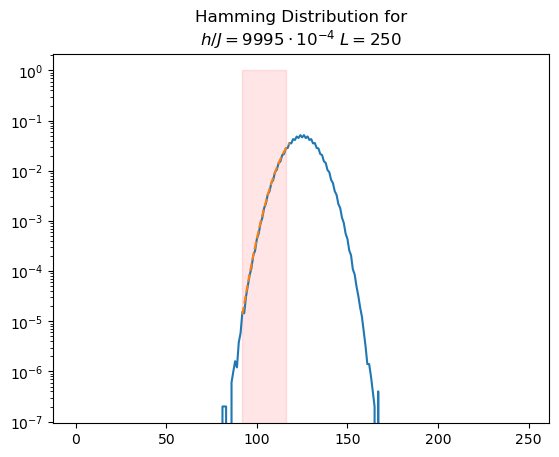

[47, 61, 60]
final parameters:
[(array([ 1.18646190e+00, -2.07601147e-01,  9.64712637e-04,  2.61104837e+02]), array([[ 1.11140868e-03, -1.43773063e-02,  6.77660037e-05,
         7.69346155e-01],
       [-1.43773063e-02,  2.08044757e-01, -9.73964834e-04,
        -1.12009668e+01],
       [ 6.77660037e-05, -9.73964834e-04,  4.56155597e-06,
         5.24172995e-02],
       [ 7.69346155e-01, -1.12009668e+01,  5.24172995e-02,
         6.03264599e+02]])), 8.353483621466732e-06, [0, 12]]
[0, 12]
0 12
[ 94  96  98 100 102 104 106 108 110 112 114 116]
8.353483621466732e-06
(array([ 1.18646190e+00, -2.07601147e-01,  9.64712637e-04,  2.61104837e+02]), array([[ 1.11140868e-03, -1.43773063e-02,  6.77660037e-05,
         7.69346155e-01],
       [-1.43773063e-02,  2.08044757e-01, -9.73964834e-04,
        -1.12009668e+01],
       [ 6.77660037e-05, -9.73964834e-04,  4.56155597e-06,
         5.24172995e-02],
       [ 7.69346155e-01, -1.12009668e+01,  5.24172995e-02,
         6.03264599e+02]]))
[3.3337796

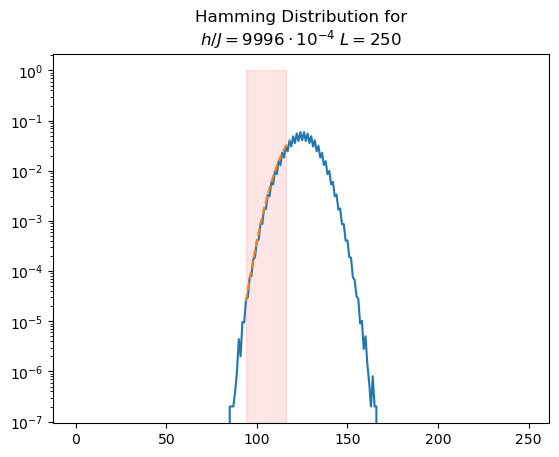

[46, 61, 60]
final parameters:
[(array([ 1.16384602e+00,  5.79363305e-01, -2.57399441e-03,  2.16868765e+02]), array([[ 2.71026068e-04, -3.88684394e-03,  1.82995246e-05,
         2.08082968e-01],
       [-3.88684394e-03,  6.32273717e-02, -2.95503057e-04,
        -3.40740510e+00],
       [ 1.82995246e-05, -2.95503057e-04,  1.38168786e-06,
         1.59186114e-02],
       [ 2.08082968e-01, -3.40740510e+00,  1.59186114e-02,
         1.83697922e+02]])), 9.700219752899595e-06, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
9.700219752899595e-06
(array([ 1.16384602e+00,  5.79363305e-01, -2.57399441e-03,  2.16868765e+02]), array([[ 2.71026068e-04, -3.88684394e-03,  1.82995246e-05,
         2.08082968e-01],
       [-3.88684394e-03,  6.32273717e-02, -2.95503057e-04,
        -3.40740510e+00],
       [ 1.82995246e-05, -2.95503057e-04,  1.38168786e-06,
         1.59186114e-02],
       [ 2.08082968e-01, -3.40740510e+00,  1.59186114e-02,
         1.83697922e+02]]))
[1.646

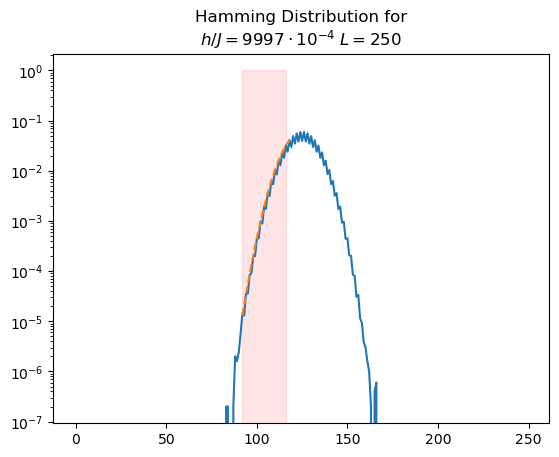

[46, 61, 60]
final parameters:
[(array([ 1.11372116e+00, -1.59417768e-01,  1.07085860e-03,  2.53669555e+02]), array([[ 5.85548337e-04, -7.69971498e-03,  3.64344406e-05,
         4.10604992e-01],
       [-7.69971498e-03,  1.13626378e-01, -5.33828513e-04,
        -6.09851678e+00],
       [ 3.64344406e-05, -5.33828513e-04,  2.50913060e-06,
         2.86395117e-02],
       [ 4.10604992e-01, -6.09851678e+00,  2.86395117e-02,
         3.27442636e+02]])), 1.1624825578861736e-05, [0, 13]]
[0, 13]
0 13
[ 92  94  96  98 100 102 104 106 108 110 112 114 116]
1.1624825578861736e-05
(array([ 1.11372116e+00, -1.59417768e-01,  1.07085860e-03,  2.53669555e+02]), array([[ 5.85548337e-04, -7.69971498e-03,  3.64344406e-05,
         4.10604992e-01],
       [-7.69971498e-03,  1.13626378e-01, -5.33828513e-04,
        -6.09851678e+00],
       [ 3.64344406e-05, -5.33828513e-04,  2.50913060e-06,
         2.86395117e-02],
       [ 4.10604992e-01, -6.09851678e+00,  2.86395117e-02,
         3.27442636e+02]]))
[2.4

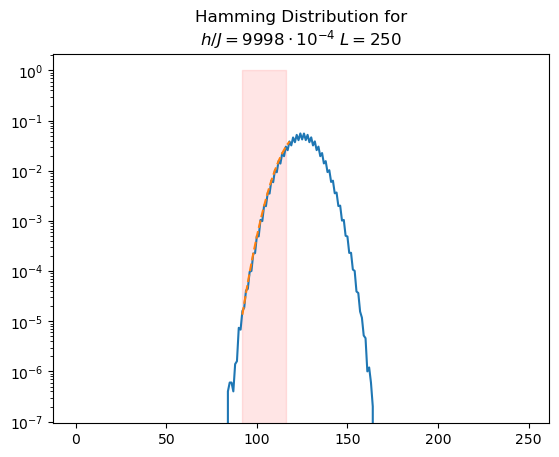

[45, 61, 60]
final parameters:
[(array([ 1.08804140e+00, -2.39798763e-01,  1.93300382e-03,  2.51606435e+02]), array([[ 1.66270163e-03, -1.87955425e-02,  8.96174359e-05,
         9.96473895e-01],
       [-1.87955425e-02,  2.37183809e-01, -1.12253986e-03,
        -1.26576899e+01],
       [ 8.96174359e-05, -1.12253986e-03,  5.31545763e-06,
         5.98785134e-02],
       [ 9.96473895e-01, -1.26576899e+01,  5.98785134e-02,
         6.75779881e+02]])), 1.8280346389236204e-05, [0, 14]]
[0, 14]
0 14
[ 90  92  94  96  98 100 102 104 106 108 110 112 114 116]
1.8280346389236204e-05
(array([ 1.08804140e+00, -2.39798763e-01,  1.93300382e-03,  2.51606435e+02]), array([[ 1.66270163e-03, -1.87955425e-02,  8.96174359e-05,
         9.96473895e-01],
       [-1.87955425e-02,  2.37183809e-01, -1.12253986e-03,
        -1.26576899e+01],
       [ 8.96174359e-05, -1.12253986e-03,  5.31545763e-06,
         5.98785134e-02],
       [ 9.96473895e-01, -1.26576899e+01,  5.98785134e-02,
         6.75779881e+02]]))


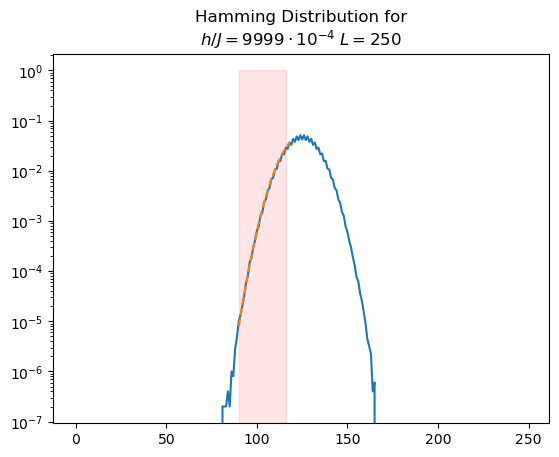

[44, 61, 60]
final parameters:
[(array([ 8.69529927e-01,  1.42850978e+00, -4.95030916e-03,  1.47802621e+02]), array([[ 2.44092539e-04, -4.00394087e-03,  1.92404124e-05,
         2.10350166e-01],
       [-4.00394087e-03,  7.77571149e-02, -3.69658853e-04,
        -4.12434520e+00],
       [ 1.92404124e-05, -3.69658853e-04,  1.75861319e-06,
         1.95945312e-02],
       [ 2.10350166e-01, -4.12434520e+00,  1.95945312e-02,
         2.18891171e+02]])), 8.274384808104875e-05, [0, 15]]
[0, 15]
0 15
[ 88  90  92  94  96  98 100 102 104 106 108 110 112 114 116]
8.274384808104875e-05
(array([ 8.69529927e-01,  1.42850978e+00, -4.95030916e-03,  1.47802621e+02]), array([[ 2.44092539e-04, -4.00394087e-03,  1.92404124e-05,
         2.10350166e-01],
       [-4.00394087e-03,  7.77571149e-02, -3.69658853e-04,
        -4.12434520e+00],
       [ 1.92404124e-05, -3.69658853e-04,  1.75861319e-06,
         1.95945312e-02],
       [ 2.10350166e-01, -4.12434520e+00,  1.95945312e-02,
         2.18891171e+02]])

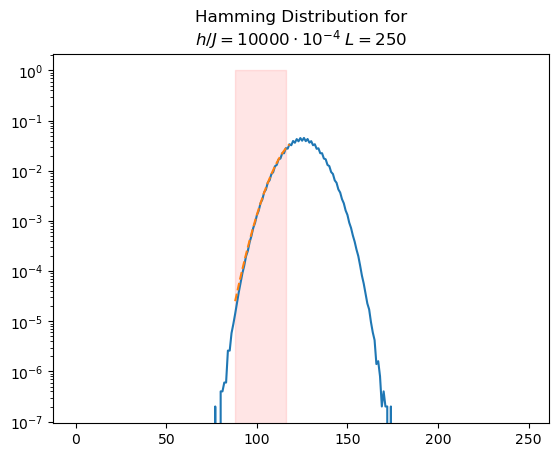

[42, 61, 60]
INSIDE
0 22.361139019453535 0.00010585045300846494 interval=[ 84 , 118 ]
1 22.041710030363053 0.00010585045300846494 interval=[ 84 , 118 ]
2 15.128336717602968 0.00010585045300846494 interval=[ 84 , 118 ]
3 19.864390159207463 0.00010585045300846494 interval=[ 84 , 118 ]
4 30.120474260886233 0.00010585045300846494 interval=[ 84 , 118 ]
5 nan 0.00010585045300846494 interval=[ 84 , 118 ]
6 20.817616044535896 0.00010585045300846494 interval=[ 84 , 118 ]
7 41.83599269499821 0.00010585045300846494 interval=[ 84 , 118 ]
8 nan 0.00010585045300846494 interval=[ 84 , 118 ]
9 46.16253155722799 0.00010585045300846494 interval=[ 84 , 118 ]
10 5.396937369922756 0.00010585045300846494 interval=[ 84 , 118 ]
12 3.694842853839435 0.00010585045300846494 interval=[ 84 , 118 ]
13 nan 0.00010585045300846494 interval=[ 84 , 118 ]


/tmp/ipykernel_2661/3375479267.py:18: RuntimeWarning: invalid value encountered in log
  return sum(map(lambda x: x[0]*np.log(x[0]/x[1]),zip(X,Y)))
/tmp/ipykernel_2661/3375479267.py:73: RuntimeWarning: invalid value encountered in divide
  KL_test=logKL(Y_test/np.sum(Y_test),YY/np.sum(YY))


19 22.041906441864025 0.00010585045300846494 interval=[ 84 , 118 ]
20 15.128260877805666 0.00010585045300846494 interval=[ 84 , 118 ]
21 19.8641214527318 0.00010585045300846494 interval=[ 84 , 118 ]
22 30.120076195137003 0.00010585045300846494 interval=[ 84 , 118 ]
23 nan 0.00010585045300846494 interval=[ 84 , 118 ]
24 20.807259203666675 0.00010585045300846494 interval=[ 84 , 118 ]
25 41.83634332354851 0.00010585045300846494 interval=[ 84 , 118 ]
26 nan 0.00010585045300846494 interval=[ 84 , 118 ]
27 46.16145080241155 0.00010585045300846494 interval=[ 84 , 118 ]
28 5.4035890053082944 0.00010585045300846494 interval=[ 84 , 118 ]
30 62.888097566255425 0.00010585045300846494 interval=[ 84 , 118 ]
31 nan 0.00010585045300846494 interval=[ 84 , 118 ]
final parameters:
[(array([ 5.70493136e-01, -2.34140710e+00,  1.32885457e-02,  3.31227717e+02]), array([[ 2.24312160e-05, -1.14409366e-03,  5.60383868e-06,
         5.87055820e-02],
       [-1.14409366e-03,  8.23431015e-02, -3.96613992e-04,
    

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar multiply
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


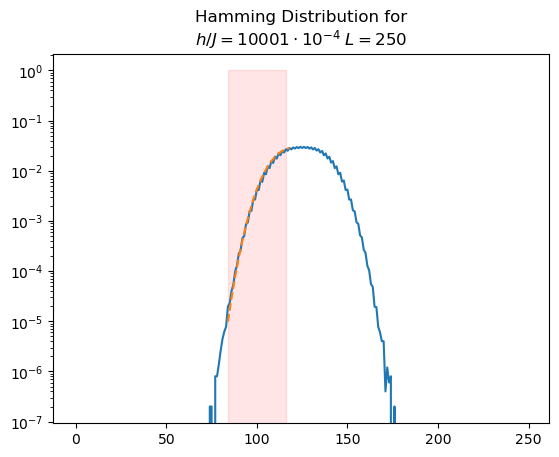

[38, 59, 59]
final parameters:
[(array([ 4.01381510e-01, -1.72622784e+00,  1.23693240e-02,  2.68138521e+02]), array([[ 3.12978083e-06, -1.84047696e-04,  9.57407434e-07,
         8.90530818e-03],
       [-1.84047696e-04,  1.70462191e-02, -8.65425189e-05,
        -8.42839875e-01],
       [ 9.57407434e-07, -8.65425189e-05,  4.40026560e-07,
         4.27305814e-03],
       [ 8.90530818e-03, -8.42839875e-01,  4.27305814e-03,
         4.17292318e+01]])), 3.7718770148371516e-05, [0, 20]]
[0, 20]
0 20
[ 76  78  80  82  84  86  88  90  92  94  96  98 100 102 104 106 108 110
 112 114]
3.7718770148371516e-05
(array([ 4.01381510e-01, -1.72622784e+00,  1.23693240e-02,  2.68138521e+02]), array([[ 3.12978083e-06, -1.84047696e-04,  9.57407434e-07,
         8.90530818e-03],
       [-1.84047696e-04,  1.70462191e-02, -8.65425189e-05,
        -8.42839875e-01],
       [ 9.57407434e-07, -8.65425189e-05,  4.40026560e-07,
         4.27305814e-03],
       [ 8.90530818e-03, -8.42839875e-01,  4.27305814e-03,
   

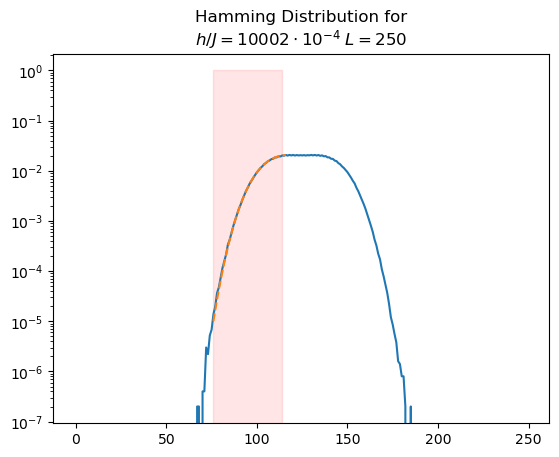

[32, 52, 59]
INSIDE
0 nan 0.0011297562214756252 interval=[ 64 , 116 ]
1 nan 0.0011297562214756252 interval=[ 64 , 116 ]
2 nan 0.0011297562214756252 interval=[ 64 , 116 ]
3 8.850980193735362 0.0011297562214756252 interval=[ 64 , 116 ]
4 23.678762189309673 0.0011297562214756252 interval=[ 64 , 116 ]
5 34.314108679459046 0.0011297562214756252 interval=[ 64 , 116 ]
6 49.32221852818844 0.0011297562214756252 interval=[ 64 , 116 ]
7 61.515763007704805 0.0011297562214756252 interval=[ 64 , 116 ]
8 87.67841198793495 0.0011297562214756252 interval=[ 64 , 116 ]
9 94.99199484611951 0.0011297562214756252 interval=[ 64 , 116 ]
10 95.19965648109076 0.0011297562214756252 interval=[ 64 , 116 ]
11 101.01505388356074 0.0011297562214756252 interval=[ 64 , 116 ]
12 114.02111511086582 0.0011297562214756252 interval=[ 64 , 116 ]
13 121.39291646416532 0.0011297562214756252 interval=[ 64 , 116 ]
14 101.13481723830266 0.0011297562214756252 interval=[ 64 , 116 ]
15 128.7859948337579 0.0011297562214756252 interva

/tmp/ipykernel_2661/3375479267.py:71: OptimizeWarning: Covariance of the parameters could not be estimated
  A=so.curve_fit(F,X_test,Y_test,p0=guesses)


28 49.534327432541865 0.0011297562214756252 interval=[ 64 , 116 ]
29 54.14681498341308 0.0011297562214756252 interval=[ 64 , 116 ]
30 59.73330165669035 0.0011297562214756252 interval=[ 64 , 116 ]
31 67.00655559830429 0.0011297562214756252 interval=[ 64 , 116 ]
32 72.72498734034009 0.0011297562214756252 interval=[ 64 , 116 ]
33 79.38901693185362 0.0011297562214756252 interval=[ 64 , 116 ]
34 84.64484115662432 0.0011297562214756252 interval=[ 64 , 116 ]
35 87.67795636655623 0.0011297562214756252 interval=[ 64 , 116 ]
36 94.99247628588711 0.0011297562214756252 interval=[ 64 , 116 ]
37 95.19968768554749 0.0011297562214756252 interval=[ 64 , 116 ]
38 101.01410794702542 0.0011297562214756252 interval=[ 64 , 116 ]
39 134.35439046053446 0.0011297562214756252 interval=[ 64 , 116 ]
40 121.39404927601423 0.0011297562214756252 interval=[ 64 , 116 ]
42 128.78466759198076 0.0011297562214756252 interval=[ 64 , 116 ]
43 143.0560097685052 0.0011297562214756252 interval=[ 64 , 116 ]
44 1.712435886158503

/tmp/ipykernel_2661/3375479267.py:18: RuntimeWarning: divide by zero encountered in scalar divide
  return sum(map(lambda x: x[0]*np.log(x[0]/x[1]),zip(X,Y)))


49 nan 0.0011297562214756252 interval=[ 64 , 116 ]
50 inf 0.0011297562214756252 interval=[ 64 , 116 ]
final parameters:
[(array([2.98567075e-01, 3.97658838e-01, 2.77345926e-03, 1.36575502e+02]), array([[ 1.61040023e-06,  8.30386501e-05, -4.51622489e-07,
        -3.72259848e-03],
       [ 8.30386501e-05,  1.75528272e-02, -9.04032522e-05,
        -8.38700877e-01],
       [-4.51622489e-07, -9.04032522e-05,  4.67108300e-07,
         4.30534539e-03],
       [-3.72259848e-03, -8.38700877e-01,  4.30534539e-03,
         4.02153563e+01]])), 0.0011297562214756252, [0, 26]]
[0, 26]
0 26
[ 64  66  68  70  72  74  76  78  80  82  84  86  88  90  92  94  96  98
 100 102 104 106 108 110 112 114]
0.0011297562214756252
(array([2.98567075e-01, 3.97658838e-01, 2.77345926e-03, 1.36575502e+02]), array([[ 1.61040023e-06,  8.30386501e-05, -4.51622489e-07,
        -3.72259848e-03],
       [ 8.30386501e-05,  1.75528272e-02, -9.04032522e-05,
        -8.38700877e-01],
       [-4.51622489e-07, -9.04032522e-05,  4

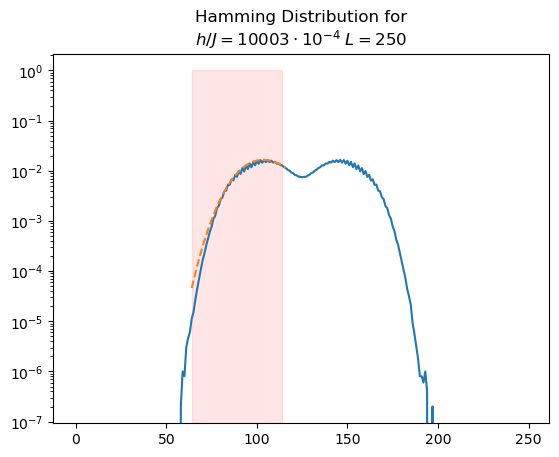

[28, 49, 59]
INSIDE
0 0.7392437748904291 0.0067948573074660765 interval=[ 56 , 116 ]
1 3.33753763322919 0.0067948573074660765 interval=[ 56 , 116 ]
2 7.290440796348441 0.0067948573074660765 interval=[ 56 , 116 ]
3 11.236588481675803 0.0067948573074660765 interval=[ 56 , 116 ]
4 15.08162505507976 0.0067948573074660765 interval=[ 56 , 116 ]
5 18.553383711693346 0.0067948573074660765 interval=[ 56 , 116 ]
6 20.261749207970862 0.0067948573074660765 interval=[ 56 , 116 ]
7 20.348515524883105 0.0067948573074660765 interval=[ 56 , 116 ]
8 18.38766558663322 0.0067948573074660765 interval=[ 56 , 116 ]
9 12.215307679173668 0.0067948573074660765 interval=[ 56 , 116 ]
10 4.12180754679087 0.0067948573074660765 interval=[ 56 , 116 ]
15 11.871646912053887 0.0067948573074660765 interval=[ 56 , 116 ]
16 nan 0.0067948573074660765 interval=[ 56 , 116 ]
17 88.31884786531178 0.0067948573074660765 interval=[ 56 , 116 ]
18 141.45399875104548 0.0067948573074660765 interval=[ 56 , 116 ]
19 151.7425965686719 0.

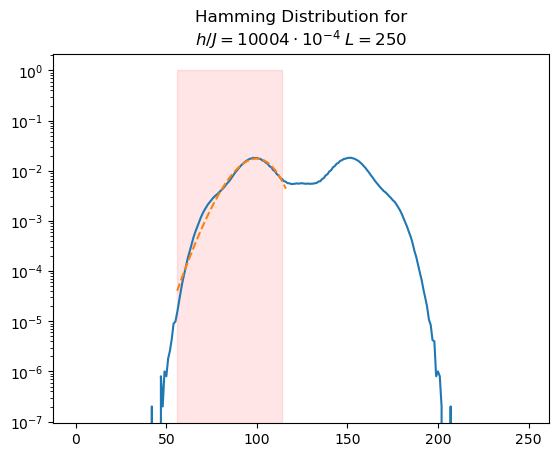

[24, 39, 59]
INSIDE
0 92.18829787876551 0.014885530384788844 interval=[ 48 , 116 ]
1 105.4392111223816 0.014885530384788844 interval=[ 48 , 116 ]
2 119.64153265200034 0.014885530384788844 interval=[ 48 , 116 ]
3 134.21061681911618 0.014885530384788844 interval=[ 48 , 116 ]
4 148.08614009587959 0.014885530384788844 interval=[ 48 , 116 ]
5 159.7099504309298 0.014885530384788844 interval=[ 48 , 116 ]
6 166.382654755449 0.014885530384788844 interval=[ 48 , 116 ]
7 168.57454481864485 0.014885530384788844 interval=[ 48 , 116 ]
8 163.3210830398941 0.014885530384788844 interval=[ 48 , 116 ]
9 150.96049300240287 0.014885530384788844 interval=[ 48 , 116 ]
10 134.31420189855027 0.014885530384788844 interval=[ 48 , 116 ]
11 114.31149359513607 0.014885530384788844 interval=[ 48 , 116 ]
12 93.94684123800079 0.014885530384788844 interval=[ 48 , 116 ]
13 70.88350671108759 0.014885530384788844 interval=[ 48 , 116 ]
14 46.34038019774686 0.014885530384788844 interval=[ 48 , 116 ]
15 20.761093942753998 0.

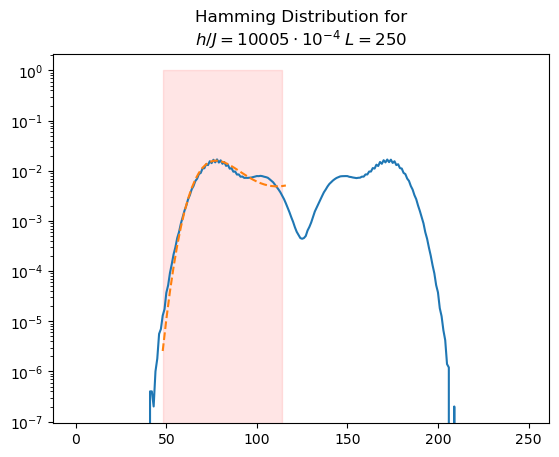

[20, 38, 59]
INSIDE
0 nan 0.006768728641547809 interval=[ 40 , 116 ]
1 nan 0.006768728641547809 interval=[ 40 , 116 ]
2 nan 0.006768728641547809 interval=[ 40 , 116 ]
3 nan 0.006768728641547809 interval=[ 40 , 116 ]
4 nan 0.006768728641547809 interval=[ 40 , 116 ]
5 nan 0.006768728641547809 interval=[ 40 , 116 ]
6 nan 0.006768728641547809 interval=[ 40 , 116 ]
7 nan 0.006768728641547809 interval=[ 40 , 116 ]
8 nan 0.006768728641547809 interval=[ 40 , 116 ]
9 nan 0.006768728641547809 interval=[ 40 , 116 ]
10 nan 0.006768728641547809 interval=[ 40 , 116 ]
11 nan 0.006768728641547809 interval=[ 40 , 116 ]
12 nan 0.006768728641547809 interval=[ 40 , 116 ]
14 6.553480095861997 0.006768728641547809 interval=[ 40 , 116 ]
15 1.4994846481858564 0.006768728641547809 interval=[ 40 , 116 ]
16 0.920089504611135 0.006768728641547809 interval=[ 40 , 116 ]
17 0.9811370368384674 0.006768728641547809 interval=[ 40 , 116 ]
18 1.0338776313813 0.006768728641547809 interval=[ 40 , 116 ]
19 1.093831010840759

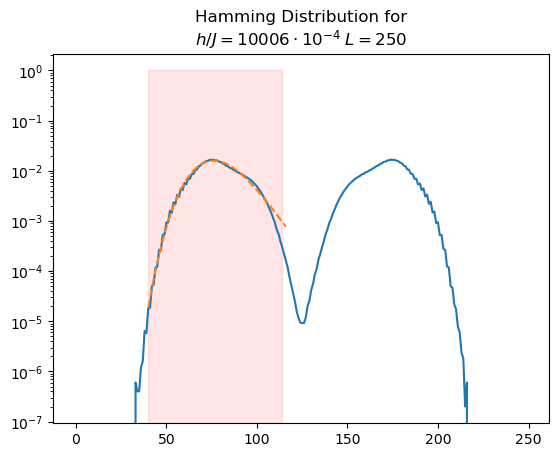

[19, 37, 59]
INSIDE
0 14.740110321165467 0.012393400969462742 interval=[ 38 , 116 ]
1 16.381723338498485 0.012393400969462742 interval=[ 38 , 116 ]
2 19.48051654379182 0.012393400969462742 interval=[ 38 , 116 ]
3 nan 0.012393400969462742 interval=[ 38 , 116 ]
4 nan 0.012393400969462742 interval=[ 38 , 116 ]
5 nan 0.012393400969462742 interval=[ 38 , 116 ]
6 nan 0.012393400969462742 interval=[ 38 , 116 ]
7 nan 0.012393400969462742 interval=[ 38 , 116 ]
8 nan 0.012393400969462742 interval=[ 38 , 116 ]
9 nan 0.012393400969462742 interval=[ 38 , 116 ]
10 19.440981184009942 0.012393400969462742 interval=[ 38 , 116 ]
11 101.12044246679112 0.012393400969462742 interval=[ 38 , 116 ]
12 24.685781836435865 0.012393400969462742 interval=[ 38 , 116 ]
13 2.6087498222806684 0.012393400969462742 interval=[ 38 , 116 ]
14 nan 0.012393400969462742 interval=[ 38 , 116 ]
15 nan 0.012393400969462742 interval=[ 38 , 116 ]
16 4.027825378314859 0.012393400969462742 interval=[ 38 , 116 ]
17 0.9704767047647997 

/tmp/ipykernel_2661/841889229.py:16: RuntimeWarning: overflow encountered in multiply
  return prob*k


67 1.3172306491133232 0.012393400969462742 interval=[ 38 , 116 ]
68 65.26560128195612 0.012393400969462742 interval=[ 38 , 116 ]
69 92.0492136275719 0.012393400969462742 interval=[ 38 , 116 ]
70 115.39513481080756 0.012393400969462742 interval=[ 38 , 116 ]
71 nan 0.012393400969462742 interval=[ 38 , 116 ]
72 4.209979756441028 0.012393400969462742 interval=[ 38 , 116 ]


/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar power
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))
/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: divide by zero encountered in scalar divide
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


74 4.672074536387123 0.012393400969462742 interval=[ 38 , 116 ]
75 3.6057482633542994 0.012393400969462742 interval=[ 38 , 116 ]
76 2.5970865280265603 0.012393400969462742 interval=[ 38 , 116 ]
final parameters:
[(array([ 2.30430207e-01,  1.10390972e+00, -3.00814990e-05,  6.99757362e+01]), array([[ 1.75217779e-05, -5.53931353e-05,  5.73867952e-08,
         4.00850177e-03],
       [-5.53931353e-05,  3.42658699e-02, -2.13088481e-04,
        -1.31556729e+00],
       [ 5.73867952e-08, -2.13088481e-04,  1.33933703e-06,
         8.09079558e-03],
       [ 4.00850177e-03, -1.31556729e+00,  8.09079558e-03,
         5.11507999e+01]])), 0.012393400969462742, [0, 39]]
[0, 39]
0 39
[ 38  40  42  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72
  74  76  78  80  82  84  86  88  90  92  94  96  98 100 102 104 106 108
 110 112 114]
0.012393400969462742
(array([ 2.30430207e-01,  1.10390972e+00, -3.00814990e-05,  6.99757362e+01]), array([[ 1.75217779e-05, -5.53931353e-05,  5.73867952e-08,
    

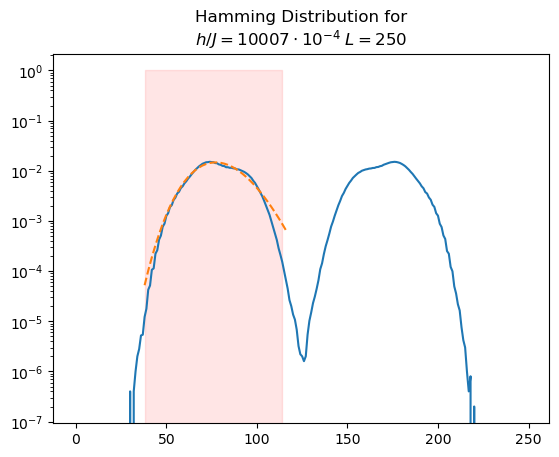

[13, 30, 55]
INSIDE
0 9.788461052369525 0.03787542494093273 interval=[ 26 , 108 ]
1 11.080351683529358 0.03787542494093273 interval=[ 26 , 108 ]
2 13.103959615960608 0.03787542494093273 interval=[ 26 , 108 ]
3 16.540433895354457 0.03787542494093273 interval=[ 26 , 108 ]
4 24.735886695230988 0.03787542494093273 interval=[ 26 , 108 ]
5 nan 0.03787542494093273 interval=[ 26 , 108 ]
6 72.31757714025251 0.03787542494093273 interval=[ 26 , 108 ]
7 70.74766197378855 0.03787542494093273 interval=[ 26 , 108 ]
8 70.00512112109449 0.03787542494093273 interval=[ 26 , 108 ]
9 70.23240072810165 0.03787542494093273 interval=[ 26 , 108 ]
10 71.36128660226716 0.03787542494093273 interval=[ 26 , 108 ]
11 72.42219391524125 0.03787542494093273 interval=[ 26 , 108 ]
12 71.92783332258026 0.03787542494093273 interval=[ 26 , 108 ]
13 69.21505358230364 0.03787542494093273 interval=[ 26 , 108 ]
14 65.978871521156 0.03787542494093273 interval=[ 26 , 108 ]
15 63.877309257725855 0.03787542494093273 interval=[ 26 ,

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar divide
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


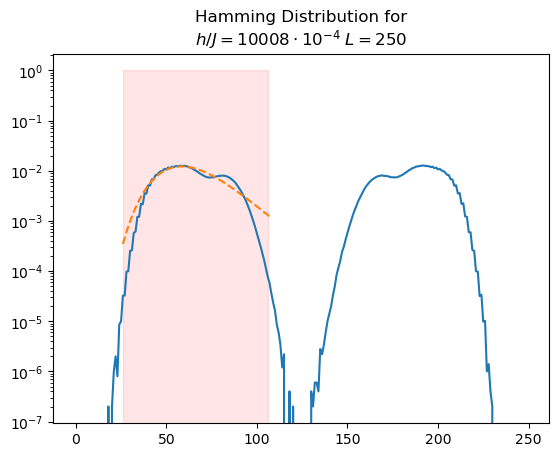

[12, 37, 59]
INSIDE
0 nan 0.5612815875459646 interval=[ 24 , 116 ]
1 nan 0.5612815875459646 interval=[ 24 , 116 ]
2 nan 0.5612815875459646 interval=[ 24 , 116 ]
3 nan 0.5612815875459646 interval=[ 24 , 116 ]
4 nan 0.5612815875459646 interval=[ 24 , 116 ]
5 nan 0.5612815875459646 interval=[ 24 , 116 ]
6 nan 0.5612815875459646 interval=[ 24 , 116 ]
7 nan 0.5612815875459646 interval=[ 24 , 116 ]
8 nan 0.5612815875459646 interval=[ 24 , 116 ]
9 4.045674199073572 0.5612815875459646 interval=[ 24 , 116 ]
10 9.283703396077714 0.5612815875459646 interval=[ 24 , 116 ]
11 10.277145105030119 0.5612815875459646 interval=[ 24 , 116 ]
12 2.056113441334457 0.5612815875459646 interval=[ 24 , 116 ]
13 nan 0.5612815875459646 interval=[ 24 , 116 ]
14 nan 0.5612815875459646 interval=[ 24 , 116 ]
15 12.786098576143816 0.5612815875459646 interval=[ 24 , 116 ]
20 17.67847365988063 0.5612815875459646 interval=[ 24 , 116 ]
21 16.114728395004118 0.5612815875459646 interval=[ 24 , 116 ]
22 9.907842782511969 0.56

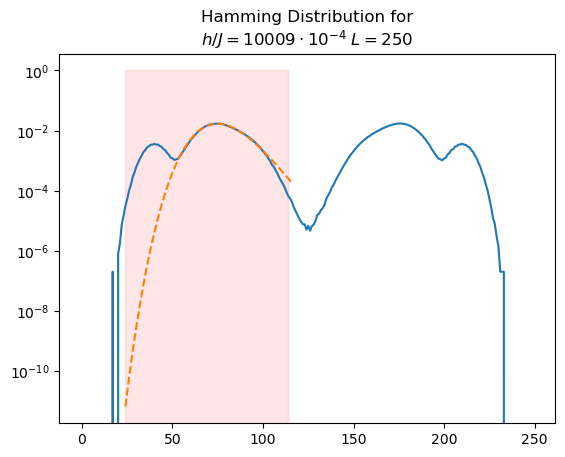

[11, 34, 58]
INSIDE
0 7.160134887648292 0.14100717600642154 interval=[ 22 , 114 ]
1 7.160288855792728 0.14100717600642154 interval=[ 22 , 114 ]
2 7.1590814603030735 0.14100717600642154 interval=[ 22 , 114 ]
3 7.15755867233257 0.14100717600642154 interval=[ 22 , 114 ]
4 7.156390061461542 0.14100717600642154 interval=[ 22 , 114 ]
5 7.153391509998496 0.14100717600642154 interval=[ 22 , 114 ]
6 7.148203854251107 0.14100717600642154 interval=[ 22 , 114 ]
7 7.142726163899374 0.14100717600642154 interval=[ 22 , 114 ]
8 7.134325640666157 0.14100717600642154 interval=[ 22 , 114 ]
9 7.127209798949637 0.14100717600642154 interval=[ 22 , 114 ]
10 7.127473739015671 0.14100717600642154 interval=[ 22 , 114 ]
11 7.14787285537772 0.14100717600642154 interval=[ 22 , 114 ]
19 0.8473408285744151 0.14100717600642154 interval=[ 22 , 114 ]
20 6.39995781015569 0.14100717600642154 interval=[ 22 , 114 ]
21 3.9867692601261435 0.14100717600642154 interval=[ 22 , 114 ]
29 inf 0.14100717600642154 interval=[ 22 , 11

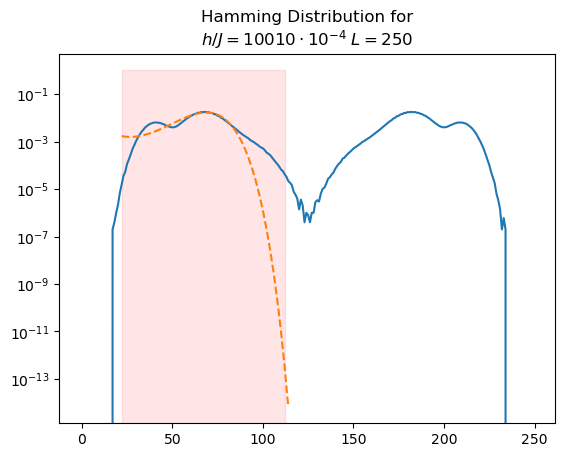

[5, 31, 50]
INSIDE
0 1.7139898555111917 0.06371732645126595 interval=[ 10 , 98 ]
1 1.7143485420765678 0.06371732645126595 interval=[ 10 , 98 ]
2 1.715416224400978 0.06371732645126595 interval=[ 10 , 98 ]
3 1.7179190037535865 0.06371732645126595 interval=[ 10 , 98 ]
4 1.7224523931716726 0.06371732645126595 interval=[ 10 , 98 ]
5 1.7318562033620837 0.06371732645126595 interval=[ 10 , 98 ]
6 1.750039955249864 0.06371732645126595 interval=[ 10 , 98 ]
7 1.7795915230570913 0.06371732645126595 interval=[ 10 , 98 ]
8 1.821971676801373 0.06371732645126595 interval=[ 10 , 98 ]
9 1.8745863022128932 0.06371732645126595 interval=[ 10 , 98 ]
10 1.9172418499799515 0.06371732645126595 interval=[ 10 , 98 ]
11 1.9338754737249475 0.06371732645126595 interval=[ 10 , 98 ]
12 1.8852443772775098 0.06371732645126595 interval=[ 10 , 98 ]
13 1.7401005445568978 0.06371732645126595 interval=[ 10 , 98 ]
14 1.476690175972083 0.06371732645126595 interval=[ 10 , 98 ]
15 1.1155643015354004 0.06371732645126595 interval

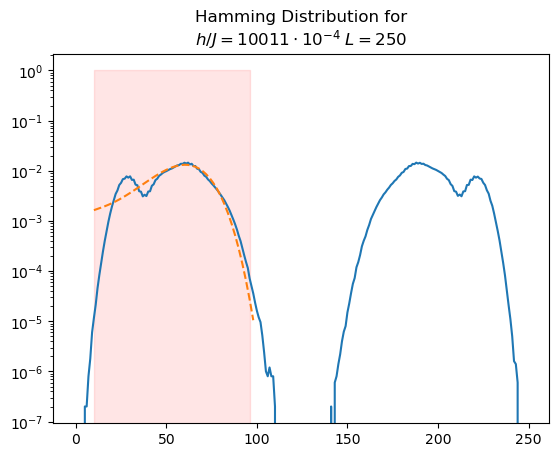

[14, 26, 50]
INSIDE
0 64.50918246154558 0.03830868160330465 interval=[ 28 , 98 ]
1 69.04270760007051 0.03830868160330465 interval=[ 28 , 98 ]
2 74.19407249796582 0.03830868160330465 interval=[ 28 , 98 ]
3 80.09252270040791 0.03830868160330465 interval=[ 28 , 98 ]
4 86.86661472349626 0.03830868160330465 interval=[ 28 , 98 ]
5 94.60948325601298 0.03830868160330465 interval=[ 28 , 98 ]
6 103.30790440355787 0.03830868160330465 interval=[ 28 , 98 ]
7 112.92710995642976 0.03830868160330465 interval=[ 28 , 98 ]
8 123.03026838151789 0.03830868160330465 interval=[ 28 , 98 ]
9 133.11617985160584 0.03830868160330465 interval=[ 28 , 98 ]
10 142.34221425988468 0.03830868160330465 interval=[ 28 , 98 ]
11 149.1592723224583 0.03830868160330465 interval=[ 28 , 98 ]
12 153.15698487902384 0.03830868160330465 interval=[ 28 , 98 ]
14 40.785346712180555 0.03830868160330465 interval=[ 28 , 98 ]
15 82.40262597449889 0.03830868160330465 interval=[ 28 , 98 ]
16 120.40136760509363 0.03830868160330465 interval=[ 

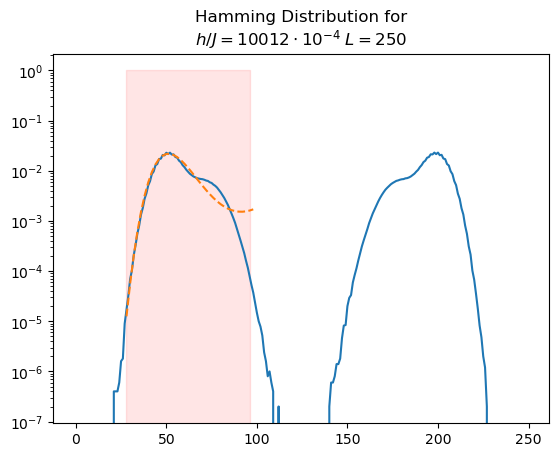

[4, 16, 42]
INSIDE
0 61.36844223061274 0.051949236685709325 interval=[ 8 , 82 ]
1 61.38482486973587 0.051949236685709325 interval=[ 8 , 82 ]
2 61.41030233457876 0.051949236685709325 interval=[ 8 , 82 ]
3 61.465542619939924 0.051949236685709325 interval=[ 8 , 82 ]
4 61.51253577761227 0.051949236685709325 interval=[ 8 , 82 ]
5 61.5370030952116 0.051949236685709325 interval=[ 8 , 82 ]
6 61.24293959155265 0.051949236685709325 interval=[ 8 , 82 ]
7 60.01681351129142 0.051949236685709325 interval=[ 8 , 82 ]
8 57.21075656534702 0.051949236685709325 interval=[ 8 , 82 ]
9 nan 0.051949236685709325 interval=[ 8 , 82 ]
10 nan 0.051949236685709325 interval=[ 8 , 82 ]
11 2.0397032900301797 0.051949236685709325 interval=[ 8 , 82 ]
12 16.79355002352378 0.051949236685709325 interval=[ 8 , 82 ]
13 20.918740370685697 0.051949236685709325 interval=[ 8 , 82 ]
14 5.927645206045222 0.051949236685709325 interval=[ 8 , 82 ]
15 nan 0.051949236685709325 interval=[ 8 , 82 ]
22 0.9751010783774322 0.051949236685709

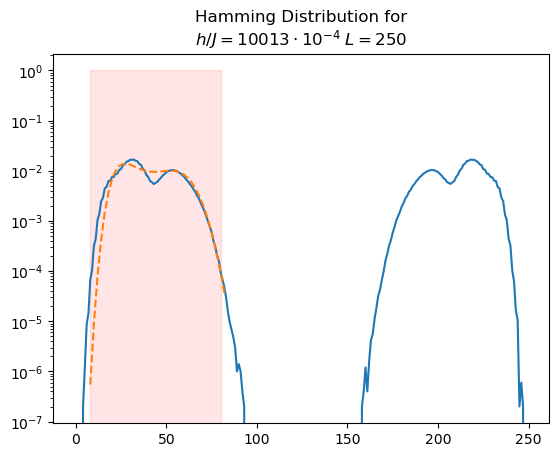

[1, 25, 47]
INSIDE
0 3.0784528981729697 0.17699776594676658 interval=[ 2 , 92 ]
1 3.078690356567801 0.17699776594676658 interval=[ 2 , 92 ]
2 3.0790328070678465 0.17699776594676658 interval=[ 2 , 92 ]
3 3.0795275213236026 0.17699776594676658 interval=[ 2 , 92 ]
4 3.079790032843454 0.17699776594676658 interval=[ 2 , 92 ]
5 3.079558024267036 0.17699776594676658 interval=[ 2 , 92 ]
6 3.078656048100586 0.17699776594676658 interval=[ 2 , 92 ]
7 3.077945217574336 0.17699776594676658 interval=[ 2 , 92 ]
8 3.081774316024828 0.17699776594676658 interval=[ 2 , 92 ]
9 3.1006012075738862 0.17699776594676658 interval=[ 2 , 92 ]
10 3.148019334899021 0.17699776594676658 interval=[ 2 , 92 ]
13 3.4434907156862735 0.17699776594676658 interval=[ 2 , 92 ]
17 0.8421685205882843 0.17699776594676658 interval=[ 2 , 92 ]
18 2.8797131426250413 0.17699776594676658 interval=[ 2 , 92 ]
19 2.5303230599831448 0.17699776594676658 interval=[ 2 , 92 ]
20 2.241125118567246 0.17699776594676658 interval=[ 2 , 92 ]
21 2.12

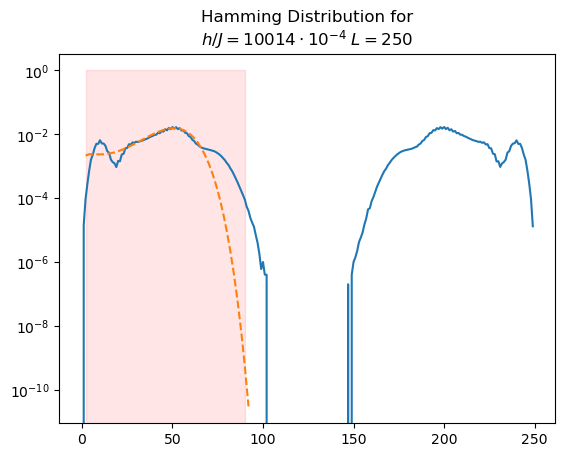

[8, 19, 37]
INSIDE
0 nan 0.005472037745582509 interval=[ 16 , 72 ]
1 nan 0.005472037745582509 interval=[ 16 , 72 ]
2 nan 0.005472037745582509 interval=[ 16 , 72 ]
3 nan 0.005472037745582509 interval=[ 16 , 72 ]
4 nan 0.005472037745582509 interval=[ 16 , 72 ]
5 nan 0.005472037745582509 interval=[ 16 , 72 ]
6 nan 0.005472037745582509 interval=[ 16 , 72 ]
7 nan 0.005472037745582509 interval=[ 16 , 72 ]
8 nan 0.005472037745582509 interval=[ 16 , 72 ]
9 57.81463782092647 0.005472037745582509 interval=[ 16 , 72 ]
10 61.2637854699009 0.005472037745582509 interval=[ 16 , 72 ]
11 62.3159044999706 0.005472037745582509 interval=[ 16 , 72 ]
12 62.89129059933287 0.005472037745582509 interval=[ 16 , 72 ]
13 65.39838705509742 0.005472037745582509 interval=[ 16 , 72 ]
14 nan 0.005472037745582509 interval=[ 16 , 72 ]
15 7.732368730668697 0.005472037745582509 interval=[ 16 , 72 ]
16 75.31016615116192 0.005472037745582509 interval=[ 16 , 72 ]
17 42.00069743697378 0.005472037745582509 interval=[ 16 , 72 ]

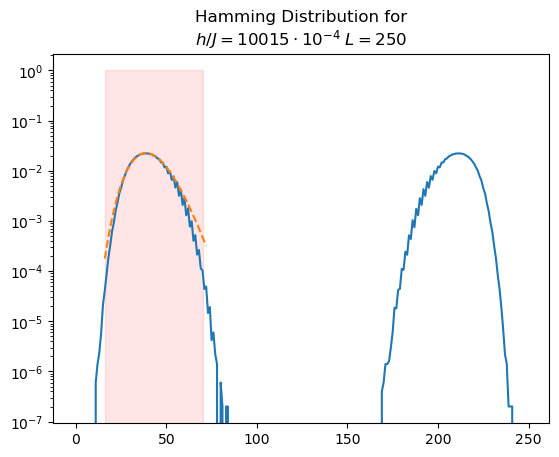

[6, 15, 33]
INSIDE
0 1.9529889939196658 0.027570180583796653 interval=[ 12 , 64 ]
1 2.043165586061927 0.027570180583796653 interval=[ 12 , 64 ]
2 2.243284623963253 0.027570180583796653 interval=[ 12 , 64 ]
3 2.6873506386076365 0.027570180583796653 interval=[ 12 , 64 ]
4 3.6778985289500468 0.027570180583796653 interval=[ 12 , 64 ]
5 6.1038057637689445 0.027570180583796653 interval=[ 12 , 64 ]
6 98.81555422368659 0.027570180583796653 interval=[ 12 , 64 ]
7 95.14339853139796 0.027570180583796653 interval=[ 12 , 64 ]
8 nan 0.027570180583796653 interval=[ 12 , 64 ]
9 82.16867188922433 0.027570180583796653 interval=[ 12 , 64 ]
10 75.2541656411458 0.027570180583796653 interval=[ 12 , 64 ]
11 78.34626737982042 0.027570180583796653 interval=[ 12 , 64 ]
12 89.7566031345119 0.027570180583796653 interval=[ 12 , 64 ]
13 103.5868295363698 0.027570180583796653 interval=[ 12 , 64 ]
14 103.36048818223153 0.027570180583796653 interval=[ 12 , 64 ]
15 136.60869707485935 0.027570180583796653 interval=[ 12 

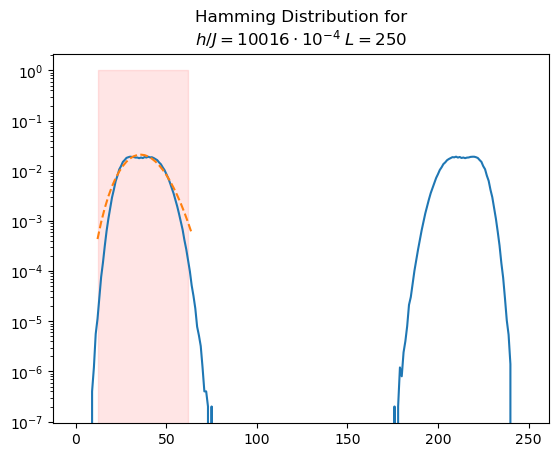

[3, 10, 43]
INSIDE
0 nan 0.04762339136104273 interval=[ 6 , 84 ]
1 nan 0.04762339136104273 interval=[ 6 , 84 ]
2 nan 0.04762339136104273 interval=[ 6 , 84 ]
3 nan 0.04762339136104273 interval=[ 6 , 84 ]
4 nan 0.04762339136104273 interval=[ 6 , 84 ]
5 nan 0.04762339136104273 interval=[ 6 , 84 ]
6 nan 0.04762339136104273 interval=[ 6 , 84 ]
7 7.416654211802541 0.04762339136104273 interval=[ 6 , 84 ]
8 nan 0.04762339136104273 interval=[ 6 , 84 ]
9 nan 0.04762339136104273 interval=[ 6 , 84 ]
10 nan 0.04762339136104273 interval=[ 6 , 84 ]
11 15.738757224182342 0.04762339136104273 interval=[ 6 , 84 ]
12 nan 0.04762339136104273 interval=[ 6 , 84 ]
13 12.537062475599889 0.04762339136104273 interval=[ 6 , 84 ]
14 nan 0.04762339136104273 interval=[ 6 , 84 ]
15 22.055254188942186 0.04762339136104273 interval=[ 6 , 84 ]
16 2.700610058708916 0.04762339136104273 interval=[ 6 , 84 ]
17 2.0664297772208817 0.04762339136104273 interval=[ 6 , 84 ]
18 222.1575511142317 0.04762339136104273 interval=[ 6 , 8

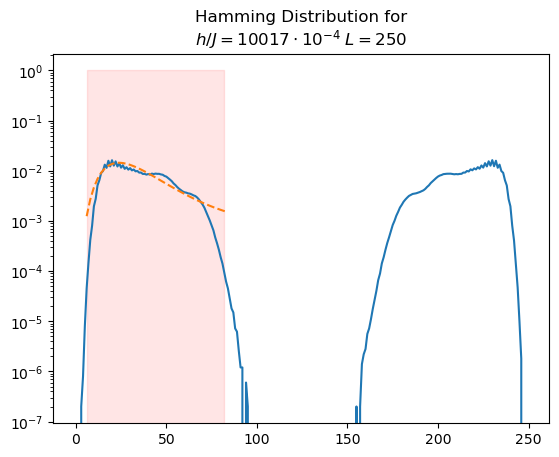

[4, 13, 34]
INSIDE
0 nan 0.011113476975997164 interval=[ 8 , 66 ]
1 nan 0.011113476975997164 interval=[ 8 , 66 ]
2 nan 0.011113476975997164 interval=[ 8 , 66 ]
3 nan 0.011113476975997164 interval=[ 8 , 66 ]
4 nan 0.011113476975997164 interval=[ 8 , 66 ]
5 nan 0.011113476975997164 interval=[ 8 , 66 ]
6 nan 0.011113476975997164 interval=[ 8 , 66 ]
7 nan 0.011113476975997164 interval=[ 8 , 66 ]
8 nan 0.011113476975997164 interval=[ 8 , 66 ]
9 10.624176062336312 0.011113476975997164 interval=[ 8 , 66 ]
10 nan 0.011113476975997164 interval=[ 8 , 66 ]
11 nan 0.011113476975997164 interval=[ 8 , 66 ]
12 72.21167549110189 0.011113476975997164 interval=[ 8 , 66 ]
13 84.45813556891362 0.011113476975997164 interval=[ 8 , 66 ]
14 nan 0.011113476975997164 interval=[ 8 , 66 ]
15 93.64355873515085 0.011113476975997164 interval=[ 8 , 66 ]
16 nan 0.011113476975997164 interval=[ 8 , 66 ]
17 82.9056688393299 0.011113476975997164 interval=[ 8 , 66 ]
18 nan 0.011113476975997164 interval=[ 8 , 66 ]
19 44.012

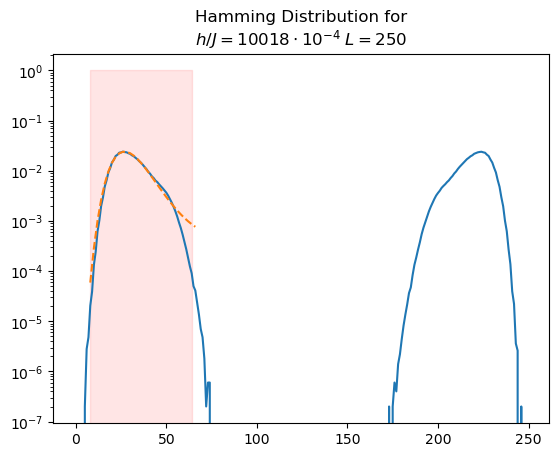

[3, 10, 32]
INSIDE
0 0.7821012021326598 0.10352053354334947 interval=[ 6 , 62 ]
1 0.866470820514629 0.10352053354334947 interval=[ 6 , 62 ]
2 104.85055089800817 0.10352053354334947 interval=[ 6 , 62 ]
3 1.5100209272682321 0.10352053354334947 interval=[ 6 , 62 ]
4 105.25184142883238 0.10352053354334947 interval=[ 6 , 62 ]
5 106.0433149416796 0.10352053354334947 interval=[ 6 , 62 ]
6 107.91977292347516 0.10352053354334947 interval=[ 6 , 62 ]
7 111.32358146764486 0.10352053354334947 interval=[ 6 , 62 ]
8 116.19263150775899 0.10352053354334947 interval=[ 6 , 62 ]
9 122.63515008303624 0.10352053354334947 interval=[ 6 , 62 ]
10 130.61280580570548 0.10352053354334947 interval=[ 6 , 62 ]
11 138.74639427290418 0.10352053354334947 interval=[ 6 , 62 ]
12 144.2495043530956 0.10352053354334947 interval=[ 6 , 62 ]
13 1.8138899878242951 0.10352053354334947 interval=[ 6 , 62 ]
14 141.30773300609002 0.10352053354334947 interval=[ 6 , 62 ]
15 130.31302514410183 0.10352053354334947 interval=[ 6 , 62 ]
16

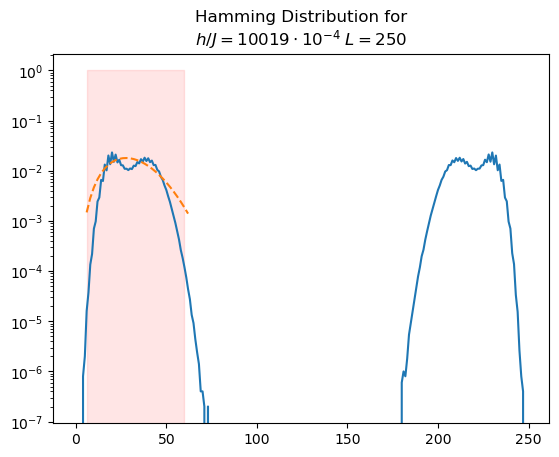

[1, 16, 27]
INSIDE
0 0.7617302553118414 0.02395137870835856 interval=[ 3 , 53 ]
1 0.7628732927948271 0.02395137870835856 interval=[ 3 , 53 ]
2 0.7648057645219813 0.02395137870835856 interval=[ 3 , 53 ]
3 0.7664461675269901 0.02395137870835856 interval=[ 3 , 53 ]
4 0.7605056383909437 0.02395137870835856 interval=[ 3 , 53 ]
5 0.7341554566903993 0.02395137870835856 interval=[ 3 , 53 ]
6 0.6796874002010536 0.02395137870835856 interval=[ 3 , 53 ]
7 0.5248826134444129 0.02395137870835856 interval=[ 3 , 53 ]
8 0.5749041529016925 0.02395137870835856 interval=[ 3 , 53 ]
12 0.7016821953238587 0.02395137870835856 interval=[ 3 , 53 ]
13 1.9400255067734553 0.02395137870835856 interval=[ 3 , 53 ]
14 0.7914922795854834 0.02395137870835856 interval=[ 3 , 53 ]
15 0.8312985626618907 0.02395137870835856 interval=[ 3 , 53 ]
16 1.475259615170755 0.02395137870835856 interval=[ 3 , 53 ]
17 2.388604303549279 0.02395137870835856 interval=[ 3 , 53 ]
18 3.2383124629881967 0.02395137870835856 interval=[ 3 , 53 ]


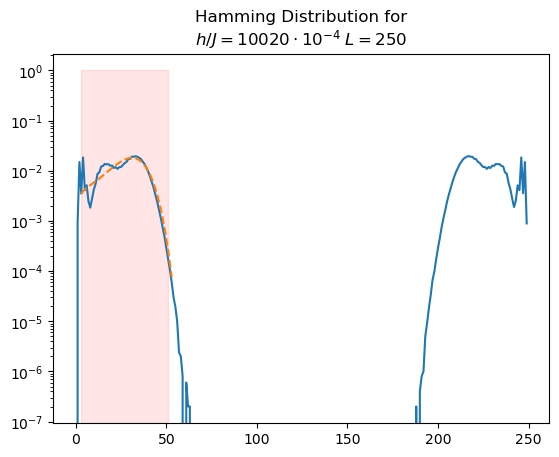

[57, 74, 73]
final parameters:
[(array([ 1.32359746e+00,  7.49825771e-01, -2.79914308e-03,  2.49448279e+02]), array([[ 2.54078339e-04, -5.11825290e-03,  1.95036588e-05,
         3.37362164e-01],
       [-5.11825290e-03,  1.23195718e-01, -4.65682460e-04,
        -8.18121357e+00],
       [ 1.95036588e-05, -4.65682460e-04,  1.76096482e-06,
         3.09139694e-02],
       [ 3.37362164e-01, -8.18121357e+00,  3.09139694e-02,
         5.43486649e+02]])), 1.515541700131509e-05, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.515541700131509e-05
(array([ 1.32359746e+00,  7.49825771e-01, -2.79914308e-03,  2.49448279e+02]), array([[ 2.54078339e-04, -5.11825290e-03,  1.95036588e-05,
         3.37362164e-01],
       [-5.11825290e-03,  1.23195718e-01, -4.65682460e-04,
        -8.18121357e+00],
       [ 1.95036588e-05, -4.65682460e-04,  1.76096482e-06,
         3.09139694e-02],
       [ 3.37362164e-01, -8.18121357e+00,  3.09139694e-02,
         5.43486649e+02]])

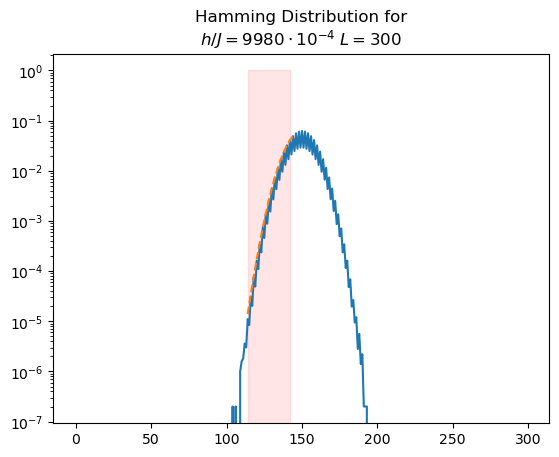

[57, 74, 73]
final parameters:
[(array([ 1.10292686e+00,  7.07075990e-01, -2.73199276e-03,  2.53704673e+02]), array([[ 5.90567162e-04, -1.54515543e-02,  5.88084892e-05,
         1.01935067e+00],
       [-1.54515543e-02,  4.87686400e-01, -1.84096412e-03,
        -3.24195686e+01],
       [ 5.88084892e-05, -1.84096412e-03,  6.95207569e-06,
         1.22336518e-01],
       [ 1.01935067e+00, -3.24195686e+01,  1.22336518e-01,
         2.15586694e+03]])), 1.3984178494964123e-05, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.3984178494964123e-05
(array([ 1.10292686e+00,  7.07075990e-01, -2.73199276e-03,  2.53704673e+02]), array([[ 5.90567162e-04, -1.54515543e-02,  5.88084892e-05,
         1.01935067e+00],
       [-1.54515543e-02,  4.87686400e-01, -1.84096412e-03,
        -3.24195686e+01],
       [ 5.88084892e-05, -1.84096412e-03,  6.95207569e-06,
         1.22336518e-01],
       [ 1.01935067e+00, -3.24195686e+01,  1.22336518e-01,
         2.15586694e+03]

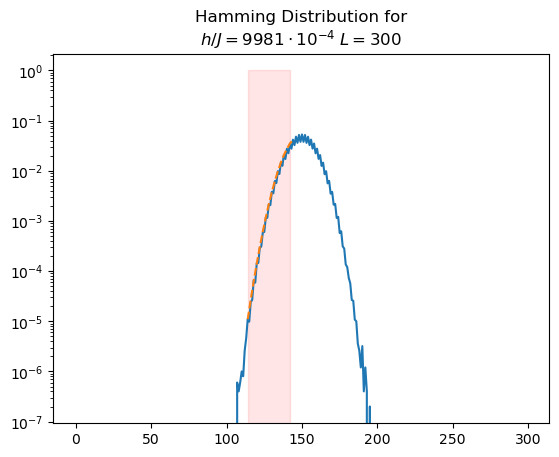

[58, 74, 73]
final parameters:
[(array([ 1.24809667e+00,  3.71223189e-02, -1.19383431e-04,  2.96978547e+02]), array([[ 1.95393035e-04, -3.85148173e-03,  1.46961852e-05,
         2.53630750e-01],
       [-3.85148173e-03,  8.88915745e-02, -3.36656745e-04,
        -5.89446041e+00],
       [ 1.46961852e-05, -3.36656745e-04,  1.27548598e-06,
         2.23161151e-02],
       [ 2.53630750e-01, -5.89446041e+00,  2.23161151e-02,
         3.90995128e+02]])), 2.8237767755469437e-06, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
2.8237767755469437e-06
(array([ 1.24809667e+00,  3.71223189e-02, -1.19383431e-04,  2.96978547e+02]), array([[ 1.95393035e-04, -3.85148173e-03,  1.46961852e-05,
         2.53630750e-01],
       [-3.85148173e-03,  8.88915745e-02, -3.36656745e-04,
        -5.89446041e+00],
       [ 1.46961852e-05, -3.36656745e-04,  1.27548598e-06,
         2.23161151e-02],
       [ 2.53630750e-01, -5.89446041e+00,  2.23161151e-02,
         3.90995128e+02]]))


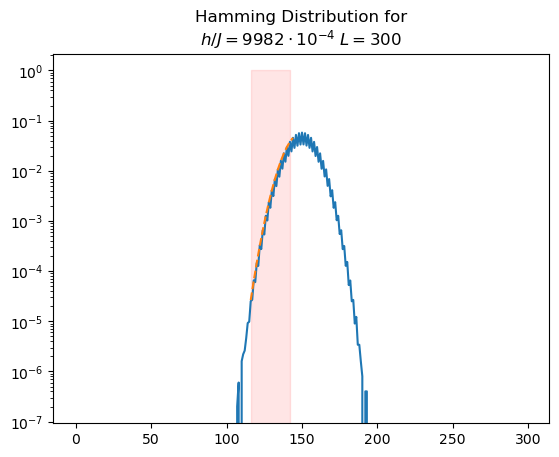

[58, 74, 73]
final parameters:
[(array([ 1.13715194e+00, -6.89500731e-01,  2.67896706e-03,  3.44447022e+02]), array([[ 9.95537539e-04, -1.88621845e-02,  7.21423378e-05,
         1.24009536e+00],
       [-1.88621845e-02,  4.12218508e-01, -1.56533380e-03,
        -2.72811931e+01],
       [ 7.21423378e-05, -1.56533380e-03,  5.94633494e-06,
         1.03559627e-01],
       [ 1.24009536e+00, -2.72811931e+01,  1.03559627e-01,
         1.80610199e+03]])), 1.4199687765870247e-05, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.4199687765870247e-05
(array([ 1.13715194e+00, -6.89500731e-01,  2.67896706e-03,  3.44447022e+02]), array([[ 9.95537539e-04, -1.88621845e-02,  7.21423378e-05,
         1.24009536e+00],
       [-1.88621845e-02,  4.12218508e-01, -1.56533380e-03,
        -2.72811931e+01],
       [ 7.21423378e-05, -1.56533380e-03,  5.94633494e-06,
         1.03559627e-01],
       [ 1.24009536e+00, -2.72811931e+01,  1.03559627e-01,
         1.80610199e+03]]))


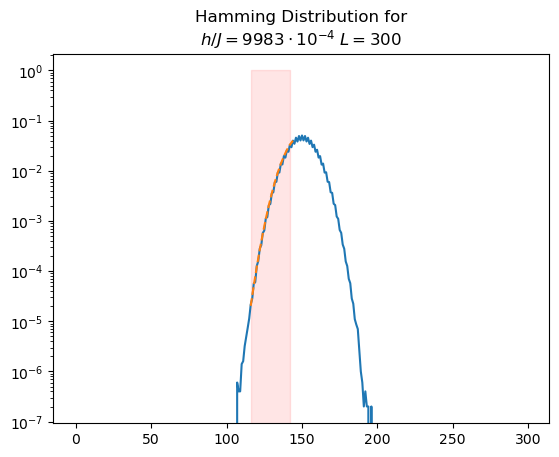

[58, 74, 73]
final parameters:
[(array([ 1.16333392e+00, -9.85412785e-01,  3.76217061e-03,  3.64588973e+02]), array([[ 2.42384055e-04, -4.47698363e-03,  1.71256918e-05,
         2.94304475e-01],
       [-4.47698363e-03,  9.51531231e-02, -3.61415262e-04,
        -6.29609290e+00],
       [ 1.71256918e-05, -3.61415262e-04,  1.37325564e-06,
         2.39058168e-02],
       [ 2.94304475e-01, -6.29609290e+00,  2.39058168e-02,
         4.16735914e+02]])), 2.7839071660516248e-05, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
2.7839071660516248e-05
(array([ 1.16333392e+00, -9.85412785e-01,  3.76217061e-03,  3.64588973e+02]), array([[ 2.42384055e-04, -4.47698363e-03,  1.71256918e-05,
         2.94304475e-01],
       [-4.47698363e-03,  9.51531231e-02, -3.61415262e-04,
        -6.29609290e+00],
       [ 1.71256918e-05, -3.61415262e-04,  1.37325564e-06,
         2.39058168e-02],
       [ 2.94304475e-01, -6.29609290e+00,  2.39058168e-02,
         4.16735914e+02]]))


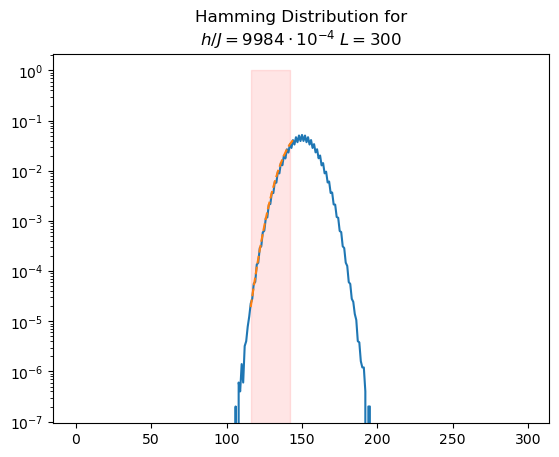

[57, 74, 73]
final parameters:
[(array([ 1.14272463e+00, -1.91719632e-01,  7.72681939e-04,  3.11770929e+02]), array([[ 1.37975033e-04, -2.83306355e-03,  1.08184344e-05,
         1.86467802e-01],
       [-2.83306355e-03,  6.80010401e-02, -2.57723359e-04,
        -4.50696043e+00],
       [ 1.08184344e-05, -2.57723359e-04,  9.77139155e-07,
         1.70752733e-02],
       [ 1.86467802e-01, -4.50696043e+00,  1.70752733e-02,
         2.98811521e+02]])), 9.393103300159221e-06, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
9.393103300159221e-06
(array([ 1.14272463e+00, -1.91719632e-01,  7.72681939e-04,  3.11770929e+02]), array([[ 1.37975033e-04, -2.83306355e-03,  1.08184344e-05,
         1.86467802e-01],
       [-2.83306355e-03,  6.80010401e-02, -2.57723359e-04,
        -4.50696043e+00],
       [ 1.08184344e-05, -2.57723359e-04,  9.77139155e-07,
         1.70752733e-02],
       [ 1.86467802e-01, -4.50696043e+00,  1.70752733e-02,
         2.98811521e+02]])

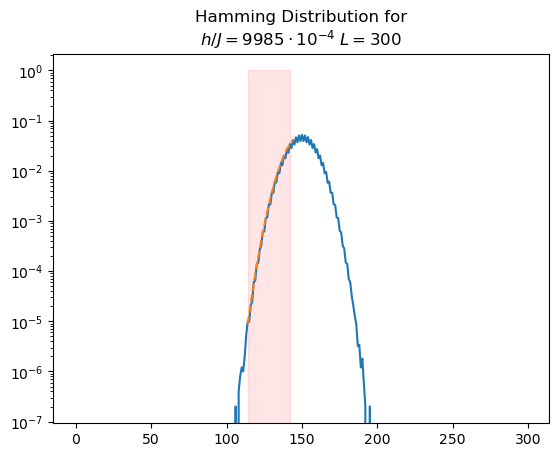

[57, 74, 73]
final parameters:
[(array([ 1.39824388e+00, -4.46951462e-02,  1.62270206e-04,  3.02961370e+02]), array([[ 1.49558867e-04, -2.64147210e-03,  1.00758774e-05,
         1.73999921e-01],
       [-2.64147210e-03,  5.51241466e-02, -2.08626580e-04,
        -3.65763081e+00],
       [ 1.00758774e-05, -2.08626580e-04,  7.89886463e-07,
         1.38379041e-02],
       [ 1.73999921e-01, -3.65763081e+00,  1.38379041e-02,
         2.42776343e+02]])), 1.3558371819547927e-05, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.3558371819547927e-05
(array([ 1.39824388e+00, -4.46951462e-02,  1.62270206e-04,  3.02961370e+02]), array([[ 1.49558867e-04, -2.64147210e-03,  1.00758774e-05,
         1.73999921e-01],
       [-2.64147210e-03,  5.51241466e-02, -2.08626580e-04,
        -3.65763081e+00],
       [ 1.00758774e-05, -2.08626580e-04,  7.89886463e-07,
         1.38379041e-02],
       [ 1.73999921e-01, -3.65763081e+00,  1.38379041e-02,
         2.42776343e+02]

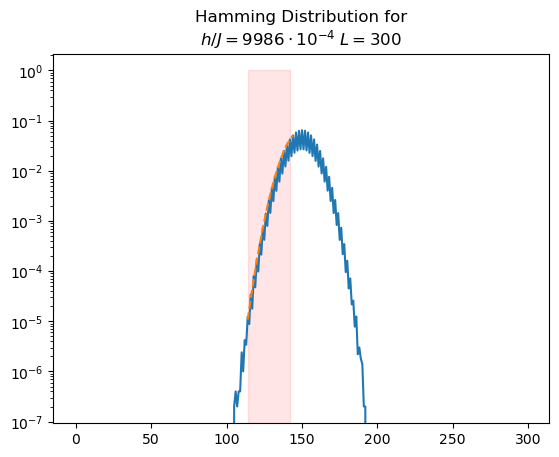

[58, 74, 73]
final parameters:
[(array([ 1.16044623e+00,  4.74004132e-02, -1.77878508e-04,  2.96589142e+02]), array([[ 2.09788792e-04, -4.55124382e-03,  1.73597269e-05,
         2.99790081e-01],
       [-4.55124382e-03,  1.16303942e-01, -4.40231170e-04,
        -7.71548309e+00],
       [ 1.73597269e-05, -4.40231170e-04,  1.66697903e-06,
         2.91941582e-02],
       [ 2.99790081e-01, -7.71548309e+00,  2.91941582e-02,
         5.12008266e+02]])), 7.566304949518743e-06, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
7.566304949518743e-06
(array([ 1.16044623e+00,  4.74004132e-02, -1.77878508e-04,  2.96589142e+02]), array([[ 2.09788792e-04, -4.55124382e-03,  1.73597269e-05,
         2.99790081e-01],
       [-4.55124382e-03,  1.16303942e-01, -4.40231170e-04,
        -7.71548309e+00],
       [ 1.73597269e-05, -4.40231170e-04,  1.66697903e-06,
         2.91941582e-02],
       [ 2.99790081e-01, -7.71548309e+00,  2.91941582e-02,
         5.12008266e+02]]))
[1

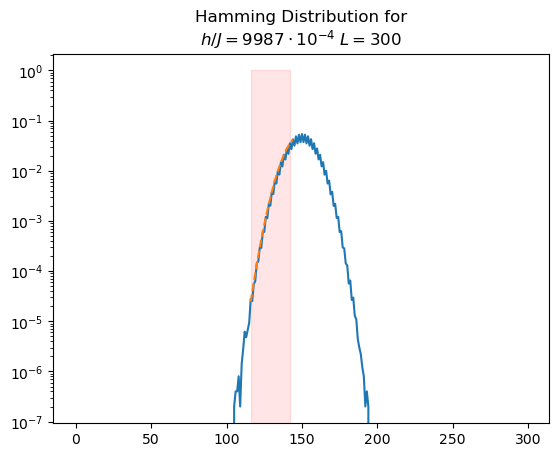

[58, 74, 73]
final parameters:
[(array([ 1.13208412e+00,  4.64409469e-03, -3.89894616e-05,  2.99887900e+02]), array([[ 1.01709712e-04, -2.24140385e-03,  8.54904142e-06,
         1.47654027e-01],
       [-2.24140385e-03,  5.85840378e-02, -2.21659429e-04,
        -3.88810701e+00],
       [ 8.54904142e-06, -2.21659429e-04,  8.39005429e-07,
         1.47056254e-02],
       [ 1.47654027e-01, -3.88810701e+00,  1.47056254e-02,
         2.58136771e+02]])), 4.686289864611787e-06, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
4.686289864611787e-06
(array([ 1.13208412e+00,  4.64409469e-03, -3.89894616e-05,  2.99887900e+02]), array([[ 1.01709712e-04, -2.24140385e-03,  8.54904142e-06,
         1.47654027e-01],
       [-2.24140385e-03,  5.85840378e-02, -2.21659429e-04,
        -3.88810701e+00],
       [ 8.54904142e-06, -2.21659429e-04,  8.39005429e-07,
         1.47056254e-02],
       [ 1.47654027e-01, -3.88810701e+00,  1.47056254e-02,
         2.58136771e+02]]))
[1

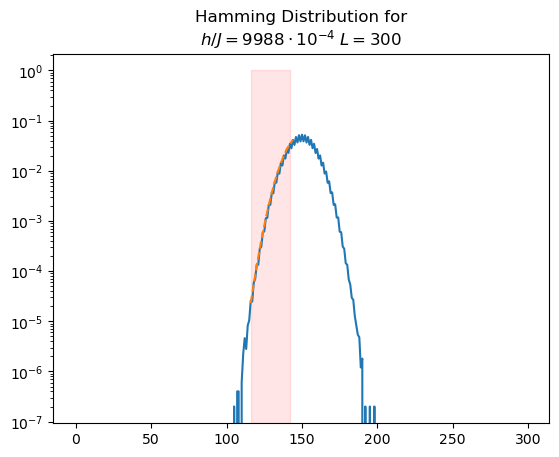

[57, 74, 73]
final parameters:
[(array([ 1.33442598e+00, -1.38654969e+00,  5.44013971e-03,  3.88918279e+02]), array([[ 7.80744897e-04, -1.02024079e-02,  3.91866814e-05,
         6.68794137e-01],
       [-1.02024079e-02,  1.50167285e-01, -5.72990952e-04,
        -9.90333256e+00],
       [ 3.91866814e-05, -5.72990952e-04,  2.18717525e-06,
         3.77748272e-02],
       [ 6.68794137e-01, -9.90333256e+00,  3.77748272e-02,
         6.53323191e+02]])), 3.1554731025654855e-05, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
3.1554731025654855e-05
(array([ 1.33442598e+00, -1.38654969e+00,  5.44013971e-03,  3.88918279e+02]), array([[ 7.80744897e-04, -1.02024079e-02,  3.91866814e-05,
         6.68794137e-01],
       [-1.02024079e-02,  1.50167285e-01, -5.72990952e-04,
        -9.90333256e+00],
       [ 3.91866814e-05, -5.72990952e-04,  2.18717525e-06,
         3.77748272e-02],
       [ 6.68794137e-01, -9.90333256e+00,  3.77748272e-02,
         6.53323191e+02]

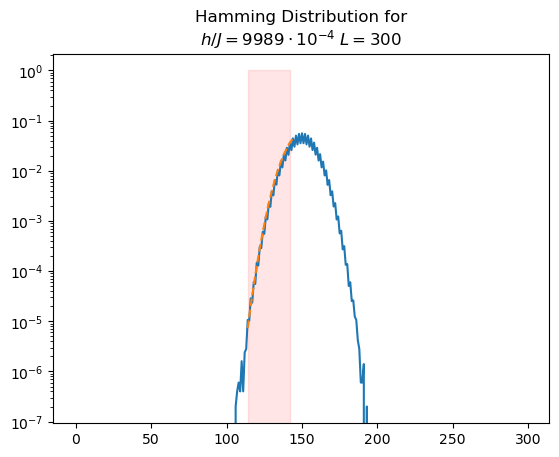

[57, 74, 73]
final parameters:
[(array([ 1.06249675e+00, -5.43772007e-02,  2.11464139e-04,  3.03337744e+02]), array([[ 7.78697296e-05, -1.80368743e-03,  6.88155367e-06,
         1.18791066e-01],
       [-1.80368743e-03,  4.91094379e-02, -1.85940842e-04,
        -3.25728646e+00],
       [ 6.88155367e-06, -1.85940842e-04,  7.04284724e-07,
         1.23285454e-02],
       [ 1.18791066e-01, -3.25728646e+00,  1.23285454e-02,
         2.16118690e+02]])), 1.1965946295247167e-05, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.1965946295247167e-05
(array([ 1.06249675e+00, -5.43772007e-02,  2.11464139e-04,  3.03337744e+02]), array([[ 7.78697296e-05, -1.80368743e-03,  6.88155367e-06,
         1.18791066e-01],
       [-1.80368743e-03,  4.91094379e-02, -1.85940842e-04,
        -3.25728646e+00],
       [ 6.88155367e-06, -1.85940842e-04,  7.04284724e-07,
         1.23285454e-02],
       [ 1.18791066e-01, -3.25728646e+00,  1.23285454e-02,
         2.16118690e+02]

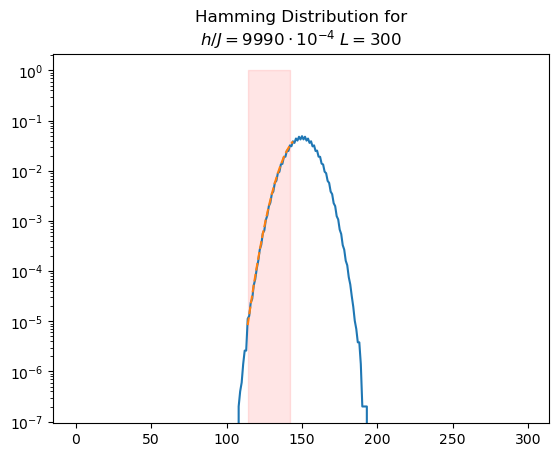

[58, 74, 73]
final parameters:
[(array([ 1.12535380e+00, -6.43393341e-02,  3.11612811e-04,  3.03113638e+02]), array([[ 6.80647149e-04, -1.39791840e-02,  5.33876526e-05,
         9.20043237e-01],
       [-1.39791840e-02,  3.34537376e-01, -1.26817423e-03,
        -2.21691448e+01],
       [ 5.33876526e-05, -1.26817423e-03,  4.80924123e-06,
         8.40097977e-02],
       [ 9.20043237e-01, -2.21691448e+01,  8.40097977e-02,
         1.46959486e+03]])), 1.402754049007634e-05, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.402754049007634e-05
(array([ 1.12535380e+00, -6.43393341e-02,  3.11612811e-04,  3.03113638e+02]), array([[ 6.80647149e-04, -1.39791840e-02,  5.33876526e-05,
         9.20043237e-01],
       [-1.39791840e-02,  3.34537376e-01, -1.26817423e-03,
        -2.21691448e+01],
       [ 5.33876526e-05, -1.26817423e-03,  4.80924123e-06,
         8.40097977e-02],
       [ 9.20043237e-01, -2.21691448e+01,  8.40097977e-02,
         1.46959486e+03]]))
[2

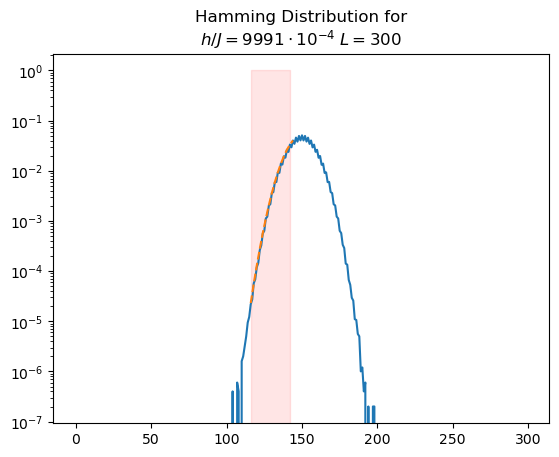

[58, 74, 73]
final parameters:
[(array([ 1.17273944e+00, -1.06470542e+00,  4.15216062e-03,  3.68645879e+02]), array([[ 2.06398974e-04, -3.40139358e-03,  1.30352069e-05,
         2.23323243e-01],
       [-3.40139358e-03,  6.38164970e-02, -2.42894001e-04,
        -4.21639513e+00],
       [ 1.30352069e-05, -2.42894001e-04,  9.24832915e-07,
         1.60425635e-02],
       [ 2.23323243e-01, -4.21639513e+00,  1.60425635e-02,
         2.78670529e+02]])), 2.2888531271941738e-05, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
2.2888531271941738e-05
(array([ 1.17273944e+00, -1.06470542e+00,  4.15216062e-03,  3.68645879e+02]), array([[ 2.06398974e-04, -3.40139358e-03,  1.30352069e-05,
         2.23323243e-01],
       [-3.40139358e-03,  6.38164970e-02, -2.42894001e-04,
        -4.21639513e+00],
       [ 1.30352069e-05, -2.42894001e-04,  9.24832915e-07,
         1.60425635e-02],
       [ 2.23323243e-01, -4.21639513e+00,  1.60425635e-02,
         2.78670529e+02]]))


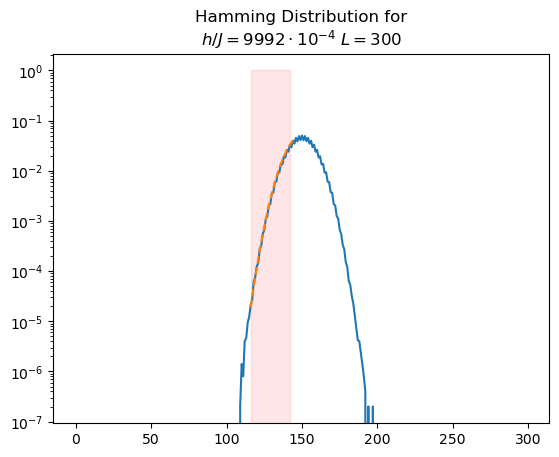

[57, 74, 73]
final parameters:
[(array([ 1.30125467e+00, -5.38270002e-01,  2.06015229e-03,  3.35176534e+02]), array([[ 6.09846746e-04, -1.06641362e-02,  4.07425354e-05,
         7.01671680e-01],
       [-1.06641362e-02,  2.16500162e-01, -8.21108584e-04,
        -1.43417358e+01],
       [ 4.07425354e-05, -8.21108584e-04,  3.11533913e-06,
         5.43740743e-02],
       [ 7.01671680e-01, -1.43417358e+01,  5.43740743e-02,
         9.50360653e+02]])), 1.3466471421568011e-05, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.3466471421568011e-05
(array([ 1.30125467e+00, -5.38270002e-01,  2.06015229e-03,  3.35176534e+02]), array([[ 6.09846746e-04, -1.06641362e-02,  4.07425354e-05,
         7.01671680e-01],
       [-1.06641362e-02,  2.16500162e-01, -8.21108584e-04,
        -1.43417358e+01],
       [ 4.07425354e-05, -8.21108584e-04,  3.11533913e-06,
         5.43740743e-02],
       [ 7.01671680e-01, -1.43417358e+01,  5.43740743e-02,
         9.50360653e+02]

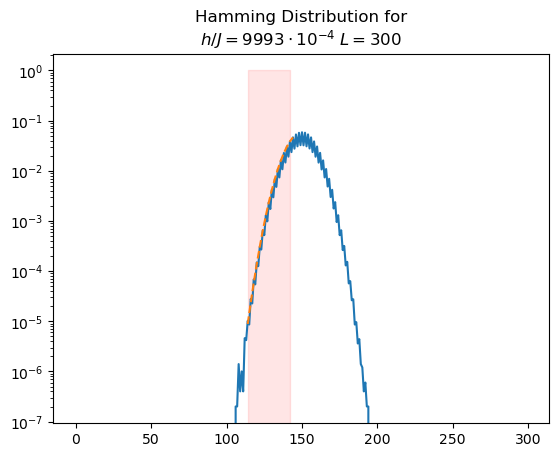

[58, 74, 73]
final parameters:
[(array([ 1.02222062e+00,  5.08804876e-01, -1.94200941e-03,  2.66410577e+02]), array([[ 1.22309357e-04, -3.19832703e-03,  1.21841219e-05,
         2.10872550e-01],
       [-3.19832703e-03,  9.96382411e-02, -3.76575924e-04,
        -6.61790063e+00],
       [ 1.21841219e-05, -3.76575924e-04,  1.42378033e-06,
         2.50029910e-02],
       [ 2.10872550e-01, -6.61790063e+00,  2.50029910e-02,
         4.39704714e+02]])), 1.1430873830161324e-05, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.1430873830161324e-05
(array([ 1.02222062e+00,  5.08804876e-01, -1.94200941e-03,  2.66410577e+02]), array([[ 1.22309357e-04, -3.19832703e-03,  1.21841219e-05,
         2.10872550e-01],
       [-3.19832703e-03,  9.96382411e-02, -3.76575924e-04,
        -6.61790063e+00],
       [ 1.21841219e-05, -3.76575924e-04,  1.42378033e-06,
         2.50029910e-02],
       [ 2.10872550e-01, -6.61790063e+00,  2.50029910e-02,
         4.39704714e+02]]))


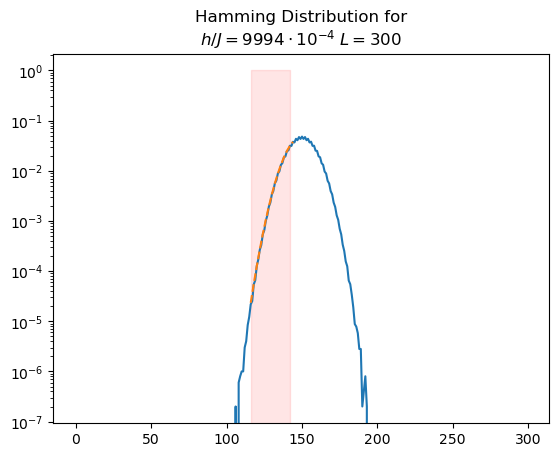

[58, 74, 73]
final parameters:
[(array([ 1.02847593e+00,  7.74709142e-01, -2.96928040e-03,  2.48895592e+02]), array([[ 1.40482690e-04, -3.92866412e-03,  1.49540918e-05,
         2.59151780e-01],
       [-3.92866412e-03,  1.32546585e-01, -5.00397867e-04,
        -8.81043063e+00],
       [ 1.49540918e-05, -5.00397867e-04,  1.88984973e-06,
         3.32497098e-02],
       [ 2.59151780e-01, -8.81043063e+00,  3.32497098e-02,
         5.85833531e+02]])), 1.570726561576251e-05, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.570726561576251e-05
(array([ 1.02847593e+00,  7.74709142e-01, -2.96928040e-03,  2.48895592e+02]), array([[ 1.40482690e-04, -3.92866412e-03,  1.49540918e-05,
         2.59151780e-01],
       [-3.92866412e-03,  1.32546585e-01, -5.00397867e-04,
        -8.81043063e+00],
       [ 1.49540918e-05, -5.00397867e-04,  1.88984973e-06,
         3.32497098e-02],
       [ 2.59151780e-01, -8.81043063e+00,  3.32497098e-02,
         5.85833531e+02]]))
[1

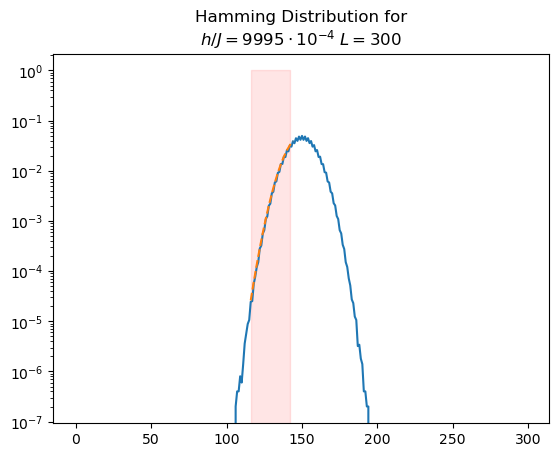

[57, 74, 73]
final parameters:
[(array([ 1.08844876e+00, -1.03882515e-01,  7.53200549e-04,  2.99647256e+02]), array([[ 4.46212110e-04, -8.69187169e-03,  3.33350595e-05,
         5.69942196e-01],
       [-8.69187169e-03,  1.97437642e-01, -7.51343268e-04,
        -1.30393221e+01],
       [ 3.33350595e-05, -7.51343268e-04,  2.86038846e-06,
         4.96017387e-02],
       [ 5.69942196e-01, -1.30393221e+01,  4.96017387e-02,
         8.61462613e+02]])), 1.0809280251452244e-05, [0, 15]]
[0, 15]
0 15
[114 116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.0809280251452244e-05
(array([ 1.08844876e+00, -1.03882515e-01,  7.53200549e-04,  2.99647256e+02]), array([[ 4.46212110e-04, -8.69187169e-03,  3.33350595e-05,
         5.69942196e-01],
       [-8.69187169e-03,  1.97437642e-01, -7.51343268e-04,
        -1.30393221e+01],
       [ 3.33350595e-05, -7.51343268e-04,  2.86038846e-06,
         4.96017387e-02],
       [ 5.69942196e-01, -1.30393221e+01,  4.96017387e-02,
         8.61462613e+02]

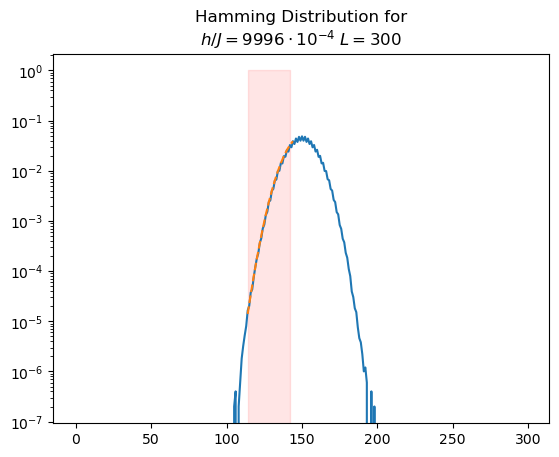

[58, 74, 73]
final parameters:
[(array([ 9.71739913e-01,  9.34550257e-01, -3.48153749e-03,  2.36569556e+02]), array([[ 2.12568527e-04, -6.11955334e-03,  2.33155893e-05,
         4.03336517e-01],
       [-6.11955334e-03,  2.12589722e-01, -8.03257043e-04,
        -1.41204506e+01],
       [ 2.33155893e-05, -8.03257043e-04,  3.03623751e-06,
         5.33336128e-02],
       [ 4.03336517e-01, -1.41204506e+01,  5.33336128e-02,
         9.38224317e+02]])), 1.6122372416739746e-05, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
1.6122372416739746e-05
(array([ 9.71739913e-01,  9.34550257e-01, -3.48153749e-03,  2.36569556e+02]), array([[ 2.12568527e-04, -6.11955334e-03,  2.33155893e-05,
         4.03336517e-01],
       [-6.11955334e-03,  2.12589722e-01, -8.03257043e-04,
        -1.41204506e+01],
       [ 2.33155893e-05, -8.03257043e-04,  3.03623751e-06,
         5.33336128e-02],
       [ 4.03336517e-01, -1.41204506e+01,  5.33336128e-02,
         9.38224317e+02]]))


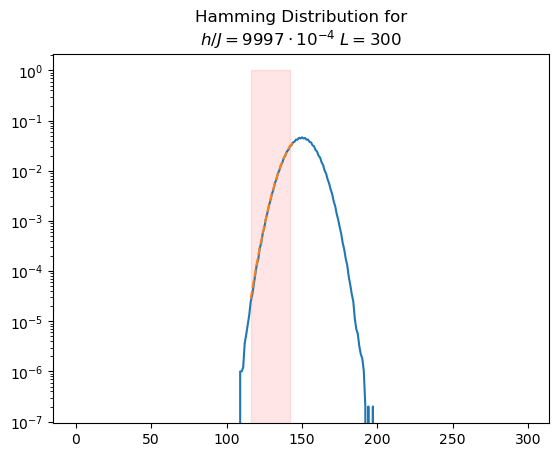

[57, 74, 73]
final parameters:
[(array([ 9.96612888e-01, -3.12187974e-01,  1.25301120e-03,  3.19206812e+02]), array([[ 5.59638960e-05, -1.60576976e-03,  6.08900117e-06,
         1.06336549e-01],
       [-1.60576976e-03,  5.56855402e-02, -2.09385361e-04,
        -3.71657846e+00],
       [ 6.08900117e-06, -2.09385361e-04,  7.87630125e-07,
         1.39696071e-02],
       [ 1.06336549e-01, -3.71657846e+00,  1.39696071e-02,
         2.48141351e+02]])), 7.499258529862812e-06, [0, 15]]
[0, 15]
0 15
[115 117 119 121 123 125 127 129 131 133 135 137 139 141 143]
7.499258529862812e-06
(array([ 9.96612888e-01, -3.12187974e-01,  1.25301120e-03,  3.19206812e+02]), array([[ 5.59638960e-05, -1.60576976e-03,  6.08900117e-06,
         1.06336549e-01],
       [-1.60576976e-03,  5.56855402e-02, -2.09385361e-04,
        -3.71657846e+00],
       [ 6.08900117e-06, -2.09385361e-04,  7.87630125e-07,
         1.39696071e-02],
       [ 1.06336549e-01, -3.71657846e+00,  1.39696071e-02,
         2.48141351e+02]])

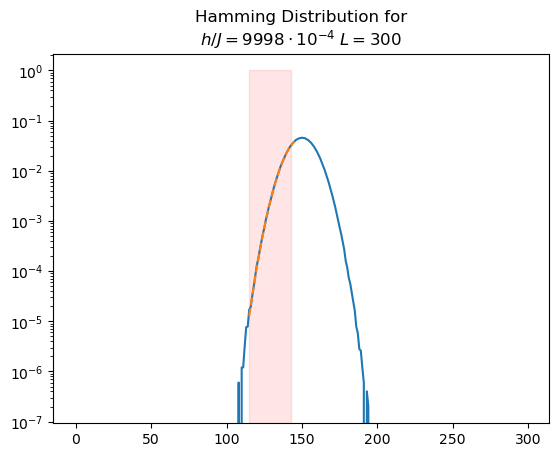

[58, 74, 73]
final parameters:
[(array([ 9.88751616e-01,  7.47347210e-01, -2.70520086e-03,  2.47392195e+02]), array([[ 8.77036389e-05, -2.42345634e-03,  9.24490994e-06,
         1.59549292e-01],
       [-2.42345634e-03,  8.07160916e-02, -3.05342020e-04,
        -5.35549440e+00],
       [ 9.24490994e-06, -3.05342020e-04,  1.15554115e-06,
         2.02517729e-02],
       [ 1.59549292e-01, -5.35549440e+00,  2.02517729e-02,
         3.55462432e+02]])), 5.905597714116827e-06, [0, 14]]
[0, 14]
0 14
[116 118 120 122 124 126 128 130 132 134 136 138 140 142]
5.905597714116827e-06
(array([ 9.88751616e-01,  7.47347210e-01, -2.70520086e-03,  2.47392195e+02]), array([[ 8.77036389e-05, -2.42345634e-03,  9.24490994e-06,
         1.59549292e-01],
       [-2.42345634e-03,  8.07160916e-02, -3.05342020e-04,
        -5.35549440e+00],
       [ 9.24490994e-06, -3.05342020e-04,  1.15554115e-06,
         2.02517729e-02],
       [ 1.59549292e-01, -5.35549440e+00,  2.02517729e-02,
         3.55462432e+02]]))
[9

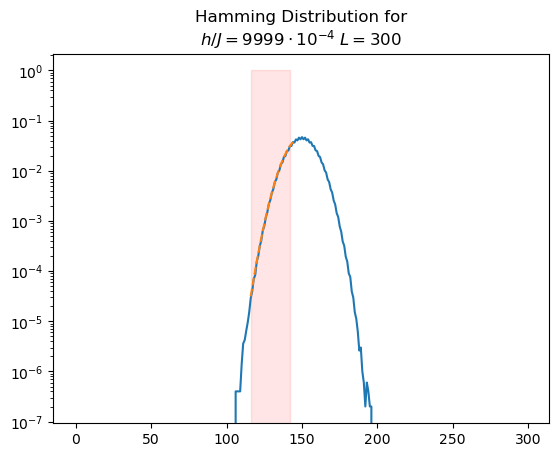

[54, 74, 73]
INSIDE
0 0.9277698585422429 0.00017617936181643287 interval=[ 109 , 145 ]
1 nan 0.00017617936181643287 interval=[ 109 , 145 ]
2 nan 0.00017617936181643287 interval=[ 109 , 145 ]
3 5.61613705193722 0.00017617936181643287 interval=[ 109 , 145 ]
4 30.954288120214805 0.00017617936181643287 interval=[ 109 , 145 ]
7 53.741527506630746 0.00017617936181643287 interval=[ 109 , 145 ]


/tmp/ipykernel_2661/3375479267.py:18: RuntimeWarning: invalid value encountered in log
  return sum(map(lambda x: x[0]*np.log(x[0]/x[1]),zip(X,Y)))


8 6.431523492453566 0.00017617936181643287 interval=[ 109 , 145 ]
13 41.61741151292273 0.00017617936181643287 interval=[ 109 , 145 ]
14 nan 0.00017617936181643287 interval=[ 109 , 145 ]
15 0.8921234833200891 0.00017617936181643287 interval=[ 109 , 145 ]
20 nan 0.00017617936181643287 interval=[ 109 , 145 ]
21 nan 0.00017617936181643287 interval=[ 109 , 145 ]
22 5.6282156432998125 0.00017617936181643287 interval=[ 109 , 145 ]
23 30.96217716742818 0.00017617936181643287 interval=[ 109 , 145 ]
26 53.74313206542158 0.00017617936181643287 interval=[ 109 , 145 ]


/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar multiply
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))
/tmp/ipykernel_2661/3375479267.py:71: OptimizeWarning: Covariance of the parameters could not be estimated
  A=so.curve_fit(F,X_test,Y_test,p0=guesses)


27 6.466108595644178 0.00017617936181643287 interval=[ 109 , 145 ]
31 nan 0.00017617936181643287 interval=[ 109 , 145 ]
32 41.61680390771288 0.00017617936181643287 interval=[ 109 , 145 ]
final parameters:
[(array([ 8.26586737e-01,  1.76635710e+00, -4.81026781e-03,  1.43985935e+02]), array([[ 1.12334432e-04, -2.66353995e-03,  1.03866356e-05,
         1.71850115e-01],
       [-2.66353995e-03,  8.14378532e-02, -3.13363485e-04,
        -5.31852720e+00],
       [ 1.03866356e-05, -3.13363485e-04,  1.20668796e-06,
         2.04507586e-02],
       [ 1.71850115e-01, -5.31852720e+00,  2.04507586e-02,
         3.47570971e+02]])), 0.00017617936181643287, [0, 18]]
[0, 18]
0 18
[109 111 113 115 117 119 121 123 125 127 129 131 133 135 137 139 141 143]
0.00017617936181643287
(array([ 8.26586737e-01,  1.76635710e+00, -4.81026781e-03,  1.43985935e+02]), array([[ 1.12334432e-04, -2.66353995e-03,  1.03866356e-05,
         1.71850115e-01],
       [-2.66353995e-03,  8.14378532e-02, -3.13363485e-04,
        

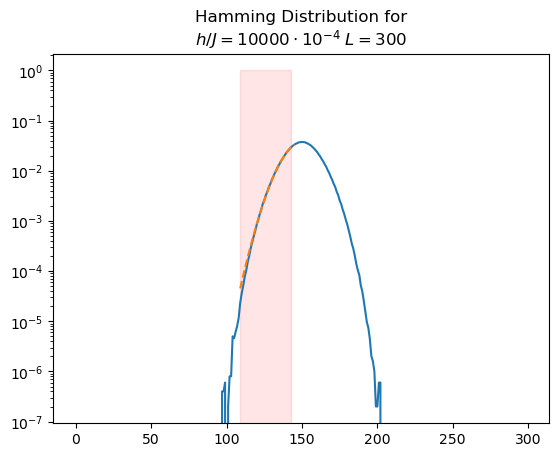

[45, 74, 73]
INSIDE
0 21.08489050430482 0.00651627397450945 interval=[ 91 , 145 ]
1 15.103612062374737 0.00651627397450945 interval=[ 91 , 145 ]
2 5.1251103595098435 0.00651627397450945 interval=[ 91 , 145 ]
7 1.034274551157525 0.00651627397450945 interval=[ 91 , 145 ]
8 4.491369396341877 0.00651627397450945 interval=[ 91 , 145 ]
9 nan 0.00651627397450945 interval=[ 91 , 145 ]
10 28.63349789839809 0.00651627397450945 interval=[ 91 , 145 ]
11 67.59848392564832 0.00651627397450945 interval=[ 91 , 145 ]
12 105.15475640070193 0.00651627397450945 interval=[ 91 , 145 ]
13 133.16414052339906 0.00651627397450945 interval=[ 91 , 145 ]
14 123.10186563244318 0.00651627397450945 interval=[ 91 , 145 ]
15 161.85472804106 0.00651627397450945 interval=[ 91 , 145 ]
16 113.59270774618555 0.00651627397450945 interval=[ 91 , 145 ]
17 1.6313078303956745 0.00651627397450945 interval=[ 91 , 145 ]
18 146.36259110783016 0.00651627397450945 interval=[ 91 , 145 ]
19 3.4510421643192695 0.00651627397450945 interva

/tmp/ipykernel_2661/3375479267.py:73: RuntimeWarning: invalid value encountered in divide
  KL_test=logKL(Y_test/np.sum(Y_test),YY/np.sum(YY))


40 105.15949008171549 0.00651627397450945 interval=[ 91 , 145 ]
41 133.16754713261963 0.00651627397450945 interval=[ 91 , 145 ]
42 123.11022151030944 0.00651627397450945 interval=[ 91 , 145 ]
43 161.86350367412948 0.00651627397450945 interval=[ 91 , 145 ]
44 113.58281147355346 0.00651627397450945 interval=[ 91 , 145 ]
45 1.6311481117309703 0.00651627397450945 interval=[ 91 , 145 ]
46 146.35974049143448 0.00651627397450945 interval=[ 91 , 145 ]
47 3.468178078562289 0.00651627397450945 interval=[ 91 , 145 ]
48 12.396654325183615 0.00651627397450945 interval=[ 91 , 145 ]
49 nan 0.00651627397450945 interval=[ 91 , 145 ]
50 nan 0.00651627397450945 interval=[ 91 , 145 ]
final parameters:
[(array([ 6.24203185e-01,  4.00986042e+00, -1.15718285e-02, -4.02262903e+01]), array([[ 7.20406089e-04, -8.41604063e-03,  3.58908913e-05,
         5.00247419e-01],
       [-8.41604063e-03,  1.53689955e-01, -6.32425972e-04,
        -9.42352733e+00],
       [ 3.58908913e-05, -6.32425972e-04,  2.61047740e-06,
 

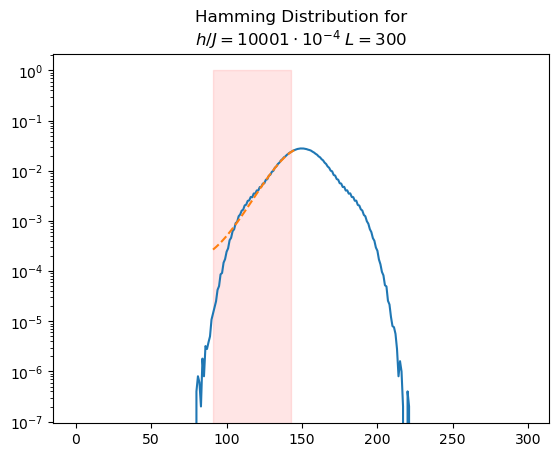

[43, 64, 71]
INSIDE
0 5.661113946114686 0.0007896590082264628 interval=[ 86 , 140 ]
1 7.037216062466687 0.0007896590082264628 interval=[ 86 , 140 ]
2 8.327476515710092 0.0007896590082264628 interval=[ 86 , 140 ]
3 8.735420911040666 0.0007896590082264628 interval=[ 86 , 140 ]
4 8.781155777052813 0.0007896590082264628 interval=[ 86 , 140 ]
5 6.795322285494795 0.0007896590082264628 interval=[ 86 , 140 ]
6 4.962501507004828 0.0007896590082264628 interval=[ 86 , 140 ]
7 3.035408004643707 0.0007896590082264628 interval=[ 86 , 140 ]
8 0.9824529083553009 0.0007896590082264628 interval=[ 86 , 140 ]
9 nan 0.0007896590082264628 interval=[ 86 , 140 ]
10 15.804300189304731 0.0007896590082264628 interval=[ 86 , 140 ]
11 19.825511606934352 0.0007896590082264628 interval=[ 86 , 140 ]
12 24.701551629828465 0.0007896590082264628 interval=[ 86 , 140 ]
13 52.21370828264256 0.0007896590082264628 interval=[ 86 , 140 ]
14 73.31248925041857 0.0007896590082264628 interval=[ 86 , 140 ]
15 71.99050465863445 0.00

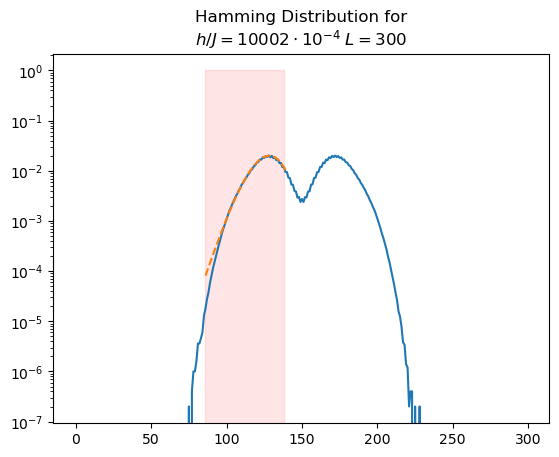

[38, 62, 71]
INSIDE
0 0.3815177159068437 0.013297131513472782 interval=[ 76 , 140 ]
1 0.4268284149001684 0.013297131513472782 interval=[ 76 , 140 ]
2 2.4410842410172107 0.013297131513472782 interval=[ 76 , 140 ]
3 nan 0.013297131513472782 interval=[ 76 , 140 ]
4 nan 0.013297131513472782 interval=[ 76 , 140 ]
5 60.01031262461016 0.013297131513472782 interval=[ 76 , 140 ]
6 53.31191939442396 0.013297131513472782 interval=[ 76 , 140 ]
7 53.08444951866897 0.013297131513472782 interval=[ 76 , 140 ]
8 60.032970577623914 0.013297131513472782 interval=[ 76 , 140 ]
9 73.48690769543157 0.013297131513472782 interval=[ 76 , 140 ]
10 93.7011254305347 0.013297131513472782 interval=[ 76 , 140 ]
11 117.84810581763765 0.013297131513472782 interval=[ 76 , 140 ]
12 144.73055954219538 0.013297131513472782 interval=[ 76 , 140 ]
13 171.1837989648045 0.013297131513472782 interval=[ 76 , 140 ]
14 inf 0.013297131513472782 interval=[ 76 , 140 ]
15 163.34623363018287 0.013297131513472782 interval=[ 76 , 140 ]
16

/tmp/ipykernel_2661/3375479267.py:18: RuntimeWarning: divide by zero encountered in scalar divide
  return sum(map(lambda x: x[0]*np.log(x[0]/x[1]),zip(X,Y)))


29 39.23314898441485 0.013297131513472782 interval=[ 76 , 140 ]
34 0.2240563890861887 0.013297131513472782 interval=[ 76 , 140 ]
35 29.48391213835257 0.013297131513472782 interval=[ 76 , 140 ]
36 47.989487605999976 0.013297131513472782 interval=[ 76 , 140 ]
37 59.73259883280718 0.013297131513472782 interval=[ 76 , 140 ]
38 60.00645545660303 0.013297131513472782 interval=[ 76 , 140 ]
43 93.68232285129815 0.013297131513472782 interval=[ 76 , 140 ]
44 117.85949348248323 0.013297131513472782 interval=[ 76 , 140 ]
45 144.74420465892615 0.013297131513472782 interval=[ 76 , 140 ]
46 171.18615996462236 0.013297131513472782 interval=[ 76 , 140 ]
47 inf 0.013297131513472782 interval=[ 76 , 140 ]
48 163.3461015264337 0.013297131513472782 interval=[ 76 , 140 ]
49 173.81337003858692 0.013297131513472782 interval=[ 76 , 140 ]
50 148.6276558139923 0.013297131513472782 interval=[ 76 , 140 ]
51 96.05505666200631 0.013297131513472782 interval=[ 76 , 140 ]
52 92.32624212271614 0.013297131513472782 interv

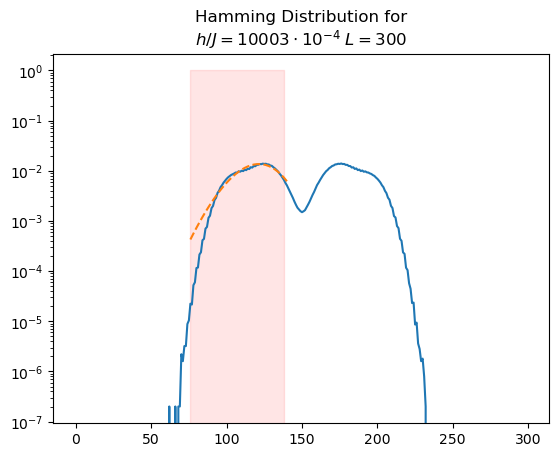

[38, 58, 71]
INSIDE
0 nan 0.00032268173822283736 interval=[ 76 , 140 ]
1 nan 0.00032268173822283736 interval=[ 76 , 140 ]
2 nan 0.00032268173822283736 interval=[ 76 , 140 ]
3 nan 0.00032268173822283736 interval=[ 76 , 140 ]
4 nan 0.00032268173822283736 interval=[ 76 , 140 ]
5 nan 0.00032268173822283736 interval=[ 76 , 140 ]
6 nan 0.00032268173822283736 interval=[ 76 , 140 ]
7 nan 0.00032268173822283736 interval=[ 76 , 140 ]
8 nan 0.00032268173822283736 interval=[ 76 , 140 ]
9 nan 0.00032268173822283736 interval=[ 76 , 140 ]
10 23.479817470111016 0.00032268173822283736 interval=[ 76 , 140 ]
11 31.923918841891172 0.00032268173822283736 interval=[ 76 , 140 ]
12 50.67828821734881 0.00032268173822283736 interval=[ 76 , 140 ]
13 67.56882742728831 0.00032268173822283736 interval=[ 76 , 140 ]
14 101.7765198842525 0.00032268173822283736 interval=[ 76 , 140 ]
15 85.17568572646526 0.00032268173822283736 interval=[ 76 , 140 ]
16 45.994035192014614 0.00032268173822283736 interval=[ 76 , 140 ]
17 47

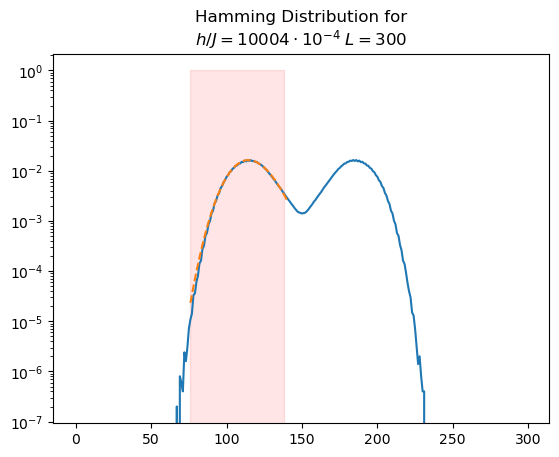

[31, 57, 71]
INSIDE
0 15.285655390634286 0.015537256369725791 interval=[ 62 , 140 ]
1 nan 0.015537256369725791 interval=[ 62 , 140 ]
2 nan 0.015537256369725791 interval=[ 62 , 140 ]
3 nan 0.015537256369725791 interval=[ 62 , 140 ]
4 80.15416136934887 0.015537256369725791 interval=[ 62 , 140 ]
5 77.85981062205104 0.015537256369725791 interval=[ 62 , 140 ]
6 75.457296733393 0.015537256369725791 interval=[ 62 , 140 ]
7 76.3711497367112 0.015537256369725791 interval=[ 62 , 140 ]
8 80.55965502553396 0.015537256369725791 interval=[ 62 , 140 ]
9 85.82223074775489 0.015537256369725791 interval=[ 62 , 140 ]
10 93.12475823877877 0.015537256369725791 interval=[ 62 , 140 ]
11 100.79843029808367 0.015537256369725791 interval=[ 62 , 140 ]
12 109.24938732375786 0.015537256369725791 interval=[ 62 , 140 ]
13 119.56769080996587 0.015537256369725791 interval=[ 62 , 140 ]
14 133.62682444511466 0.015537256369725791 interval=[ 62 , 140 ]
15 150.52797817877382 0.015537256369725791 interval=[ 62 , 140 ]
16 16

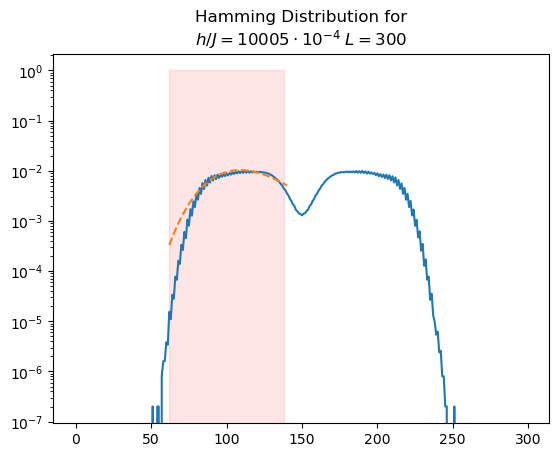

[14, 57, 71]
INSIDE
0 10.038694420272389 0.06338016008162216 interval=[ 29 , 141 ]
1 9.997860594310866 0.06338016008162216 interval=[ 29 , 141 ]
2 9.955999348989998 0.06338016008162216 interval=[ 29 , 141 ]
3 9.884610955975674 0.06338016008162216 interval=[ 29 , 141 ]
4 9.851759272918652 0.06338016008162216 interval=[ 29 , 141 ]
5 9.827635839655922 0.06338016008162216 interval=[ 29 , 141 ]
6 9.814238700372877 0.06338016008162216 interval=[ 29 , 141 ]
7 9.821966407403375 0.06338016008162216 interval=[ 29 , 141 ]
8 9.874573382986823 0.06338016008162216 interval=[ 29 , 141 ]
9 9.988771805991432 0.06338016008162216 interval=[ 29 , 141 ]
10 10.205871839899965 0.06338016008162216 interval=[ 29 , 141 ]
11 10.493034421920537 0.06338016008162216 interval=[ 29 , 141 ]
12 10.798660459670373 0.06338016008162216 interval=[ 29 , 141 ]
13 10.979351327886699 0.06338016008162216 interval=[ 29 , 141 ]
14 11.15753477657053 0.06338016008162216 interval=[ 29 , 141 ]
15 11.069111514147673 0.0633801600816221

/tmp/ipykernel_2661/841889229.py:16: RuntimeWarning: overflow encountered in multiply
  return prob*k


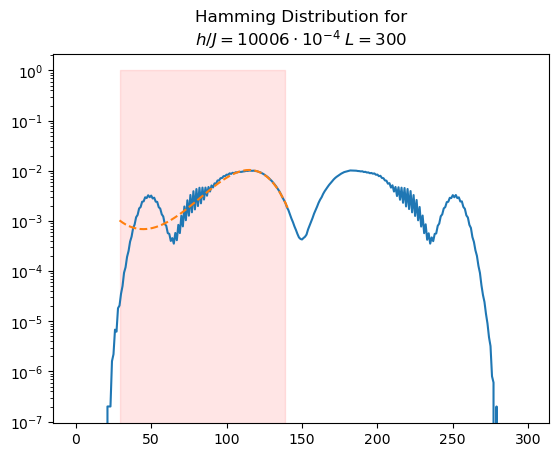

[17, 48, 67]
INSIDE
0 14.20597012438834 0.0400824987328872 interval=[ 34 , 132 ]
1 14.205147523431773 0.0400824987328872 interval=[ 34 , 132 ]
2 14.204191171443169 0.0400824987328872 interval=[ 34 , 132 ]
3 14.206227096859678 0.0400824987328872 interval=[ 34 , 132 ]
4 14.216187775179273 0.0400824987328872 interval=[ 34 , 132 ]
5 14.242853552348413 0.0400824987328872 interval=[ 34 , 132 ]
6 14.307142471816528 0.0400824987328872 interval=[ 34 , 132 ]
7 14.428355485166064 0.0400824987328872 interval=[ 34 , 132 ]
8 14.619595632486574 0.0400824987328872 interval=[ 34 , 132 ]
9 14.858287585743808 0.0400824987328872 interval=[ 34 , 132 ]
10 15.16901740552849 0.0400824987328872 interval=[ 34 , 132 ]
11 15.456958334517314 0.0400824987328872 interval=[ 34 , 132 ]
12 15.84284460121114 0.0400824987328872 interval=[ 34 , 132 ]
13 16.247573481275083 0.0400824987328872 interval=[ 34 , 132 ]
14 16.431894992305416 0.0400824987328872 interval=[ 34 , 132 ]
15 16.27444703251066 0.0400824987328872 interval

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar power
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))
/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: divide by zero encountered in scalar divide
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


96 2.5596806132069094 0.0400824987328872 interval=[ 34 , 132 ]
final parameters:
[(array([ 0.26570069,  3.36963027, -0.01309066, -8.12055765]), array([[ 3.20908383e-05,  2.55403947e-04, -1.80654081e-06,
        -7.37462014e-03],
       [ 2.55403947e-04,  1.28380787e-02, -7.79295181e-05,
        -4.95226483e-01],
       [-1.80654081e-06, -7.79295181e-05,  4.84532000e-07,
         2.91086889e-03],
       [-7.37462014e-03, -4.95226483e-01,  2.91086889e-03,
         1.99895386e+01]])), 0.0400824987328872, [0, 49]]
[0, 49]
0 49
[ 34  36  38  40  42  44  46  48  50  52  54  56  58  60  62  64  66  68
  70  72  74  76  78  80  82  84  86  88  90  92  94  96  98 100 102 104
 106 108 110 112 114 116 118 120 122 124 126 128 130]
0.0400824987328872
(array([ 0.26570069,  3.36963027, -0.01309066, -8.12055765]), array([[ 3.20908383e-05,  2.55403947e-04, -1.80654081e-06,
        -7.37462014e-03],
       [ 2.55403947e-04,  1.28380787e-02, -7.79295181e-05,
        -4.95226483e-01],
       [-1.80654081e

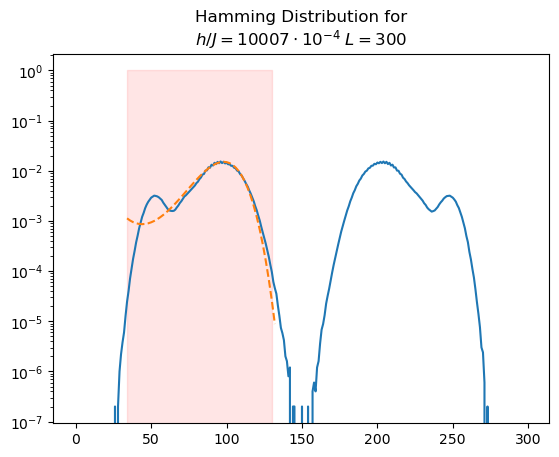

[22, 46, 69]
INSIDE
0 0.41725839636459444 0.024621074373003173 interval=[ 44 , 136 ]
1 0.4180882835499666 0.024621074373003173 interval=[ 44 , 136 ]
2 0.41956852920622845 0.024621074373003173 interval=[ 44 , 136 ]
3 0.42204669766542435 0.024621074373003173 interval=[ 44 , 136 ]
4 0.4260329484171237 0.024621074373003173 interval=[ 44 , 136 ]
5 0.4322794097484322 0.024621074373003173 interval=[ 44 , 136 ]
6 0.44165316687386696 0.024621074373003173 interval=[ 44 , 136 ]
7 0.4552489673792355 0.024621074373003173 interval=[ 44 , 136 ]
8 0.47547778841822574 0.024621074373003173 interval=[ 44 , 136 ]
9 0.5069390490368001 0.024621074373003173 interval=[ 44 , 136 ]
10 0.560713767921392 0.024621074373003173 interval=[ 44 , 136 ]
11 0.6639097410448856 0.024621074373003173 interval=[ 44 , 136 ]
12 0.9258974592449577 0.024621074373003173 interval=[ 44 , 136 ]
13 1.7208230605448132 0.024621074373003173 interval=[ 44 , 136 ]
14 4.27899321742219 0.024621074373003173 interval=[ 44 , 136 ]
15 93.7804561

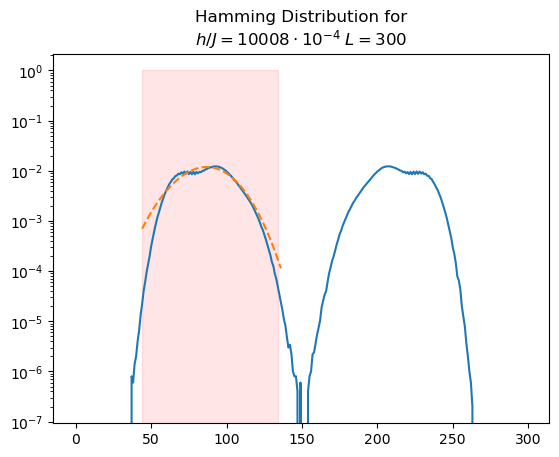

[20, 39, 70]
INSIDE
0 nan 0.010347780510897188 interval=[ 40 , 138 ]
1 nan 0.010347780510897188 interval=[ 40 , 138 ]
2 nan 0.010347780510897188 interval=[ 40 , 138 ]
3 nan 0.010347780510897188 interval=[ 40 , 138 ]
4 nan 0.010347780510897188 interval=[ 40 , 138 ]
5 nan 0.010347780510897188 interval=[ 40 , 138 ]
6 nan 0.010347780510897188 interval=[ 40 , 138 ]
7 nan 0.010347780510897188 interval=[ 40 , 138 ]
8 nan 0.010347780510897188 interval=[ 40 , 138 ]
9 nan 0.010347780510897188 interval=[ 40 , 138 ]
10 nan 0.010347780510897188 interval=[ 40 , 138 ]
11 nan 0.010347780510897188 interval=[ 40 , 138 ]
12 nan 0.010347780510897188 interval=[ 40 , 138 ]
13 nan 0.010347780510897188 interval=[ 40 , 138 ]
14 nan 0.010347780510897188 interval=[ 40 , 138 ]
15 18.807079129176657 0.010347780510897188 interval=[ 40 , 138 ]
16 13.571357955753522 0.010347780510897188 interval=[ 40 , 138 ]
17 10.868928741970523 0.010347780510897188 interval=[ 40 , 138 ]
18 140.04982627683623 0.010347780510897188 in

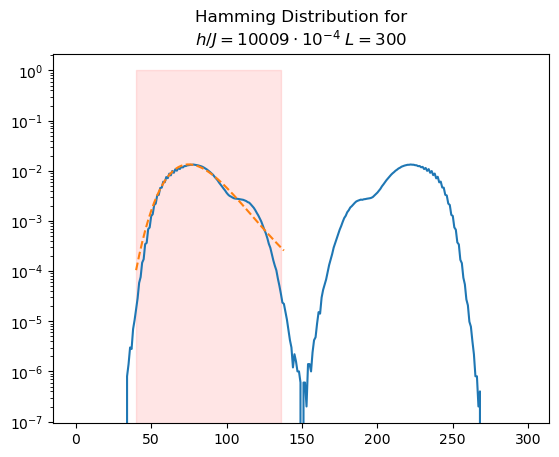

[19, 31, 61]
INSIDE
0 24.781850265812622 0.07999208488406503 interval=[ 38 , 120 ]
1 nan 0.07999208488406503 interval=[ 38 , 120 ]
2 nan 0.07999208488406503 interval=[ 38 , 120 ]
3 inf 0.07999208488406503 interval=[ 38 , 120 ]
4 inf 0.07999208488406503 interval=[ 38 , 120 ]
5 inf 0.07999208488406503 interval=[ 38 , 120 ]
6 inf 0.07999208488406503 interval=[ 38 , 120 ]
7 inf 0.07999208488406503 interval=[ 38 , 120 ]
8 48.32739472985854 0.07999208488406503 interval=[ 38 , 120 ]
9 87.26884108466272 0.07999208488406503 interval=[ 38 , 120 ]
10 129.0612988768202 0.07999208488406503 interval=[ 38 , 120 ]
11 inf 0.07999208488406503 interval=[ 38 , 120 ]
12 inf 0.07999208488406503 interval=[ 38 , 120 ]
13 inf 0.07999208488406503 interval=[ 38 , 120 ]
14 262.16989949635405 0.07999208488406503 interval=[ 38 , 120 ]
15 277.31178374349287 0.07999208488406503 interval=[ 38 , 120 ]
16 289.2083835619119 0.07999208488406503 interval=[ 38 , 120 ]
17 295.2098780919428 0.07999208488406503 interval=[ 38 ,

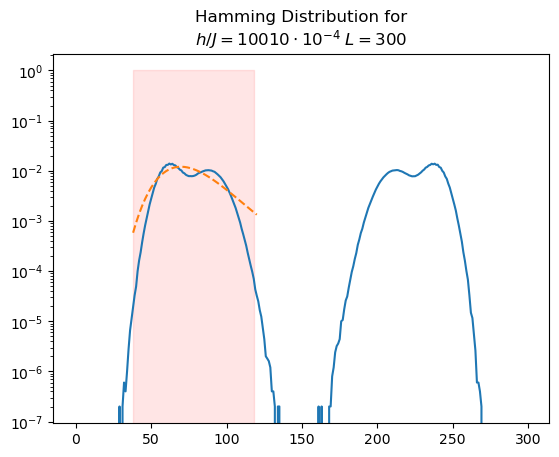

[9, 33, 52]
INSIDE
0 2.278974626849798 0.021431003639705723 interval=[ 18 , 102 ]
1 2.279442154670608 0.021431003639705723 interval=[ 18 , 102 ]
2 2.280566980429873 0.021431003639705723 interval=[ 18 , 102 ]
3 2.283258187572518 0.021431003639705723 interval=[ 18 , 102 ]
4 2.2902643155200533 0.021431003639705723 interval=[ 18 , 102 ]
5 2.3068460910858324 0.021431003639705723 interval=[ 18 , 102 ]
6 2.3408038684853962 0.021431003639705723 interval=[ 18 , 102 ]
7 2.4004027028326274 0.021431003639705723 interval=[ 18 , 102 ]
8 2.49871489959336 0.021431003639705723 interval=[ 18 , 102 ]
9 2.628423591210154 0.021431003639705723 interval=[ 18 , 102 ]
10 2.792697322266645 0.021431003639705723 interval=[ 18 , 102 ]
11 2.9802362706287013 0.021431003639705723 interval=[ 18 , 102 ]
13 3.2446458382804835 0.021431003639705723 interval=[ 18 , 102 ]
15 3.074158160933368 0.021431003639705723 interval=[ 18 , 102 ]
17 2.444080649741281 0.021431003639705723 interval=[ 18 , 102 ]
18 2.0251488290961968 0.02

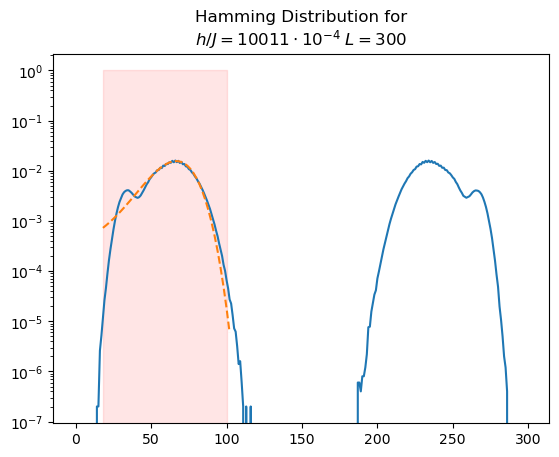

[2, 29, 51]
INSIDE
0 nan 1.1895882034771263 interval=[ 5 , 101 ]
1 nan 1.1895882034771263 interval=[ 5 , 101 ]
2 nan 1.1895882034771263 interval=[ 5 , 101 ]
3 nan 1.1895882034771263 interval=[ 5 , 101 ]
4 nan 1.1895882034771263 interval=[ 5 , 101 ]
5 nan 1.1895882034771263 interval=[ 5 , 101 ]
6 nan 1.1895882034771263 interval=[ 5 , 101 ]
7 nan 1.1895882034771263 interval=[ 5 , 101 ]
8 nan 1.1895882034771263 interval=[ 5 , 101 ]
9 nan 1.1895882034771263 interval=[ 5 , 101 ]
10 nan 1.1895882034771263 interval=[ 5 , 101 ]
11 nan 1.1895882034771263 interval=[ 5 , 101 ]
12 31.863591152715458 1.1895882034771263 interval=[ 5 , 101 ]
13 16.405300897155005 1.1895882034771263 interval=[ 5 , 101 ]
14 8.43479235959672 1.1895882034771263 interval=[ 5 , 101 ]
20 8.151144382396014 1.1895882034771263 interval=[ 5 , 101 ]
21 7.64426795443871 1.1895882034771263 interval=[ 5 , 101 ]
22 nan 1.1895882034771263 interval=[ 5 , 101 ]
24 nan 1.1895882034771263 interval=[ 5 , 101 ]
25 nan 1.1895882034771263 in

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar divide
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


60 31.457198306862736 1.1895882034771263 interval=[ 5 , 101 ]
61 nan 1.1895882034771263 interval=[ 5 , 101 ]
62 inf 1.1895882034771263 interval=[ 5 , 101 ]
63 nan 1.1895882034771263 interval=[ 5 , 101 ]
64 22.440040162953252 1.1895882034771263 interval=[ 5 , 101 ]
66 20.27467454096537 1.1895882034771263 interval=[ 5 , 101 ]
67 nan 1.1895882034771263 interval=[ 5 , 101 ]
68 nan 1.1895882034771263 interval=[ 5 , 101 ]
72 15.266213601529607 1.1895882034771263 interval=[ 5 , 101 ]
73 15.841941816831811 1.1895882034771263 interval=[ 5 , 101 ]
74 15.461379199185448 1.1895882034771263 interval=[ 5 , 101 ]
76 nan 1.1895882034771263 interval=[ 5 , 101 ]
77 nan 1.1895882034771263 interval=[ 5 , 101 ]
78 2.9897731032981616 1.1895882034771263 interval=[ 5 , 101 ]
87 nan 1.1895882034771263 interval=[ 5 , 101 ]
88 nan 1.1895882034771263 interval=[ 5 , 101 ]
final parameters:
[(array([2.30089240e-01, 7.71195113e-01, 1.59164323e-03, 6.67857592e+01]), array([[ 6.52367533e-05, -4.62313654e-04,  2.199983

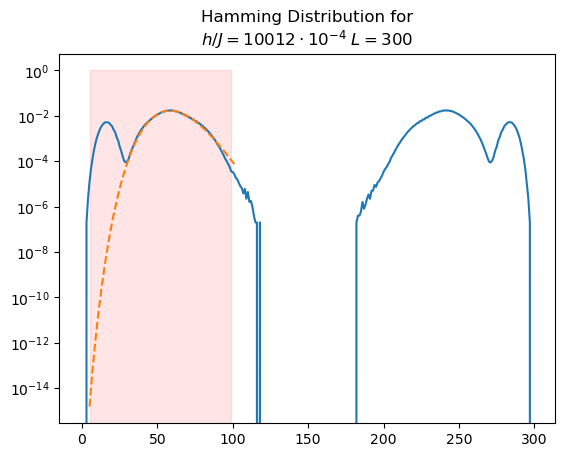

[14, 31, 58]
INSIDE
0 nan 0.01031068983809933 interval=[ 28 , 114 ]
1 nan 0.01031068983809933 interval=[ 28 , 114 ]
2 nan 0.01031068983809933 interval=[ 28 , 114 ]
3 nan 0.01031068983809933 interval=[ 28 , 114 ]
4 nan 0.01031068983809933 interval=[ 28 , 114 ]
5 nan 0.01031068983809933 interval=[ 28 , 114 ]
6 nan 0.01031068983809933 interval=[ 28 , 114 ]
7 nan 0.01031068983809933 interval=[ 28 , 114 ]
8 nan 0.01031068983809933 interval=[ 28 , 114 ]
9 nan 0.01031068983809933 interval=[ 28 , 114 ]
10 nan 0.01031068983809933 interval=[ 28 , 114 ]
11 nan 0.01031068983809933 interval=[ 28 , 114 ]
12 nan 0.01031068983809933 interval=[ 28 , 114 ]
13 20.327602856115124 0.01031068983809933 interval=[ 28 , 114 ]
14 12.481752539040157 0.01031068983809933 interval=[ 28 , 114 ]
15 8.08794621353277 0.01031068983809933 interval=[ 28 , 114 ]
16 5.365086955596314 0.01031068983809933 interval=[ 28 , 114 ]
17 nan 0.01031068983809933 interval=[ 28 , 114 ]
18 nan 0.01031068983809933 interval=[ 28 , 114 ]
19

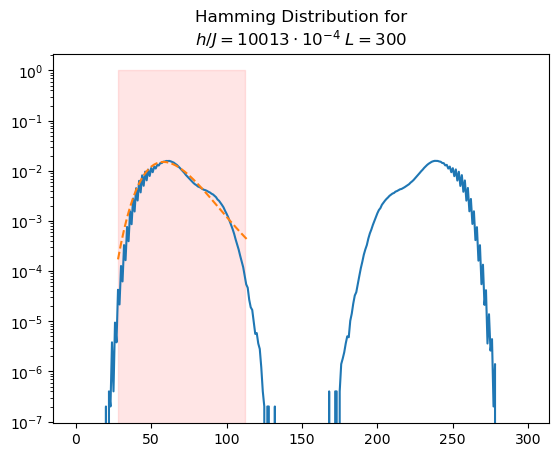

[8, 28, 46]
INSIDE
0 0.49692024485281183 0.01240495884146612 interval=[ 16 , 90 ]
1 0.49788741855635726 0.01240495884146612 interval=[ 16 , 90 ]
2 0.4995449236463411 0.01240495884146612 interval=[ 16 , 90 ]
3 0.5021584106094023 0.01240495884146612 interval=[ 16 , 90 ]
4 0.506025889471688 0.01240495884146612 interval=[ 16 , 90 ]
5 0.5115737814764701 0.01240495884146612 interval=[ 16 , 90 ]
6 0.5186745671095118 0.01240495884146612 interval=[ 16 , 90 ]
7 0.5287152667988967 0.01240495884146612 interval=[ 16 , 90 ]
8 0.5427181642663956 0.01240495884146612 interval=[ 16 , 90 ]
9 0.5640610915711237 0.01240495884146612 interval=[ 16 , 90 ]
10 0.5942415833200693 0.01240495884146612 interval=[ 16 , 90 ]
11 0.63417231592057 0.01240495884146612 interval=[ 16 , 90 ]
13 0.7499754181610409 0.01240495884146612 interval=[ 16 , 90 ]
16 1.5876922451167144 0.01240495884146612 interval=[ 16 , 90 ]
17 2.721175873519565 0.01240495884146612 interval=[ 16 , 90 ]
18 2.3771361735809924 0.01240495884146612 interv

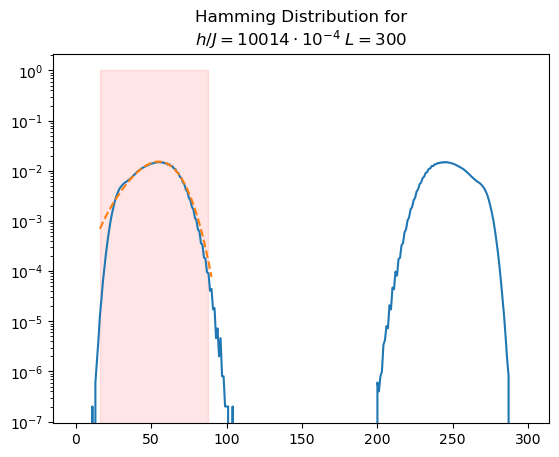

[4, 13, 40]
INSIDE
0 108.56954557011785 0.016583785268624383 interval=[ 8 , 78 ]
1 108.58406726876692 0.016583785268624383 interval=[ 8 , 78 ]
2 108.61918642080248 0.016583785268624383 interval=[ 8 , 78 ]
3 108.70043250261789 0.016583785268624383 interval=[ 8 , 78 ]
4 12.480418098960467 0.016583785268624383 interval=[ 8 , 78 ]
5 109.30132265097755 0.016583785268624383 interval=[ 8 , 78 ]
6 110.09038013155926 0.016583785268624383 interval=[ 8 , 78 ]
7 111.24387644899087 0.016583785268624383 interval=[ 8 , 78 ]
8 112.62741567433402 0.016583785268624383 interval=[ 8 , 78 ]
9 113.88784786829322 0.016583785268624383 interval=[ 8 , 78 ]
10 115.65120047979941 0.016583785268624383 interval=[ 8 , 78 ]
11 118.55285262697501 0.016583785268624383 interval=[ 8 , 78 ]
12 122.36581857546285 0.016583785268624383 interval=[ 8 , 78 ]
13 124.2012143338106 0.016583785268624383 interval=[ 8 , 78 ]
14 121.35324582827425 0.016583785268624383 interval=[ 8 , 78 ]
15 112.52690553277542 0.016583785268624383 inte

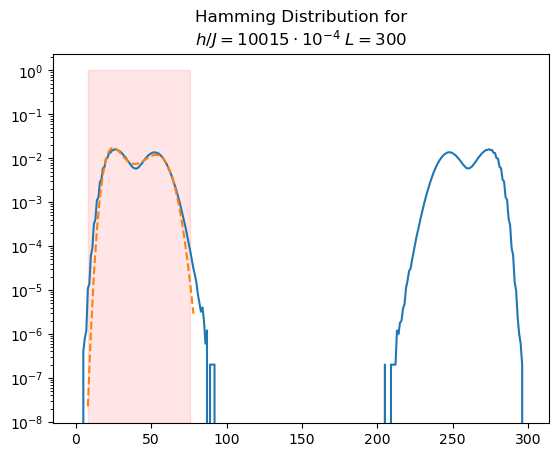

[9, 19, 43]
INSIDE
0 nan 0.037919523965312556 interval=[ 18 , 84 ]
1 nan 0.037919523965312556 interval=[ 18 , 84 ]
2 1.8312488721815996 0.037919523965312556 interval=[ 18 , 84 ]
3 11.834070251868322 0.037919523965312556 interval=[ 18 , 84 ]
4 21.759082850401235 0.037919523965312556 interval=[ 18 , 84 ]
5 31.853374097308695 0.037919523965312556 interval=[ 18 , 84 ]
6 42.092627646759006 0.037919523965312556 interval=[ 18 , 84 ]
7 52.08063243461279 0.037919523965312556 interval=[ 18 , 84 ]
8 61.251046681239345 0.037919523965312556 interval=[ 18 , 84 ]
12 nan 0.037919523965312556 interval=[ 18 , 84 ]
13 1.3975169644190577 0.037919523965312556 interval=[ 18 , 84 ]
14 49.06642163954815 0.037919523965312556 interval=[ 18 , 84 ]
15 101.1199642822509 0.037919523965312556 interval=[ 18 , 84 ]
16 130.40711252502365 0.037919523965312556 interval=[ 18 , 84 ]
17 148.81245917184913 0.037919523965312556 interval=[ 18 , 84 ]
18 154.4548117128977 0.037919523965312556 interval=[ 18 , 84 ]
19 16.622646711

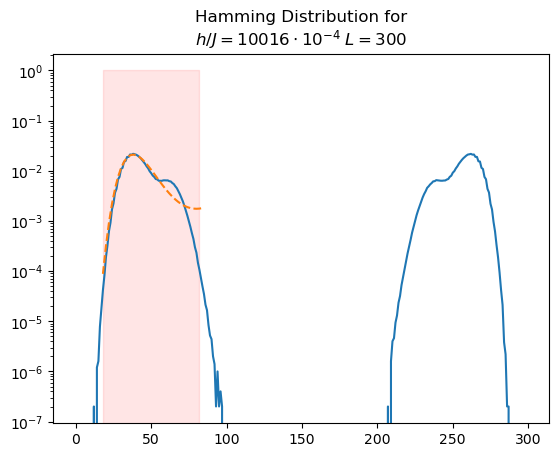

[2, 22, 39]
INSIDE
0 0.8976918275132569 0.06842708797734705 interval=[ 4 , 76 ]
1 0.8983784255897225 0.06842708797734705 interval=[ 4 , 76 ]
2 0.8988193694438298 0.06842708797734705 interval=[ 4 , 76 ]
3 0.8979304205522123 0.06842708797734705 interval=[ 4 , 76 ]
4 0.8935869005989034 0.06842708797734705 interval=[ 4 , 76 ]
5 0.8829868956969353 0.06842708797734705 interval=[ 4 , 76 ]
6 0.8620095313932797 0.06842708797734705 interval=[ 4 , 76 ]
7 0.8295125308739063 0.06842708797734705 interval=[ 4 , 76 ]
8 0.5212332406269807 0.06842708797734705 interval=[ 4 , 76 ]
9 0.7355049074024692 0.06842708797734705 interval=[ 4 , 76 ]
10 0.6850633077537468 0.06842708797734705 interval=[ 4 , 76 ]
11 0.6503376533717706 0.06842708797734705 interval=[ 4 , 76 ]
12 2.3641767213541045 0.06842708797734705 interval=[ 4 , 76 ]
19 147.53266616165894 0.06842708797734705 interval=[ 4 , 76 ]
20 133.7406168720228 0.06842708797734705 interval=[ 4 , 76 ]
21 110.74140774841635 0.06842708797734705 interval=[ 4 , 76 ]


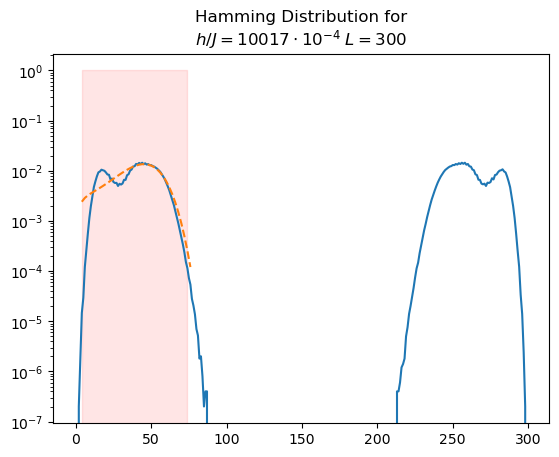

[7, 18, 50]
INSIDE
0 nan 0.06930946129537323 interval=[ 14 , 98 ]
1 nan 0.06930946129537323 interval=[ 14 , 98 ]
2 nan 0.06930946129537323 interval=[ 14 , 98 ]
3 nan 0.06930946129537323 interval=[ 14 , 98 ]
4 nan 0.06930946129537323 interval=[ 14 , 98 ]
5 nan 0.06930946129537323 interval=[ 14 , 98 ]
6 1.9839680226630194 0.06930946129537323 interval=[ 14 , 98 ]
7 15.339396773684975 0.06930946129537323 interval=[ 14 , 98 ]
8 26.53774813134413 0.06930946129537323 interval=[ 14 , 98 ]
15 68.52315907038876 0.06930946129537323 interval=[ 14 , 98 ]
21 0.8896407170710708 0.06930946129537323 interval=[ 14 , 98 ]
22 nan 0.06930946129537323 interval=[ 14 , 98 ]
25 0.9176806100038787 0.06930946129537323 interval=[ 14 , 98 ]
26 1.1977933702834422 0.06930946129537323 interval=[ 14 , 98 ]
27 1.4905744506624592 0.06930946129537323 interval=[ 14 , 98 ]
28 nan 0.06930946129537323 interval=[ 14 , 98 ]
29 353.5917683715155 0.06930946129537323 interval=[ 14 , 98 ]
30 nan 0.06930946129537323 interval=[ 14 ,

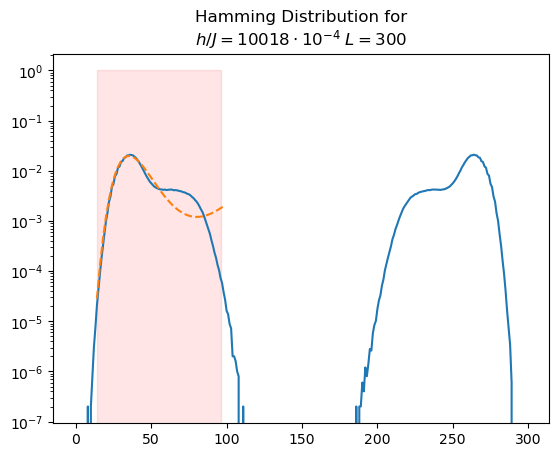

[1, 8, 42]
INSIDE
0 42.517282705535926 0.4556966007118716 interval=[ 2 , 82 ]
1 0.5720221917318359 0.4556966007118716 interval=[ 2 , 82 ]
2 0.5951525682168024 0.4556966007118716 interval=[ 2 , 82 ]
3 0.5454194769175086 0.4556966007118716 interval=[ 2 , 82 ]
4 0.6691898815432306 0.4556966007118716 interval=[ 2 , 82 ]
5 0.7132581933655262 0.4556966007118716 interval=[ 2 , 82 ]
6 0.7969989413400809 0.4556966007118716 interval=[ 2 , 82 ]
7 0.8896137358940952 0.4556966007118716 interval=[ 2 , 82 ]
8 1.0066109559196315 0.4556966007118716 interval=[ 2 , 82 ]
9 1.158277708879518 0.4556966007118716 interval=[ 2 , 82 ]
10 1.341593015895957 0.4556966007118716 interval=[ 2 , 82 ]
11 1.5858152497087168 0.4556966007118716 interval=[ 2 , 82 ]
13 0.4074599340405529 0.4074599340405529 interval=[ 2 , 56 ]
15 0.4369332790585845 0.4074599340405529 interval=[ 2 , 56 ]
16 0.45193601234399944 0.4074599340405529 interval=[ 2 , 56 ]
17 9.18062345687528 0.4074599340405529 interval=[ 2 , 56 ]
18 0.51602832193359

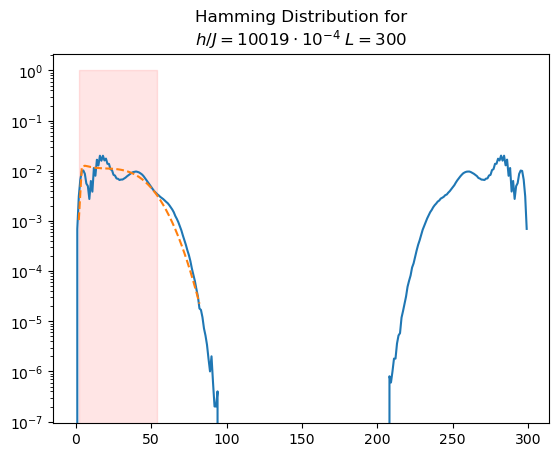

[3, 19, 31]
INSIDE
0 1.0614811178746666 0.007441942749703849 interval=[ 6 , 60 ]
1 1.062384459760341 0.007441942749703849 interval=[ 6 , 60 ]
2 1.0647072700718885 0.007441942749703849 interval=[ 6 , 60 ]
3 1.070738644860336 0.007441942749703849 interval=[ 6 , 60 ]
4 1.0850432787928406 0.007441942749703849 interval=[ 6 , 60 ]
5 1.111306165875889 0.007441942749703849 interval=[ 6 , 60 ]
6 1.138102729304247 0.007441942749703849 interval=[ 6 , 60 ]
7 1.1568643849651135 0.007441942749703849 interval=[ 6 , 60 ]
8 1.1450941228633373 0.007441942749703849 interval=[ 6 , 60 ]
9 1.105726025945169 0.007441942749703849 interval=[ 6 , 60 ]
11 1.0309715433277622 0.007441942749703849 interval=[ 6 , 60 ]
12 1.045793486726251 0.007441942749703849 interval=[ 6 , 60 ]
13 1.0809599170201378 0.007441942749703849 interval=[ 6 , 60 ]
18 3.0040767802893056 0.007441942749703849 interval=[ 6 , 60 ]
19 nan 0.007441942749703849 interval=[ 6 , 60 ]
20 nan 0.007441942749703849 interval=[ 6 , 60 ]
21 nan 0.0074419427

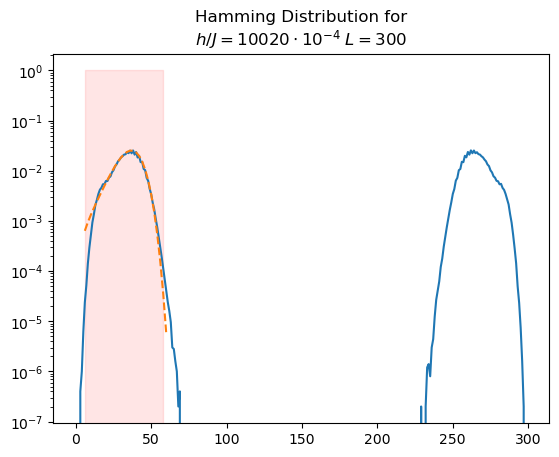

In [15]:
l=[200,250,300]
W=1
GI=9980
GF=10020
dG=1
NR=1000
NS=1000
n_mean=10
delta=0
start=0
dx=0.01
eps=10**(-5)
norm = mcolors.Normalize(vmin=np.abs(l[0]), vmax=np.abs(l[len(l)-1]))

G=[i for i in range(GI,GF+dG,dG)]
colors = [(0.0, "green"),(0.33333, 'blue'),(0.66666,"brown"),(1.0, 'red')]
# Create the custom colormap
cmap = LinearSegmentedColormap.from_list('custom_blue_green', colors)

#AA=[20,21,22,23]
AA=[i for i in range(len(G))]
print(AA)

ID0=[[] for L in l]
DID0=[[] for L in l]
KL=[[] for L in l]
RV=[[] for L in l]

alp=0.5
PDF=[[np.zeros(L) for g in G] for L in l]
DPDF=[[np.zeros(L) for g in G] for L in l]
for ll in range(len(l)):
    L=l[ll]
    name_figs="L"+str(L)+"W"+str(W)+"NS"+str(NS)+"NR"+str(NR)+"D.png"
    for g in range(len(G)):
        name=[ "M"+str(5)+"L"+str(L)+"W"+str(W)+"NS"+str(NS)+"NR"+str(NR)+"G"+str(G[g])+"D.txt"+str(j+1) for j in range(n_mean)]
        file=[pd.read_csv(name[j],sep="\s+",dtype="a") for j in range(n_mean)]
        file=[ files.astype(float) for files in file] 
        PDF_1=[[0 for j in range(L*W)] for i in range(n_mean)]
        DPDF_1=[[0 for j in range(L*W)] for i in range(n_mean)]
        for i in range(n_mean):
            PDF_1[i][0]=file[i]["D"][0]/NS
            PDF_1[i][0]=0
            DPDF_1[i][0]=file[i]["dD"][0]/NS
            for j in range(1,L*W):
                PDF_1[i][j]=(file[i]["D"][j]-file[i]["D"][j-1])/NS
                DPDF_1[i][j]=(file[i]["dD"][j]+file[i]["dD"][j-1])/NS
        PDF_1=np.array(PDF_1)
        DPDF_1=np.array(DPDF_1)
        PDF_1=np.mean(PDF_1,axis=0)
        DPDF_1=np.mean(DPDF_1,axis=0)
        PDF[ll][g]=PDF_1
        DPDF[ll][g]=DPDF_1
     
    for i in range(len(AA)):
        par=initial_guess(PDF[ll][AA[i]],L*W,eps) #FOR PBC ONLY TRUST MAX
        expPDF=[]
        X=[]

        for j in range(L*W):
            if j%2==par[1]%2:
                expPDF.append(PDF[ll][AA[i]][j])
                X.append(j)
            
        par_exp=initial_guess(expPDF,len(X),eps)
        print(par_exp)
        Xexp=X[par_exp[0]:par_exp[2]]
       
        x=np.arange(X[par_exp[0]],X[par_exp[2]],2)
        
     
        yy=expPDF[par_exp[0]:par_exp[2]]
        
        init_0=[1.0,1.0,0.00001,par[1]]
        A,KL_aux,RV_aux=fit(exp_Ansatz,x,yy,init_0)
        
        ID0[ll].append(A[0])
        DID0[ll].append(np.sqrt(np.diag(A[1])))
        RV[ll].append(RV_aux)
        
        print(RV_aux)
        print(RV_aux[0],RV_aux[1])
        print(x[RV_aux[0]:RV_aux[1]])
        print(KL_aux)
        print(A)
        print(np.sqrt(np.diag(A[1])))
        yyexp=exp_Ansatz(x,*A[0])
        KL[ll].append(KL_aux)
        plt.figure()
        plt.title("Hamming Distribution for"+ "\n"+"$h/J="+str(G[AA[i]])+r"\cdot 10^{-4}\;L="+str(L)+"$") 
        plt.fill_between(x[RV_aux[0]:RV_aux[1]],0,1,color="red",alpha=0.1)
        plt.plot(PDF[ll][AA[i]])
        plt.plot(x,yyexp,linestyle="dashed")
        plt.yscale("log")
        plt.show()
        
        
          

4


<Figure size 640x480 with 0 Axes>

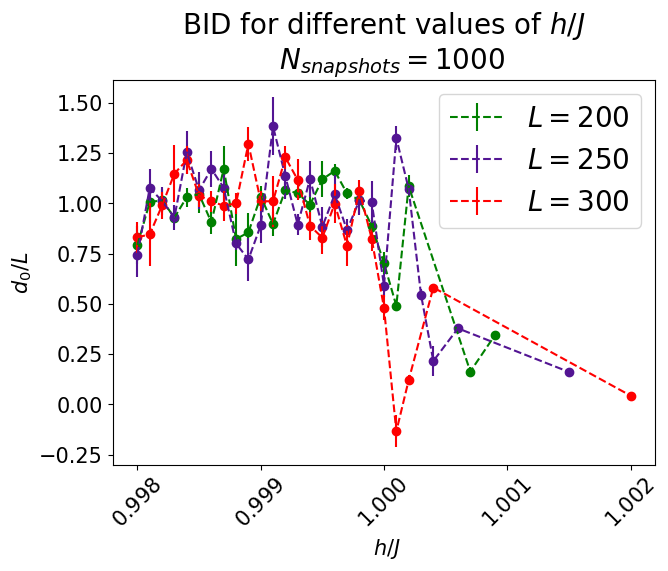

<Figure size 640x480 with 0 Axes>

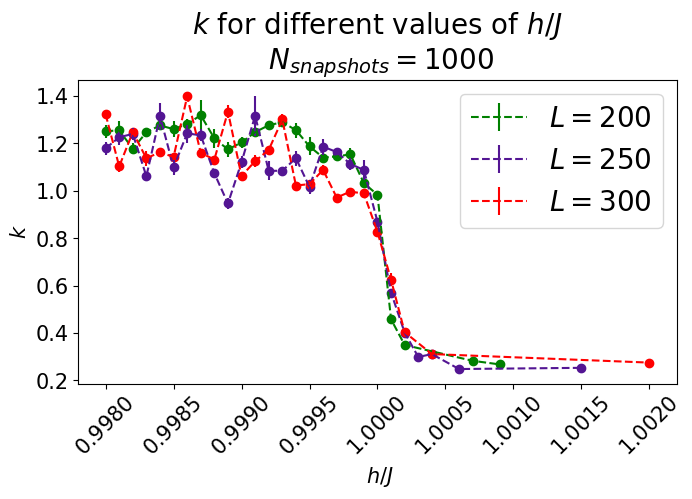

<Figure size 640x480 with 0 Axes>

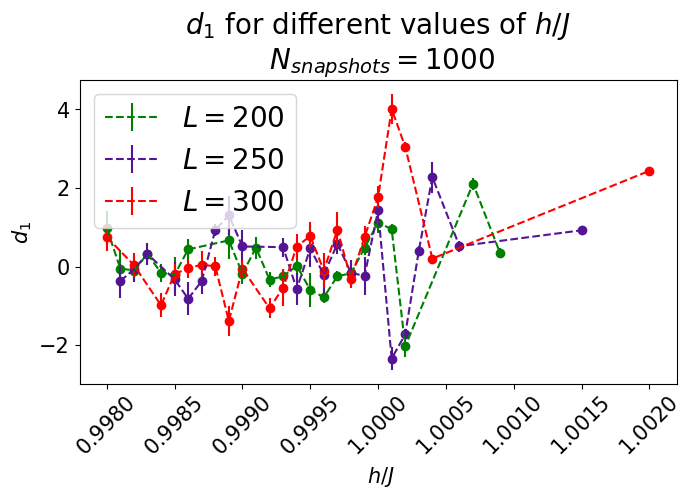

<Figure size 640x480 with 0 Axes>

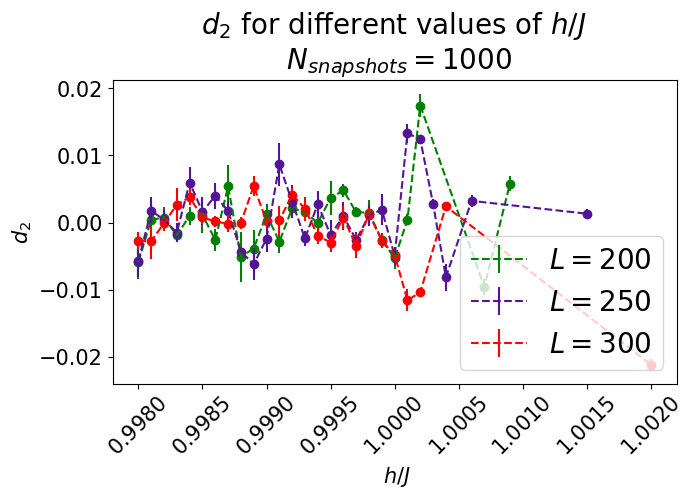

[1.51554170e-05 1.39841785e-05 2.82377678e-06 1.41996878e-05
 2.78390717e-05 9.39310330e-06 1.35583718e-05 7.56630495e-06
 4.68628986e-06 3.15547310e-05 1.19659463e-05 1.40275405e-05
 2.28885313e-05 1.34664714e-05 1.14308738e-05 1.57072656e-05
 1.08092803e-05 1.61223724e-05 7.49925853e-06 5.90559771e-06
 1.76179362e-04 6.51627397e-03 7.89659008e-04 3.22681738e-04
 7.44194275e-03]
[3.63330693e-05 6.56325143e-06 4.26150603e-06 9.18100416e-06
 2.87458038e-06 2.91945851e-05 1.04646570e-05 1.99190610e-05
 6.24694918e-06 6.30824729e-06 4.74625583e-06 3.79583475e-06
 7.65866550e-06 7.78992929e-06 9.55831864e-06 7.07890308e-06
 2.72025303e-05 6.05525759e-06 1.87543413e-05 3.27128523e-04
 7.31425957e-04 7.44226769e-03 7.56679752e-03]
[3.63330693e-05 6.56325143e-06 4.26150603e-06 9.18100416e-06
 2.87458038e-06 2.91945851e-05 1.04646570e-05 1.99190610e-05
 6.24694918e-06 6.30824729e-06 4.74625583e-06 3.79583475e-06
 7.65866550e-06 7.78992929e-06 9.55831864e-06 7.07890308e-06
 2.72025303e-05 6.055

<Figure size 640x480 with 0 Axes>

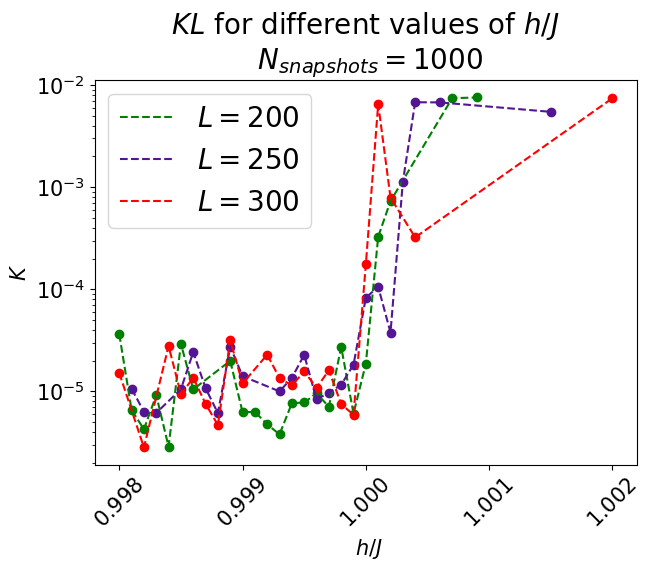

In [16]:
from matplotlib.ticker import ScalarFormatter

ID0=np.array(ID0)
DID0=np.array(DID0)
Ds=len(ID0[0,0,:])
print(Ds)
KL=np.array(KL)
deltaG=0.0001
xx=np.array([deltaG*G[a] for a in AA])
deltaKL=0.01
deltad1=0.5

plt.figure()
fig,axis=plt.subplots(1,1,figsize=(7,5))
plt.title("BID for different values of $h/J$ \n  $N_{snapshots}="+str(NS)+"$",fontsize=20)
plt.xlabel(" $h/J$",fontsize=15)
plt.ylabel("$d_0/L$",fontsize=15)
for i in range(len(l)):
    AuxKL=KL[i,:]
    AuxID=ID0[i,:,Ds-1]/l[i]
    AuxDID=DID0[i,:,Ds-1]/l[i]
    Auxx=xx

    Auxx=xx[AuxKL<deltaKL]
    AuxID=AuxID[AuxKL<deltaKL]
    AuxDID=AuxDID[AuxKL<deltaKL]
    AuxKL=AuxKL[AuxKL<deltaKL]
    
    Auxx=Auxx[AuxDID<deltad1]
    AuxID=AuxID[AuxDID<deltad1]
    AuxKL=AuxKL[AuxDID<deltad1]
    AuxDID=AuxDID[AuxDID<deltad1]

    axis.errorbar(Auxx,AuxID,yerr=AuxDID,linestyle="dashed",color=cmap(norm(l[i])),label="$L="+str(l[i])+"$")
    axis.scatter(Auxx,AuxID,color=cmap(norm(l[i])))    

axis.legend(fontsize=20)
# We change the fontsize of minor ticks label 
axis.tick_params(axis='x', which='major',rotation=45, labelsize=15)
axis.tick_params(axis='x', which='minor',rotation=45, labelsize=10)

axis.tick_params(axis='y', which='major', labelsize=15)
axis.tick_params(axis='y', which='minor', labelsize=10)

ax = plt.gca()  # Get current axis
ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.xaxis.get_offset_text().set_fontsize(12)  # Increase font size of the scale
ax.ticklabel_format(style='sci', axis='both', scilimits=(-6, 0))  # Force scientific notation
plt.savefig("plots/BID"+name_figs)
plt.show()

for dd in range(Ds-1):
    plt.figure()
    fig,axis=plt.subplots(1,1,figsize=(7,5))
    if dd==0:
        strdd="k"
    else:
        strdd="d_"+str(dd)
    plt.title("$"+strdd+"$"+" for different values of $h/J$ \n $N_{snapshots}="+str(NS)+"$",fontsize=20)
    plt.xlabel(" $h/J$",fontsize=15)
    plt.ylabel("$"+strdd+"$",fontsize=15)
    for i in range(len(l)):
    
        AuxKL=KL[i,:]
        AuxID=ID0[i,:,dd]
        AuxDID=DID0[i,:,dd]
        Auxx=xx

        Auxx=xx[AuxKL<deltaKL]
        AuxID=AuxID[AuxKL<deltaKL]
        AuxDID=AuxDID[AuxKL<deltaKL]
        AuxKL=AuxKL[AuxKL<deltaKL]
    
        Auxx=Auxx[AuxDID<deltad1]
        AuxID=AuxID[AuxDID<deltad1]
        AuxKL=AuxKL[AuxDID<deltad1]
        AuxDID=AuxDID[AuxDID<deltad1]

        axis.errorbar(Auxx,AuxID,yerr=AuxDID,linestyle="dashed",color=cmap(norm(l[i])),label="$L="+str(l[i])+"$")
        axis.scatter(Auxx,AuxID,color=cmap(norm(l[i])))
    axis.legend(fontsize=20)
# We change the fontsize of minor ticks label 
    ax = plt.gca()  # Get current axis
    axis.tick_params(axis='x', which='major',rotation=45, labelsize=15)
    axis.tick_params(axis='x', which='minor',rotation=45, labelsize=10)

    axis.tick_params(axis='y', which='major', labelsize=15)
    axis.tick_params(axis='y', which='minor', labelsize=10)

    axis.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    axis.ticklabel_format(style='sci', axis='x', scilimits=(-5, 6))  # Force scientific notation
    axis.xaxis.get_offset_text().set_fontsize(8)  # Increase font size of the scale

    plt.tight_layout()
    plt.savefig("plots/"+strdd+"L"+str(i)+name_figs)
    plt.show()


plt.figure()
fig,axis=plt.subplots(1,1,figsize=(7,5))
plt.title("$KL$ for different values of $h/J$ \n $N_{snapshots}="+str(NS)+"$",fontsize=20)
plt.xlabel(" $h/J$",fontsize=15)
plt.ylabel("$K$",fontsize=15)
plt.yscale("log")
for i in range(len(l)):
    print(AuxKL)
    AuxKL=KL[i,:]
    AuxID=ID0[i,:,1]
    AuxDID=DID0[i,:,1]
    Auxx=xx

    Auxx=xx[AuxKL<deltaKL]
    AuxID=AuxID[AuxKL<deltaKL]
    AuxDID=AuxDID[AuxKL<deltaKL]
    AuxKL=AuxKL[AuxKL<deltaKL]
    
    Auxx=Auxx[AuxDID<deltad1]
    AuxID=AuxID[AuxDID<deltad1]
    AuxKL=AuxKL[AuxDID<deltad1]
    AuxDID=AuxDID[AuxDID<deltad1]

    print(AuxKL)
    axis.errorbar(Auxx,AuxKL,linestyle="dashed",color=cmap(norm(l[i])),label="$L="+str(l[i])+"$")
    axis.scatter(Auxx,AuxKL,color=cmap(norm(l[i])))
    
axis.legend(fontsize=20)
# We change the fontsize of minor ticks label 
axis.tick_params(axis='x', which='major',rotation=45, labelsize=15)
axis.tick_params(axis='x', which='minor',rotation=45, labelsize=10)

axis.tick_params(axis='y', which='major', labelsize=15)
axis.tick_params(axis='y', which='minor', labelsize=10)

ax = plt.gca()  # Get current axis
ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.xaxis.get_offset_text().set_fontsize(12)  # Increase font size of the scale
ax.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))  # Force scientific notation
plt.savefig("plots/KL"+name_figs)
plt.show()



<>:10: SyntaxWarning: invalid escape sequence '\;'
<>:11: SyntaxWarning: invalid escape sequence '\;'
<>:10: SyntaxWarning: invalid escape sequence '\;'
<>:11: SyntaxWarning: invalid escape sequence '\;'
/tmp/ipykernel_2661/1064678569.py:10: SyntaxWarning: invalid escape sequence '\;'
  axes[0].set_title("BID FIT "+r"$L="+str(L)+"\;h/J=$"+r"${:.4e}$".format(G[AA[i]]*deltaG)+"\n"+"$d(r)=d_0+d_1 r$",fontsize=15)
/tmp/ipykernel_2661/1064678569.py:11: SyntaxWarning: invalid escape sequence '\;'
  axes[1].set_title("Hamming Distribution for \n"+"$L="+str(L)+"$  "+"$\;h/J=$"+r"${:.4e}$".format(G[AA[i]]*deltaG),fontsize=15)


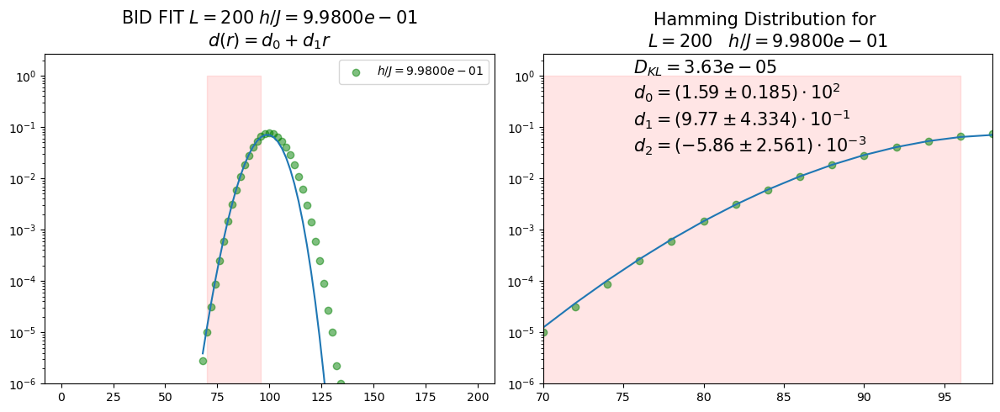

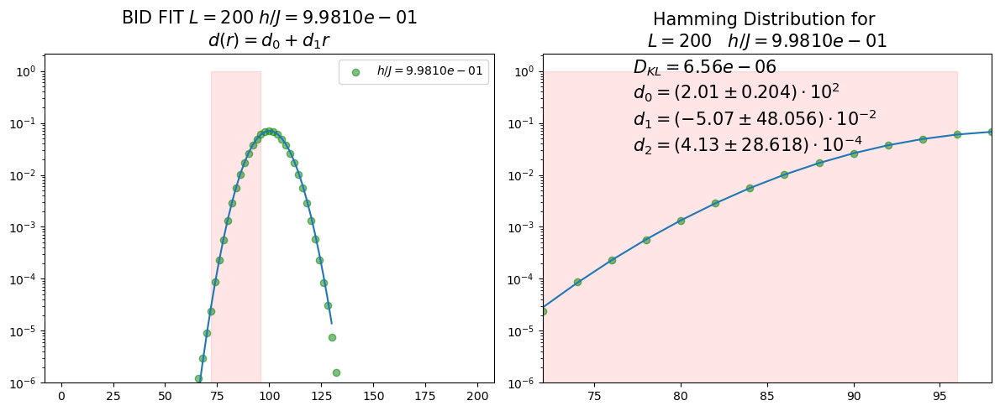

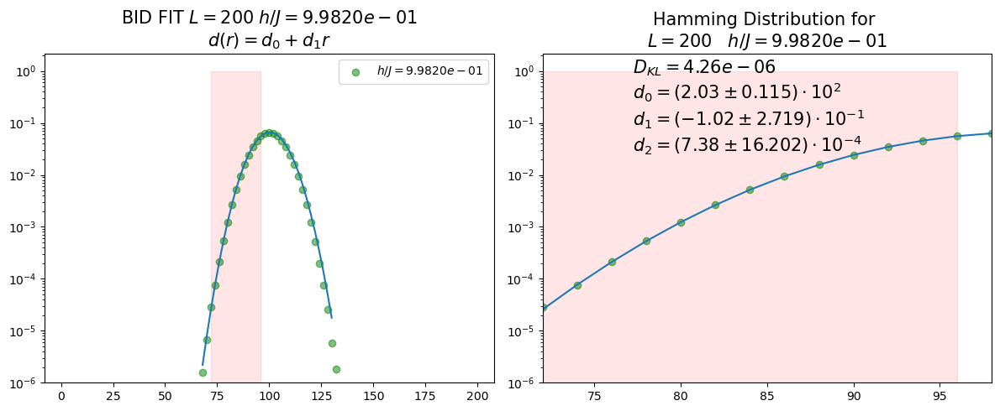

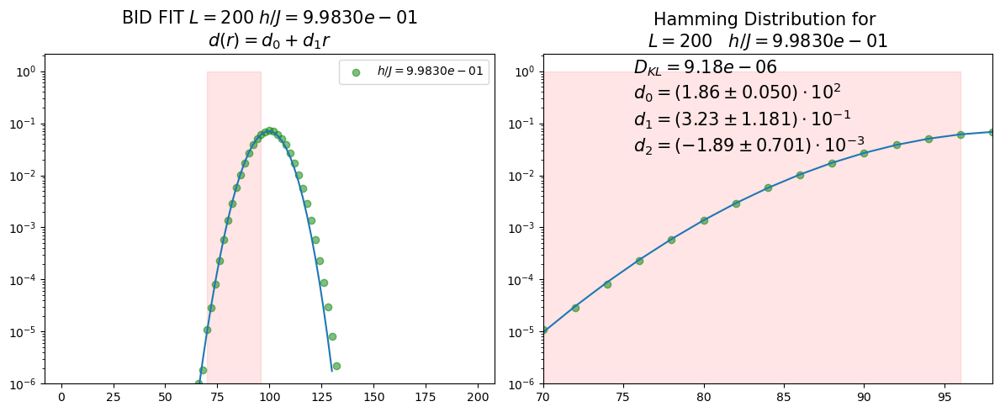

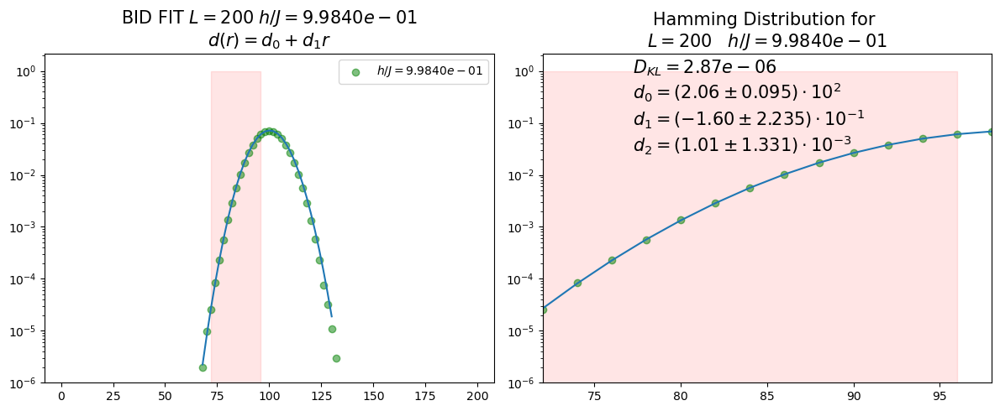

...

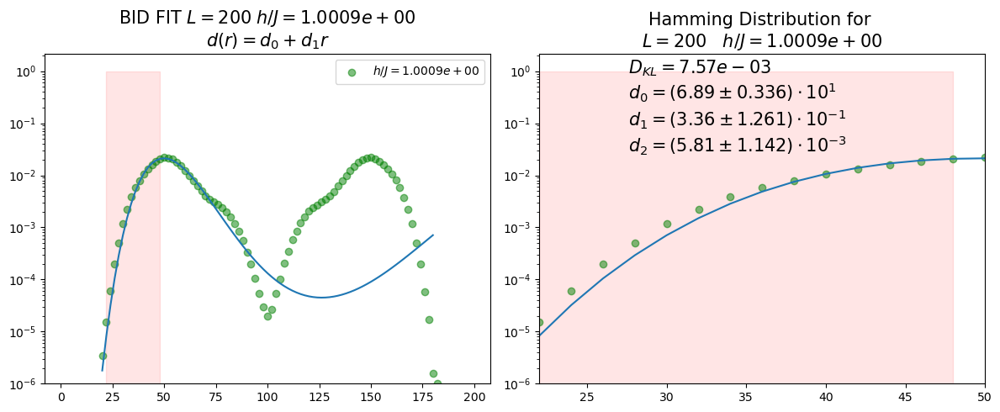

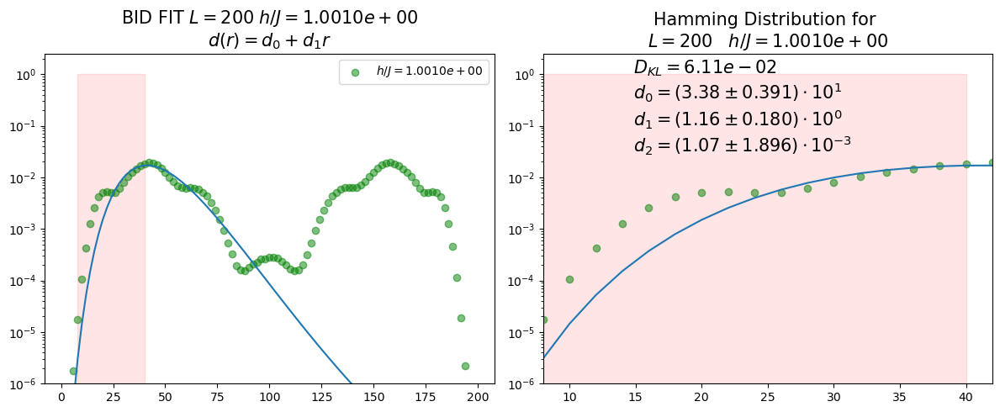

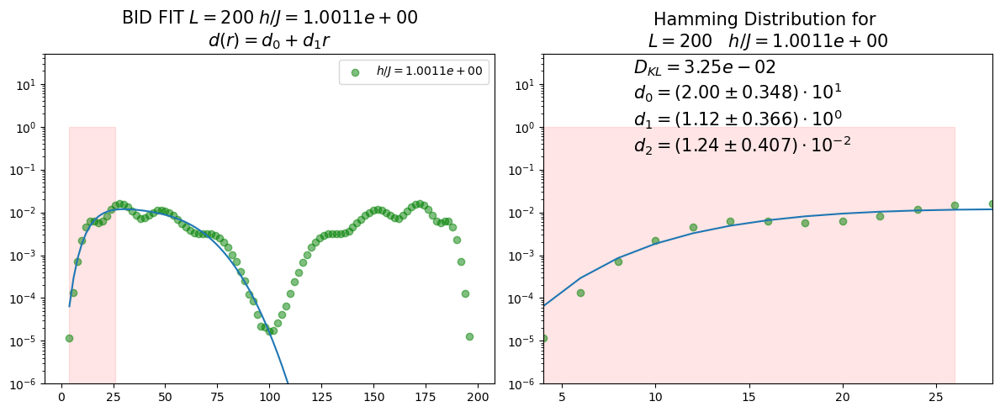

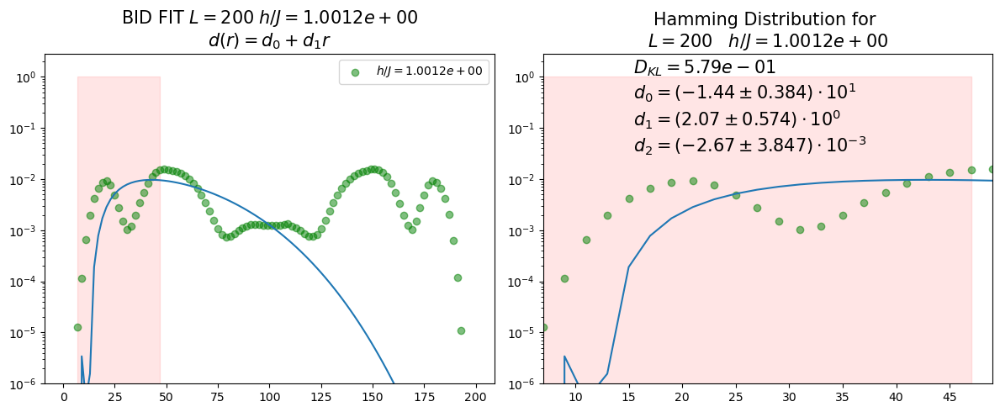

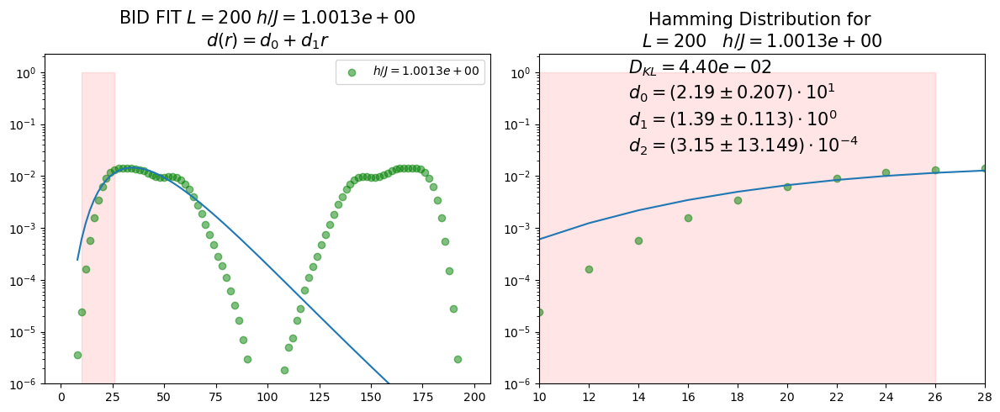

/tmp/ipykernel_2661/1064678569.py:58: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  axes[1].set_xlim([X[par_exp[0]], X[par_exp[1]]])  # Apply xlim from your commented-out code


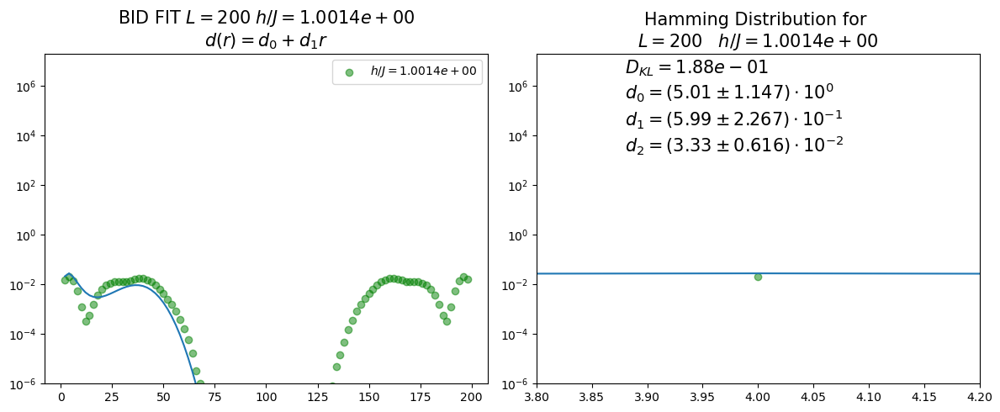

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar multiply
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))
/home/admin/anaconda3/lib/python3.12/site-packages/matplotlib/scale.py:255: RuntimeWarning: overflow encountered in power
  return np.power(self.base, values)


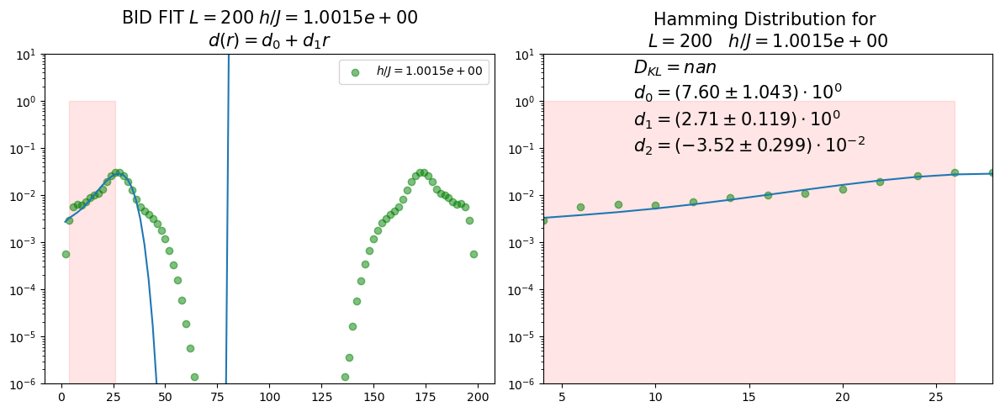

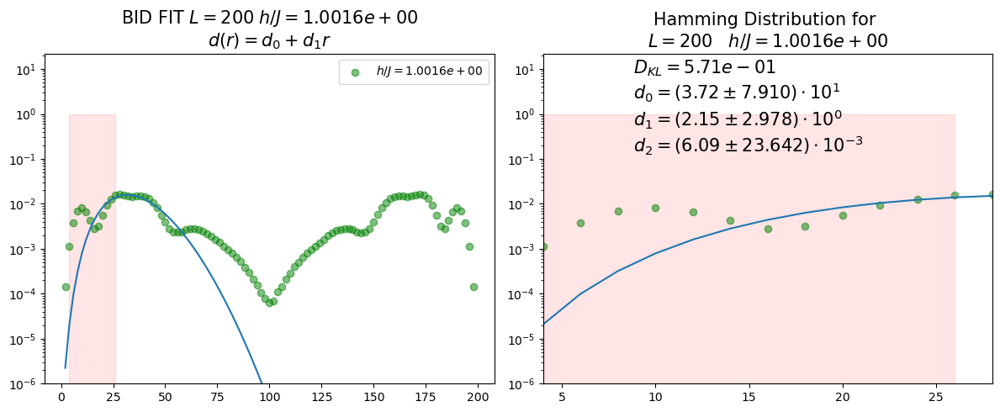

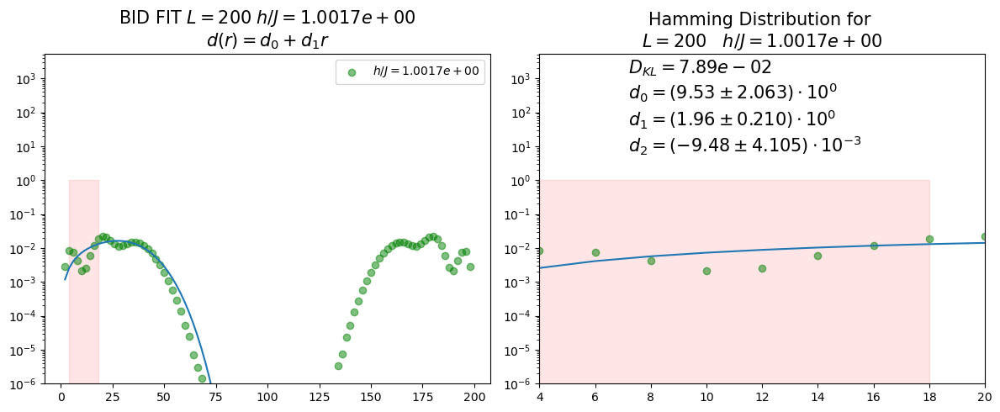

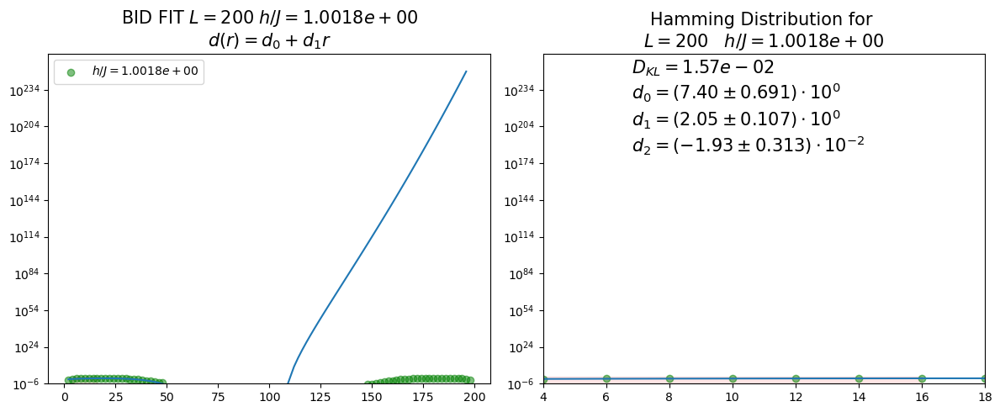

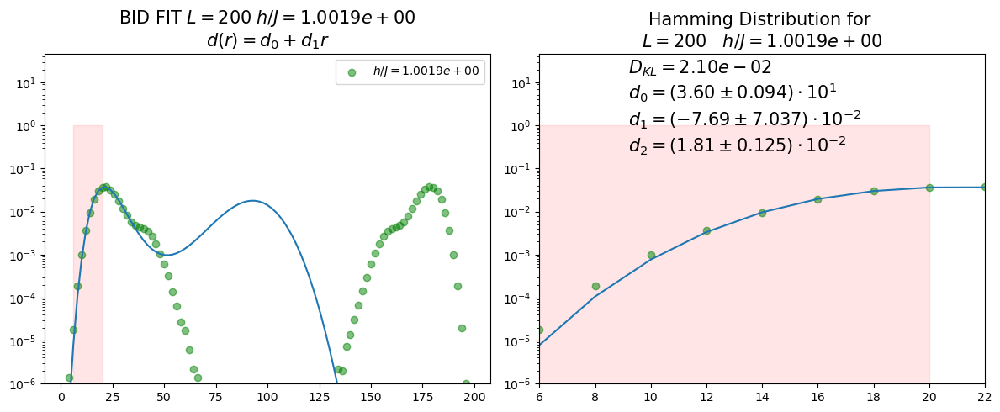

/tmp/ipykernel_2661/841889229.py:14: RuntimeWarning: overflow encountered in scalar power
  prob[i] *= (d_aux[i] + 1 - j) / (j * 2 ** (d_aux[i] / x_i))


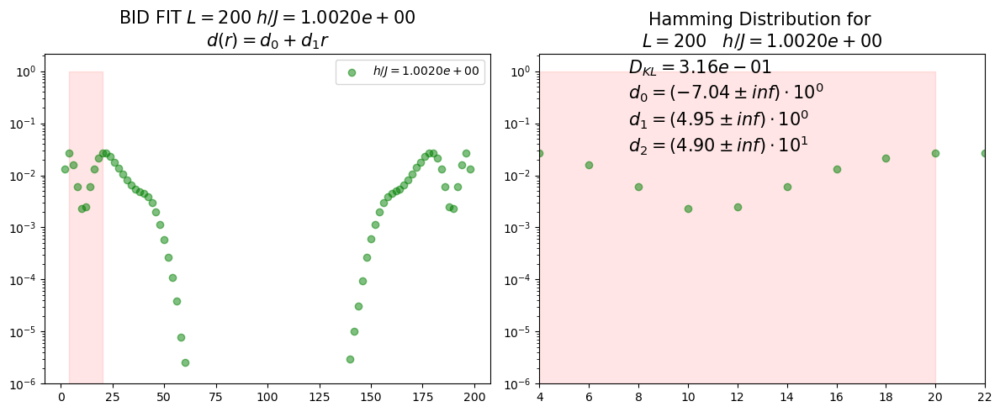

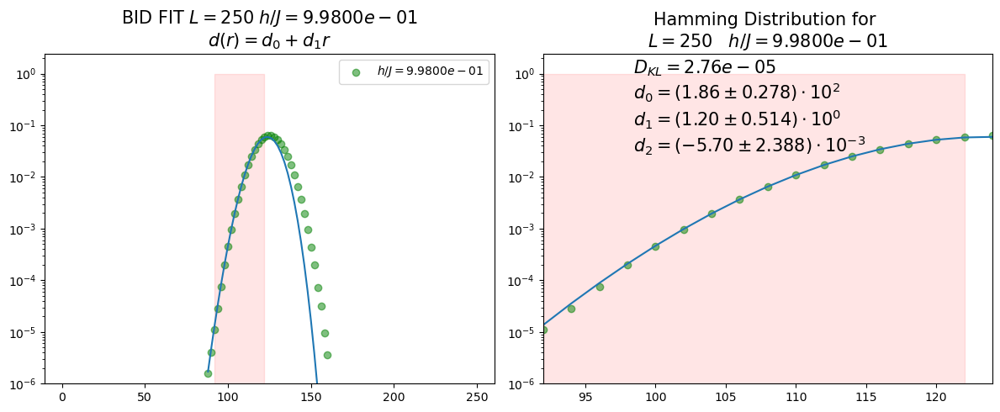

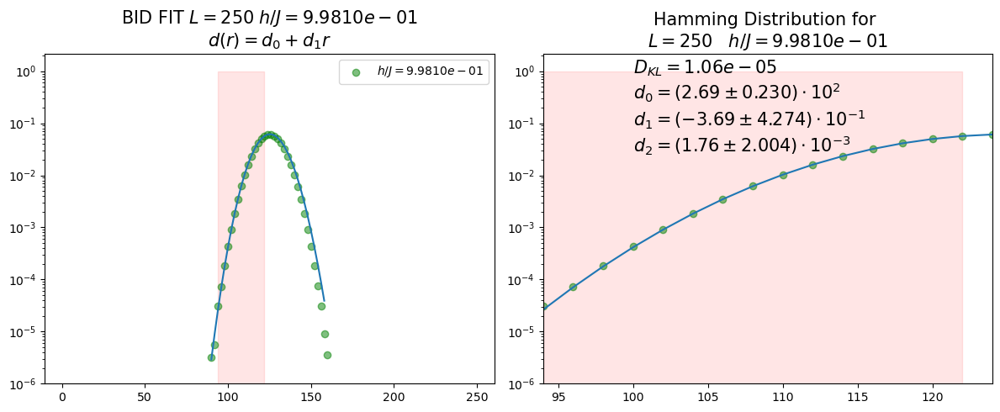

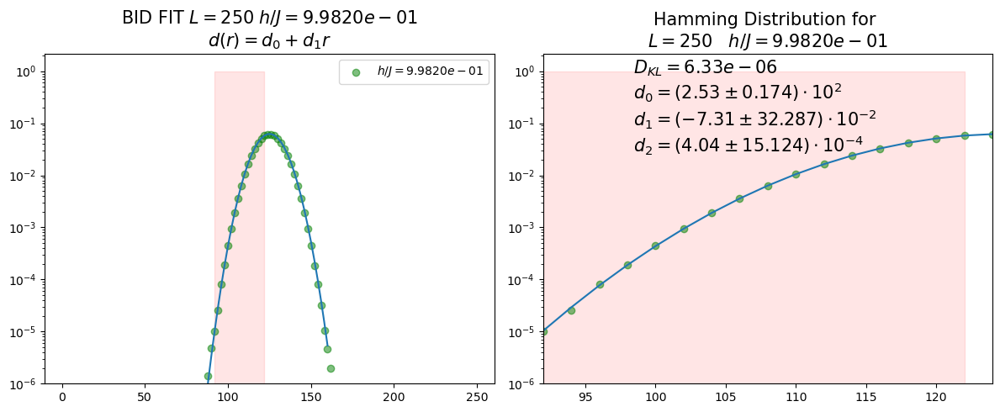

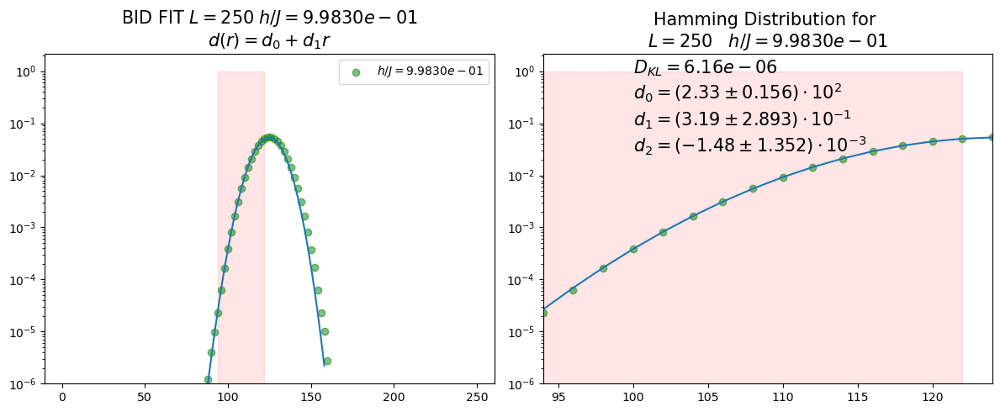

...

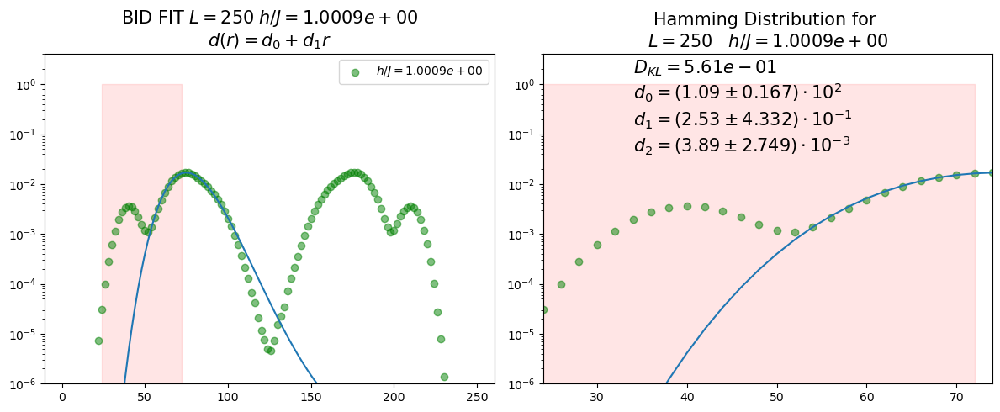

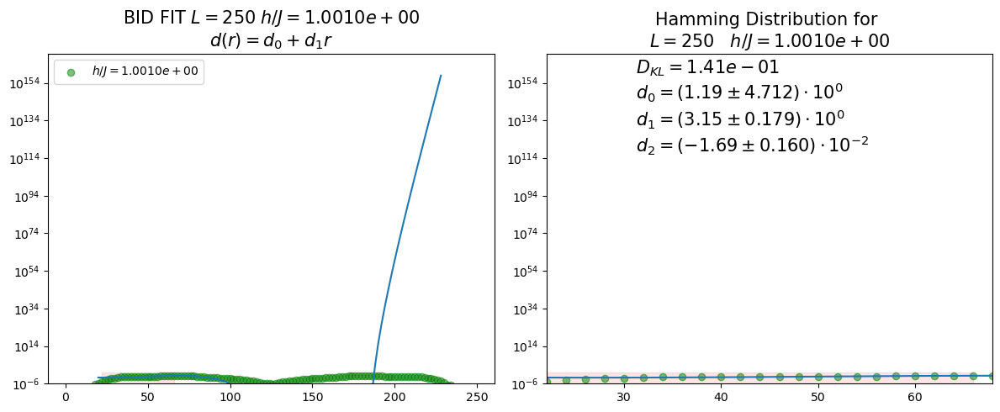

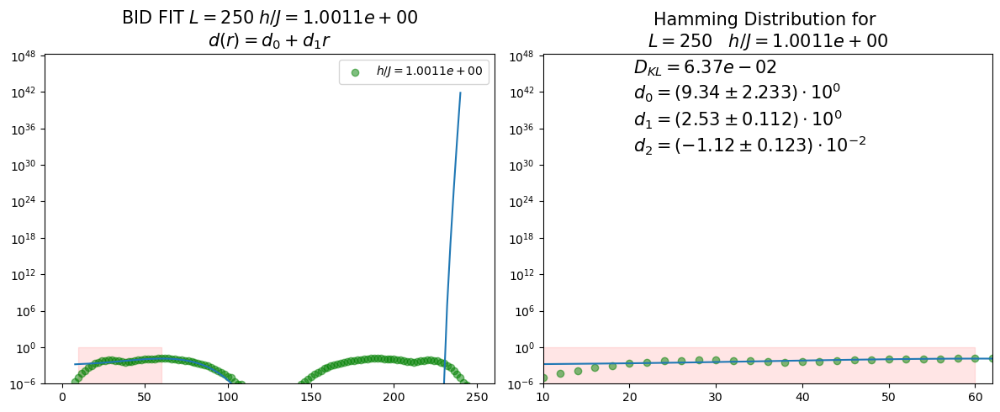

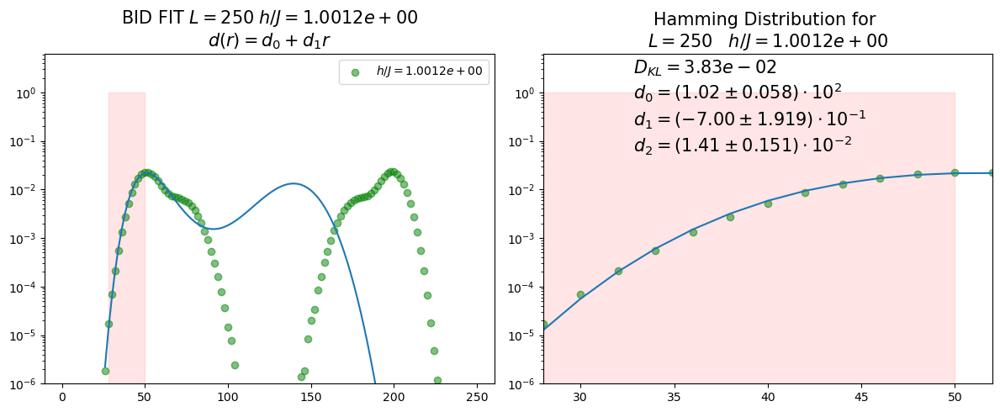

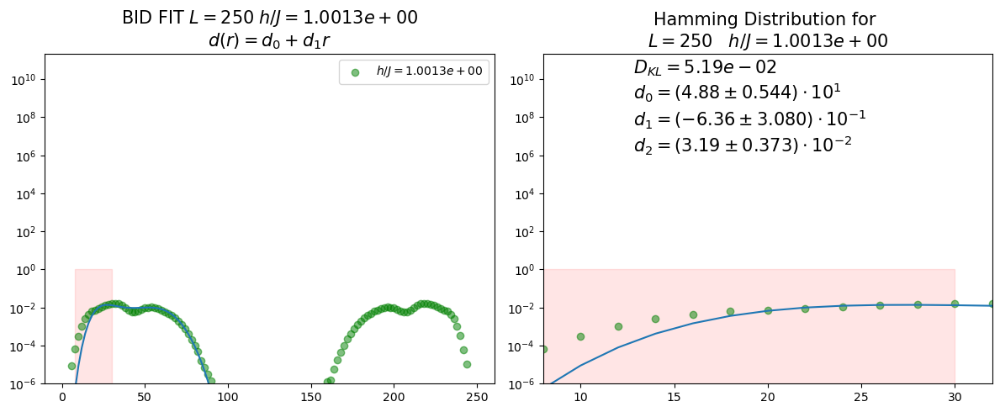

/home/admin/anaconda3/lib/python3.12/site-packages/matplotlib/ticker.py:2417: RuntimeWarning: overflow encountered in power
  ticklocs = b ** decades


OverflowError: cannot convert float infinity to integer

Error in callback <function _draw_all_if_interactive at 0x7f568548f7e0> (for post_execute), with arguments args (),kwargs {}:


OverflowError: cannot convert float infinity to integer

OverflowError: cannot convert float infinity to integer

<Figure size 1200x500 with 2 Axes>

In [17]:
#MODEL VALIDATION
for ll in range(len(l)):
    L=l[ll]
    for i in range(len(AA)):
    
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Create a figure with two subplots side by side

        # First plot (original)
        
        axes[0].set_title("BID FIT "+r"$L="+str(L)+"\;h/J=$"+r"${:.4e}$".format(G[AA[i]]*deltaG)+"\n"+"$d(r)=d_0+d_1 r$",fontsize=15)
        axes[1].set_title("Hamming Distribution for \n"+"$L="+str(L)+"$  "+"$\;h/J=$"+r"${:.4e}$".format(G[AA[i]]*deltaG),fontsize=15)
        par = initial_guess(PDF[ll][AA[i]], L*W, eps)

        expPDF = []
        X = []
        for j in range(L*W):
            if j % 2 == par[1] % 2 and j != 0:
                expPDF.append(PDF[ll][AA[i]][j])
                X.append(j)

        par_exp = initial_guess(expPDF, len(X), eps)
        Xexp = X[par_exp[0]:par_exp[1]]
        YPDF = expPDF[par_exp[0]:par_exp[1]]

        axes[0].fill_between(Xexp, 0, 1, color="red", alpha=0.1)
        axes[0].scatter(X, expPDF, label=r"$h/J=$"+r"${:.4e}$".format(G[AA[i]]*deltaG), color="green", alpha=0.5)

        xmin = 0
        xmax = len(X) - 1
        for jj in range(len(X)):
            if expPDF[xmin] > 10**(-6):
                break
            else:
                xmin += 1

        for jj in range(len(X)):
            if expPDF[xmax] > 10**(-6) or xmax == 0:
                break
            else:
                xmax -= 1

        if X[xmax] > int(L/2):
            xxmax = int(L/2)
        else:
            xxmax = X[xmax]

        axes[0].plot(X[xmin:xmax], exp_Ansatz(X[xmin:xmax], *ID0[ll][i]))
        axes[0].set_yscale("log")
        axes[0].set_ylim(bottom=10**(-6))
        axes[0].legend()

        # Second plot (with xlim)
        axes[1].fill_between(Xexp, 0, 1, color="red", alpha=0.1)
        axes[1].scatter(X, expPDF, label=r"$h/J=$"+r"${:.4e}$".format(G[AA[i]]*deltaG), color="green", alpha=0.5)
        axes[1].plot(X[xmin:xmax], exp_Ansatz(X[xmin:xmax], *ID0[ll][i]))
        
        axes[1].set_xscale("linear")  # Keep x-scale linear
        axes[1].set_xlim([X[par_exp[0]], X[par_exp[1]]])  # Apply xlim from your commented-out code
        axes[1].set_yscale("log")
        axes[1].set_ylim(bottom=10**(-6))

        axes[1].text(0.2,0.7, r"$D_{KL}=$"+r"${:.2e}$".format(KL[ll,i])+"\n"+r"$d_0="+sci_notation(ID0[ll,i,3],DID0[ll,i,3])+"$"+"\n"+r"$d_1="+sci_notation(ID0[ll,i,1],DID0[ll,i,1])+"$"+"\n"+r"$d_2="+sci_notation(ID0[ll,i,2],DID0[ll,i,2])+"$", fontsize=15, color="black",transform=axes[1].transAxes)
        


        
        plt.tight_layout()  # Adjust layout to prevent overlaplarFormatter(useMathText=True))
        ax.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))  # Force scientific notation

        plt.savefig("plots/HD_G"+str(G[AA[i]])+name_figs)
        plt.show()


In [ ]:
def sci_notation(value, uncertainty):
    """
    Formats a number and its uncertainty in scientific notation with proper parentheses.

    Parameters:
        value (float): The main value.
        uncertainty (float): The uncertainty in the value.

    Returns:
        str: A formatted string in LaTeX-style scientific notation.
    """
    if value == 0:
        return r"(0 \pm 0) \cdot 10^{0}"

    # Find the order of magnitude (exponent) of the value
    exponent = int(np.floor(np.log10(abs(value))))
    
    # Scale value and uncertainty to be in the range [1, 10)
    scaled_value = value / 10**exponent
    scaled_uncertainty = uncertainty / 10**exponent

    # Format the string
    formatted = r"({:.2f} \pm {:.3f}) \cdot 10^{{{:d}}}".format(scaled_value, scaled_uncertainty, exponent)
    return formatted

In [ ]:
sci_notation(4,0.1)